# Research Interest

Research Interest:

My research interest is applying GIS and data science techniques to study agriculture and land use dynamics. Agriculture is influenced by various spatial and temporal factors, including crop growth patterns, soil quality, water availability, land cover change, and the economic value of land. By integrating spatial datasets such as land parcels, remote sensing imagery, crop statistics, socio-economic indicators, etc, I aim to explore how agricultural land use evolves and relates to broader drivers such as climate variability, population growth, and market demand.

**Literature review:**

**Agricultural Economy and Production:**

1. Texas agriculture contributes over $30.8 billion annually to the economy.

**Agricultural Land and Land Use:**

1. Texas has 167.2 million acres of total land, with 125 million acres (75%) used for farming and ranching.

2. 3.7 million acres of working lands were lost between 1997 to 2022, including 1.8 million acres in the last five years (about 650 acres lost per day).

3. Agricultural land value rose 505% over 25 years—from $499/acre (1997) to 3,021/acre (2022).

4. Texas population increased 55%, from 19 million (1997) to 30 million (2022), intensifying land-use conversion

**Water Scarcity and Economic Impacts:**

1. In 2023 to 24, South Texas irrigation water losses led to 495.8 million in direct crop revenue losses and $993.2 million in total economic output loss.

2. The Ogallala Aquifer continues to decline due to overuse; irrigation demand remains the largest water use in Texas, projected to decline only 15% by 2070, while livestock water demand increases 15%.

#Area Of Interest

In [104]:
%%capture
#!pip install geopandas #==1.0.1
!pip install mapclassify #sometimes have to install library which you get from https://pypi.org/

In [105]:
import os, zipfile #basics
import pandas as pd #data management
import matplotlib.pyplot as plt #vis

import geopandas as gpd #gis/maps: a sister of pandas; does the job;
#tho not as fancy-interactive as folium or leafmap https://geopandas.org/

import mapclassify #need for thematic map classification

import seaborn as sns

#will display all output not just last command
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

from google.colab import files #to download from colab onto hd

#from google.colab import data_table
#data_table.enable_dataframe_formatter() #this enables spreadsheet view upon calling dataframe (without() )
from google.colab.data_table import DataTable
DataTable.max_columns = 250

In [106]:
#!python --version
gpd.__version__

'1.1.1'

In [107]:
! wget -q -O Texas_County_Boundaries_4845315375211121464.zip https://raw.githubusercontent.com/Nemipatel210/GIS/6c673d7fa088d4803b52ba23025623d675de0a7f/Texas_County_Boundaries_4845315375211121464.zip
zip_ref = zipfile.ZipFile('Texas_County_Boundaries_4845315375211121464.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping
!ls

County_Boundaries.cpg
County_Boundaries.dbf
County_Boundaries.prj
County_Boundaries.shp
County_Boundaries.shp.xml
County_Boundaries.shx
geo_export_5daba26a-1a9f-44f5-af78-b6c2b8a01b32.cpg
geo_export_5daba26a-1a9f-44f5-af78-b6c2b8a01b32.dbf
geo_export_5daba26a-1a9f-44f5-af78-b6c2b8a01b32.prj
geo_export_5daba26a-1a9f-44f5-af78-b6c2b8a01b32.shp
geo_export_5daba26a-1a9f-44f5-af78-b6c2b8a01b32.shx
major_aquifers.zip
NEW_major_aquifers_dd.dbf
NEW_major_aquifers_dd.prj
NEW_major_aquifers_dd.sbn
NEW_major_aquifers_dd.sbx
NEW_major_aquifers_dd.shp
NEW_major_aquifers_dd.shp.xml
NEW_major_aquifers_dd.shx
NEW_major_aquifers.lyr
readme.pdf
sample_data
TexasCountiesCartographic.zip
Texas_County_Boundaries_4845315375211121464.zip
TWDB_Groundwater.cpg
TWDB_Groundwater.dbf
TWDB_Groundwater.prj
TWDB_Groundwater.shp
TWDB_Groundwater.shx
TWDBGroundwater.zip
TxDOT_Urbanized_Areas.cpg
TxDOT_Urbanized_Areas.dbf
TxDOT_Urbanized_Areas.prj
TxDOT_Urbanized_Areas.shp
TxDOT_Urbanized_Areas.shp.xml
TxDOT_Urbanized_

In [108]:
txC0=gpd.read_file('County_Boundaries.shp')

<Axes: >

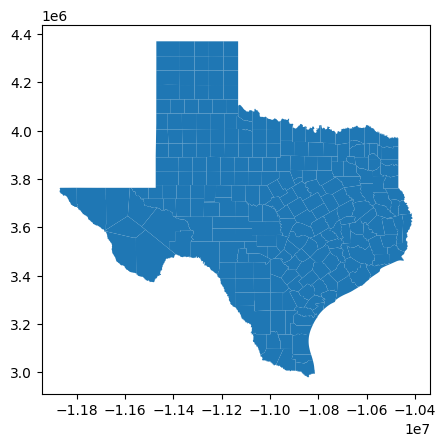

In [109]:
txC0.plot()

#Plotting Thematic Map

DATA.TEXAS.GOV:  https://data.texas.gov/dataset/Texas-Counties-Cartographic-Boundary-Map/sw7f-2kkd/about_data

In [110]:
#i found one and reposted on my website, download it onto colab:
! wget -q -O TexasCountiesCartographic.zip https://github.com/Nemipatel210/GIS/raw/59bf3c13164b92498dd27aaef7783f833d5a1852/TexasCountiesCartographic.zip
zip_ref = zipfile.ZipFile('TexasCountiesCartographic.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping
!ls

County_Boundaries.cpg
County_Boundaries.dbf
County_Boundaries.prj
County_Boundaries.shp
County_Boundaries.shp.xml
County_Boundaries.shx
geo_export_5daba26a-1a9f-44f5-af78-b6c2b8a01b32.cpg
geo_export_5daba26a-1a9f-44f5-af78-b6c2b8a01b32.dbf
geo_export_5daba26a-1a9f-44f5-af78-b6c2b8a01b32.prj
geo_export_5daba26a-1a9f-44f5-af78-b6c2b8a01b32.shp
geo_export_5daba26a-1a9f-44f5-af78-b6c2b8a01b32.shx
major_aquifers.zip
NEW_major_aquifers_dd.dbf
NEW_major_aquifers_dd.prj
NEW_major_aquifers_dd.sbn
NEW_major_aquifers_dd.sbx
NEW_major_aquifers_dd.shp
NEW_major_aquifers_dd.shp.xml
NEW_major_aquifers_dd.shx
NEW_major_aquifers.lyr
readme.pdf
sample_data
TexasCountiesCartographic.zip
Texas_County_Boundaries_4845315375211121464.zip
TWDB_Groundwater.cpg
TWDB_Groundwater.dbf
TWDB_Groundwater.prj
TWDB_Groundwater.shp
TWDB_Groundwater.shx
TWDBGroundwater.zip
TxDOT_Urbanized_Areas.cpg
TxDOT_Urbanized_Areas.dbf
TxDOT_Urbanized_Areas.prj
TxDOT_Urbanized_Areas.shp
TxDOT_Urbanized_Areas.shp.xml
TxDOT_Urbanized_

In [111]:
txC1=gpd.read_file('geo_export_5daba26a-1a9f-44f5-af78-b6c2b8a01b32.shp')
txC1.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 254 entries, 0 to 253
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   statefp   254 non-null    object  
 1   countyfp  254 non-null    object  
 2   countyns  254 non-null    object  
 3   affgeoid  254 non-null    object  
 4   geoid     254 non-null    object  
 5   name      254 non-null    object  
 6   lsad      254 non-null    object  
 7   aland     254 non-null    object  
 8   awater    254 non-null    object  
 9   geometry  254 non-null    geometry
dtypes: geometry(1), object(9)
memory usage: 20.0+ KB


In [112]:
txC1.head(5)

,statefp,countyfp,countyns,affgeoid,geoid,name,lsad,aland,awater,geometry
0,48,421,01383996,0500000US48421,48421,Sherman,06,2390651189,428754,"POLYGON ((-102.16246 36.50033, -102.03234 36.5..."
1,48,493,01384032,0500000US48493,48493,Wilson,06,2081662847,12111367,"POLYGON ((-98.40734 29.11444, -98.13417 29.441..."
2,48,115,01383843,0500000US48115,48115,Dawson,06,2331781556,4720730,"POLYGON ((-102.20852 32.95896, -102.07621 32.9..."
3,48,069,01383820,0500000US48069,48069,Castro,06,2316573415,12584396,"POLYGON ((-102.52518 34.74693, -102.16884 34.7..."
4,48,279,01383926,0500000US48279,48279,Lamb,06,2631897577,3973764,"POLYGON ((-102.61515 34.31289, -102.52563 34.3..."


## Thematic Map of Land Area by County

The map shows the land area of each of Texas's 254 counties. The color of each county corresponds to its size in square meters, with the smallest counties appearing dark purple and the largest counties, particularly in West Texas, appearing yellow. For example, Brewster County is the largest county, and its size is over 6,100 square miles (or over 16,000 square kilometers). In contrast, the smallest county, Rockwall County, is less than 150 square miles. The map visually demonstrates the vast difference in land area between Texas counties.

<Axes: >

Text(0.5, 1.0, 'Thematic Map of Land Area by County')

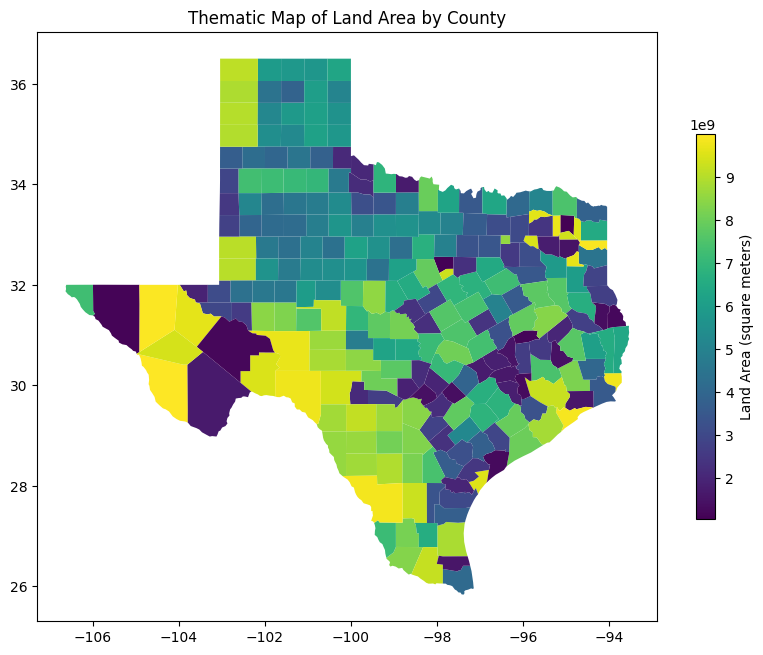

In [113]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
# Plot without the legend argument in plot()
txC1.plot(column='aland', ax=ax, cmap='viridis')

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=txC1['aland'].min(), vmax=txC1['aland'].max()))
sm._A = [] # Hack to make the colorbar work with ScalarMappable
cbar = fig.colorbar(sm, ax=ax, shrink=0.5) # Use shrink here
cbar.set_label('Land Area (square meters)')


ax.set_title('Thematic Map of Land Area by County')
plt.show()

## Thematic Map of water Area by County

This is a thematic map of Texas that visualizes the amount of water area within each county. The map uses a color gradient of blues, where darker shades represent a greater surface area of water, while lighter shades and white indicate less water. The legend on the right confirms that the measurement is in square meters. The map's pattern clearly shows that counties in the eastern and southeastern parts of the state, where major reservoirs, lakes, and rivers are located, have a significantly larger water area. In contrast, counties in the arid western and panhandle regions contain very little surface water, appearing as light blue or white on the map. This visual representation effectively highlights the geographical distribution of Texas's water resources.

<Axes: >

Text(0.5, 1.0, 'Thematic Map of Water Area by County')

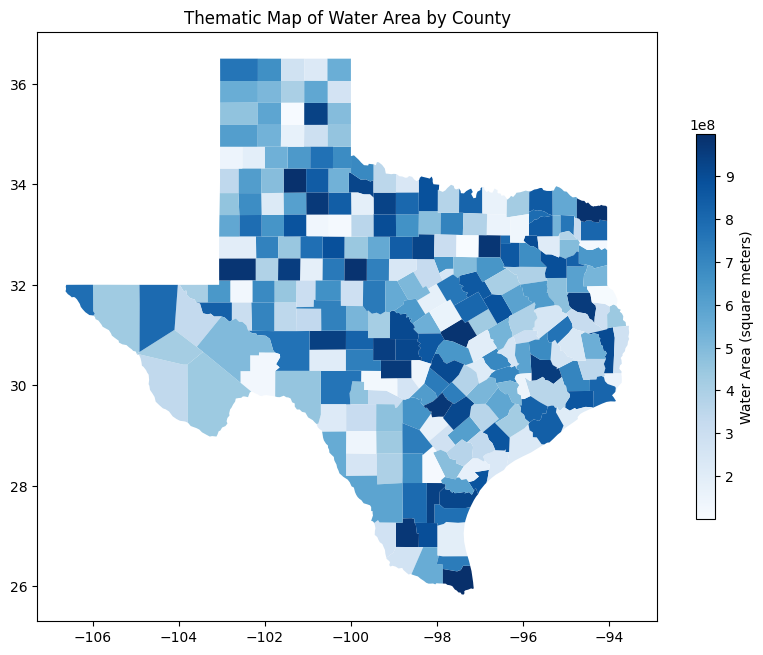

In [114]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
# Plot without the legend argument in plot()
txC1.plot(column='awater', ax=ax, cmap='Blues')

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=txC1['awater'].min(), vmax=txC1['awater'].max()))
sm._A = [] # Hack to make the colorbar work with ScalarMappable
cbar = fig.colorbar(sm, ax=ax, shrink=0.5) # Use shrink here
cbar.set_label('Water Area (square meters)')


ax.set_title('Thematic Map of Water Area by County')
plt.show()

#Merging (Annotate, Distribution Included)

USDA: https://www.nass.usda.gov/Statistics_by_State/Texas/index.php

In [115]:
url = 'https://raw.githubusercontent.com/Nemipatel210/GIS/d6ed8efcfb64d4825796df322005e76aa96f954f/agri_land_area.csv'
area_2022_df = pd.read_csv(url)
display(area_2022_df.head(5))

,Program,Year,Period,Week Ending,Geo Level,State,State ANSI,Ag District,Ag District Code,County,...,Zip Code,Region,watershed_code,Watershed,Commodity,Data Item,Domain,Domain Category,Value,CV (%)
0,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BELL,...,NaN,NaN,0,NaN,AG LAND,AG LAND - ACRES,IRRIGATION STATUS,IRRIGATION STATUS: (ANY ON OPERATION),"5,583",22.9
1,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BOSQUE,...,NaN,NaN,0,NaN,AG LAND,AG LAND - ACRES,IRRIGATION STATUS,IRRIGATION STATUS: (ANY ON OPERATION),"37,171",22.9
2,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,COLLIN,...,NaN,NaN,0,NaN,AG LAND,AG LAND - ACRES,IRRIGATION STATUS,IRRIGATION STATUS: (ANY ON OPERATION),"7,657",22.9
3,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,COOKE,...,NaN,NaN,0,NaN,AG LAND,AG LAND - ACRES,IRRIGATION STATUS,IRRIGATION STATUS: (ANY ON OPERATION),"35,026",22.9
4,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,CORYELL,...,NaN,NaN,0,NaN,AG LAND,AG LAND - ACRES,IRRIGATION STATUS,IRRIGATION STATUS: (ANY ON OPERATION),"43,180",22.9


In [116]:
area_2022_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253 entries, 0 to 252
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Program           253 non-null    object 
 1   Year              253 non-null    int64  
 2   Period            253 non-null    object 
 3   Week Ending       0 non-null      float64
 4   Geo Level         253 non-null    object 
 5   State             253 non-null    object 
 6   State ANSI        253 non-null    int64  
 7   Ag District       253 non-null    object 
 8   Ag District Code  253 non-null    int64  
 9   County            253 non-null    object 
 10  County ANSI       253 non-null    int64  
 11  Zip Code          0 non-null      float64
 12  Region            0 non-null      float64
 13  watershed_code    253 non-null    int64  
 14  Watershed         0 non-null      float64
 15  Commodity         253 non-null    object 
 16  Data Item         253 non-null    object 
 1

In [117]:
url = 'https://raw.githubusercontent.com/Nemipatel210/GIS/984dcc3aa5ee5cb814d0f6fe0653ce9c8ca02af3/croptotal2022.csv'
crop2022_df = pd.read_csv(url)
display(crop2022_df.head(5))

,Program,Year,Period,Week Ending,Geo Level,State,State ANSI,Ag District,Ag District Code,County,...,Zip Code,Region,watershed_code,Watershed,Commodity,Data Item,Domain,Domain Category,Value,CV (%)
0,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BELL,...,NaN,NaN,0,NaN,CROP TOTALS,"CROP TOTALS - SALES, MEASURED IN $",TOTAL,NOT SPECIFIED,"49,734,000",(L)
1,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BOSQUE,...,NaN,NaN,0,NaN,CROP TOTALS,"CROP TOTALS - SALES, MEASURED IN $",TOTAL,NOT SPECIFIED,"21,771,000",(L)
2,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,COLLIN,...,NaN,NaN,0,NaN,CROP TOTALS,"CROP TOTALS - SALES, MEASURED IN $",TOTAL,NOT SPECIFIED,"45,111,000",(L)
3,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,COOKE,...,NaN,NaN,0,NaN,CROP TOTALS,"CROP TOTALS - SALES, MEASURED IN $",TOTAL,NOT SPECIFIED,"19,860,000",(L)
4,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,CORYELL,...,NaN,NaN,0,NaN,CROP TOTALS,"CROP TOTALS - SALES, MEASURED IN $",TOTAL,NOT SPECIFIED,"16,052,000",(L)


In [118]:
tx = txC0.sort_values('CNTY_NM')
crop2022_df = crop2022_df.sort_values('County')

In [119]:
tx['CNTY_NM'] = tx['CNTY_NM'].str.upper()
crop2022_df['County'] = crop2022_df['County'].str.upper()

In [120]:
tx.head(5)

,CMPTRL_CNT,DPS_CNTY_N,FIPS_ST_CN,TXDOT_CNTY,TXDOT_DIST,CNTY_NM,CNTY_NBR,DIST_NBR,GID,geometry
155,1,1,48001,1,10,ANDERSON,1,10,136,"POLYGON ((-10622770.07 3774372.952, -10622743...."
101,2,2,48003,2,6,ANDREWS,2,6,155,"POLYGON ((-11452352.064 3832169.96, -11452055...."
124,3,3,48005,3,11,ANGELINA,3,11,105,"POLYGON ((-10560243.006 3701241.912, -10560220..."
82,4,4,48007,4,16,ARANSAS,4,16,15,"POLYGON ((-10775558.316 3283921.376, -10776779..."
222,5,5,48009,5,3,ARCHER,5,3,208,"POLYGON ((-10956443.534 3973368.927, -10956442..."


In [121]:
crop2022_df.head(5)

,Program,Year,Period,Week Ending,Geo Level,State,State ANSI,Ag District,Ag District Code,County,...,Zip Code,Region,watershed_code,Watershed,Commodity,Data Item,Domain,Domain Category,Value,CV (%)
49,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,EAST TEXAS NORTH,51,ANDERSON,...,NaN,NaN,0,NaN,CROP TOTALS,"CROP TOTALS - SALES, MEASURED IN $",TOTAL,NOT SPECIFIED,"24,811,000",(L)
199,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,SOUTHERN HIGH PLAINS,12,ANDREWS,...,NaN,NaN,0,NaN,CROP TOTALS,"CROP TOTALS - SALES, MEASURED IN $",TOTAL,NOT SPECIFIED,"5,343,000",(L)
73,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,EAST TEXAS SOUTH,52,ANGELINA,...,NaN,NaN,0,NaN,CROP TOTALS,"CROP TOTALS - SALES, MEASURED IN $",TOTAL,NOT SPECIFIED,"6,298,000",(L)
25,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,COASTAL BEND,82,ARANSAS,...,NaN,NaN,0,NaN,CROP TOTALS,"CROP TOTALS - SALES, MEASURED IN $",TOTAL,NOT SPECIFIED,"688,000",(L)
30,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,CROSS TIMBERS,30,ARCHER,...,NaN,NaN,0,NaN,CROP TOTALS,"CROP TOTALS - SALES, MEASURED IN $",TOTAL,NOT SPECIFIED,"8,344,000",(L)


In [122]:
tx_crop2022 = tx.merge(crop2022_df, left_on='CNTY_NM', right_on='County', how='inner')

In [123]:
tx_crop2022_plot = tx_crop2022[['CNTY_NM', 'geometry', 'Value']]
display(tx_crop2022_plot.head(5))

,CNTY_NM,geometry,Value
0,ANDERSON,"POLYGON ((-10622770.07 3774372.952, -10622743....","24,811,000"
1,ANDREWS,"POLYGON ((-11452352.064 3832169.96, -11452055....","5,343,000"
2,ANGELINA,"POLYGON ((-10560243.006 3701241.912, -10560220...","6,298,000"
3,ARANSAS,"POLYGON ((-10775558.316 3283921.376, -10776779...","688,000"
4,ARCHER,"POLYGON ((-10956443.534 3973368.927, -10956442...","8,344,000"


In [124]:
tx_crop2022_plot['Value'] = tx_crop2022_plot['Value'].astype(str).str.replace(',', '', regex=False).str.replace(' (D)', '', regex=False)
tx_crop2022_plot['Value'] = pd.to_numeric(tx_crop2022_plot['Value'])
display(tx_crop2022_plot.head())

/usr/local/lib/python3.12/dist-packages/geopandas/geodataframe.py:1968: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,CNTY_NM,geometry,Value
0,ANDERSON,"POLYGON ((-10622770.07 3774372.952, -10622743....",24811000.0
1,ANDREWS,"POLYGON ((-11452352.064 3832169.96, -11452055....",5343000.0
2,ANGELINA,"POLYGON ((-10560243.006 3701241.912, -10560220...",6298000.0
3,ARANSAS,"POLYGON ((-10775558.316 3283921.376, -10776779...",688000.0
4,ARCHER,"POLYGON ((-10956443.534 3973368.927, -10956442...",8344000.0


In [125]:
merged_df = area_2022_df.merge(tx_crop2022_plot, left_on='County', right_on='CNTY_NM', how='outer', indicator=True)
display(merged_df.head())

,Program,Year,Period,Week Ending,Geo Level,State,State ANSI,Ag District,Ag District Code,County,...,Commodity,Data Item,Domain,Domain Category,Value_x,CV (%),CNTY_NM,geometry,Value_y,_merge
0,CENSUS,2022.0,YEAR,NaN,COUNTY,TEXAS,48.0,EAST TEXAS NORTH,51.0,ANDERSON,...,AG LAND,AG LAND - ACRES,IRRIGATION STATUS,IRRIGATION STATUS: (ANY ON OPERATION),"32,469",22.9,ANDERSON,"POLYGON ((-10622770.07 3774372.952, -10622743....",24811000.0,both
1,CENSUS,2022.0,YEAR,NaN,COUNTY,TEXAS,48.0,SOUTHERN HIGH PLAINS,12.0,ANDREWS,...,AG LAND,AG LAND - ACRES,IRRIGATION STATUS,IRRIGATION STATUS: (ANY ON OPERATION),"156,497",22.9,ANDREWS,"POLYGON ((-11452352.064 3832169.96, -11452055....",5343000.0,both
2,CENSUS,2022.0,YEAR,NaN,COUNTY,TEXAS,48.0,EAST TEXAS SOUTH,52.0,ANGELINA,...,AG LAND,AG LAND - ACRES,IRRIGATION STATUS,IRRIGATION STATUS: (ANY ON OPERATION),"1,722",22.9,ANGELINA,"POLYGON ((-10560243.006 3701241.912, -10560220...",6298000.0,both
3,CENSUS,2022.0,YEAR,NaN,COUNTY,TEXAS,48.0,COASTAL BEND,82.0,ARANSAS,...,AG LAND,AG LAND - ACRES,IRRIGATION STATUS,IRRIGATION STATUS: (ANY ON OPERATION),63,22.9,ARANSAS,"POLYGON ((-10775558.316 3283921.376, -10776779...",688000.0,both
4,CENSUS,2022.0,YEAR,NaN,COUNTY,TEXAS,48.0,CROSS TIMBERS,30.0,ARCHER,...,AG LAND,AG LAND - ACRES,IRRIGATION STATUS,IRRIGATION STATUS: (ANY ON OPERATION),"46,951",22.9,ARCHER,"POLYGON ((-10956443.534 3973368.927, -10956442...",8344000.0,both


In [126]:
merged_df_selected = merged_df[['County', 'Value_x', 'Value_y', 'geometry']]
display(merged_df_selected.head())

,County,Value_x,Value_y,geometry
0,ANDERSON,"32,469",24811000.0,"POLYGON ((-10622770.07 3774372.952, -10622743...."
1,ANDREWS,"156,497",5343000.0,"POLYGON ((-11452352.064 3832169.96, -11452055...."
2,ANGELINA,"1,722",6298000.0,"POLYGON ((-10560243.006 3701241.912, -10560220..."
3,ARANSAS,63,688000.0,"POLYGON ((-10775558.316 3283921.376, -10776779..."
4,ARCHER,"46,951",8344000.0,"POLYGON ((-10956443.534 3973368.927, -10956442..."


In [127]:
merged_df_selected['Value_x'] = pd.to_numeric(merged_df_selected['Value_x'].astype(str).str.replace(',', '', regex=False).str.replace(r'\(D\)', '', regex=True), errors='coerce')
merged_df_selected['Value_y'] = pd.to_numeric(merged_df_selected['Value_y'].astype(str).str.replace(',', '', regex=False).str.replace(r'\(D\)', '', regex=True), errors='coerce')
display(merged_df_selected.head())

/tmp/ipython-input-972204106.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipython-input-972204106.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,County,Value_x,Value_y,geometry
0,ANDERSON,32469.0,24811000.0,"POLYGON ((-10622770.07 3774372.952, -10622743...."
1,ANDREWS,156497.0,5343000.0,"POLYGON ((-11452352.064 3832169.96, -11452055...."
2,ANGELINA,1722.0,6298000.0,"POLYGON ((-10560243.006 3701241.912, -10560220..."
3,ARANSAS,63.0,688000.0,"POLYGON ((-10775558.316 3283921.376, -10776779..."
4,ARCHER,46951.0,8344000.0,"POLYGON ((-10956443.534 3973368.927, -10956442..."


In [128]:
merged_df_selected['value_ratio'] = merged_df_selected['Value_y'] / merged_df_selected['Value_x']
merged_df_selected['value_ratio'] = merged_df_selected['value_ratio'].fillna(0).astype(int)
display(merged_df_selected.head())

/tmp/ipython-input-3062701257.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipython-input-3062701257.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,County,Value_x,Value_y,geometry,value_ratio
0,ANDERSON,32469.0,24811000.0,"POLYGON ((-10622770.07 3774372.952, -10622743....",764
1,ANDREWS,156497.0,5343000.0,"POLYGON ((-11452352.064 3832169.96, -11452055....",34
2,ANGELINA,1722.0,6298000.0,"POLYGON ((-10560243.006 3701241.912, -10560220...",3657
3,ARANSAS,63.0,688000.0,"POLYGON ((-10775558.316 3283921.376, -10776779...",10920
4,ARCHER,46951.0,8344000.0,"POLYGON ((-10956443.534 3973368.927, -10956442...",177


In [129]:
# Find the index of the row with the maximum 'value_ratio'
max_ratio_index = merged_df_selected['value_ratio'].idxmax()

# Select the row at that index
row_with_max_ratio = merged_df_selected.loc[max_ratio_index]

# Print the resulting row
print(row_with_max_ratio)

County                                                   KLEBERG
Value_x                                                    325.0
Value_y                                               16377000.0
geometry       POLYGON ((-10900959.751064774 3201721.91424788...
value_ratio                                                50390
Name: 136, dtype: object


<Axes: >

Text(0.5, 1.0, 'Thematic Map of Crop Value to Agricultural Land Ratio by County')

Text(-10875811.90125047, 3176899.1911818213, 'KLEBERG')

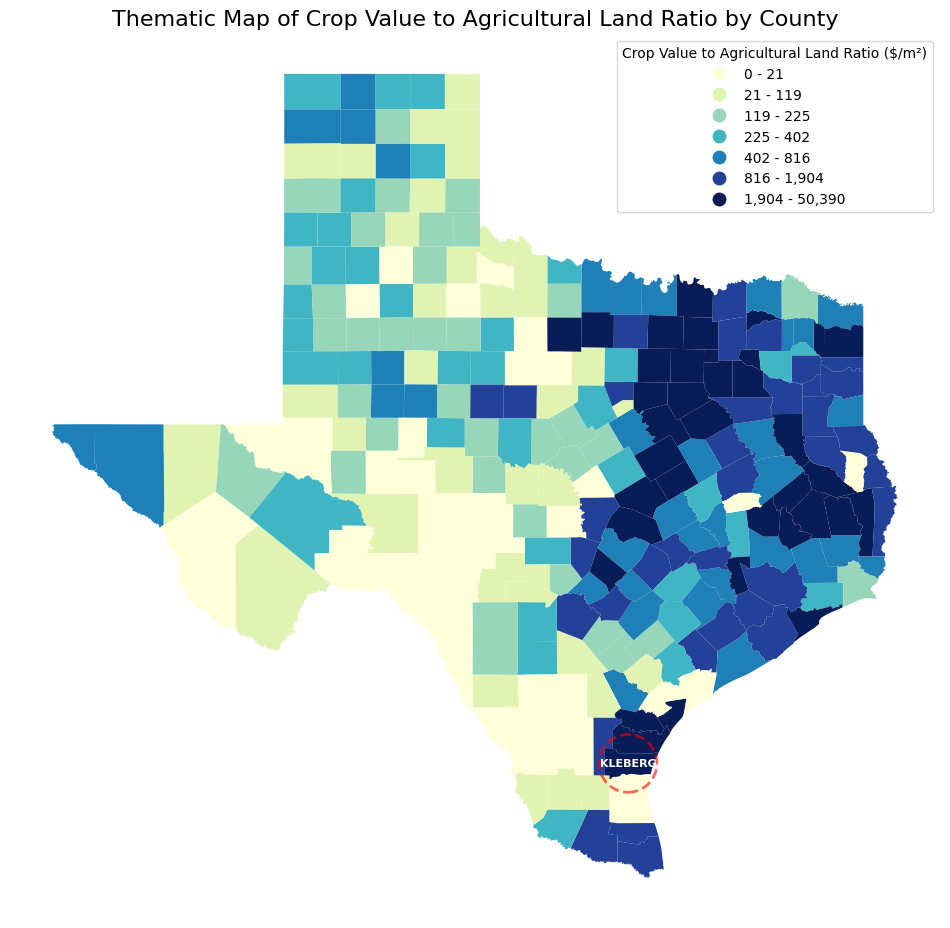

In [130]:
import mapclassify
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches # NEW IMPORT
import geopandas as gpd
import pandas as pd # NEW IMPORT

# Ensure merged_df_selected is a GeoDataFrame for plotting
merged_gdf_ratio = gpd.GeoDataFrame(merged_df_selected, geometry='geometry')

# Drop rows with NaN in 'value_ratio' before plotting
merged_gdf_ratio_plot = merged_gdf_ratio.dropna(subset=['value_ratio'])

# Define the classification scheme (e.g., Quantiles) and number of classes
k_classes = 7
classifier = mapclassify.Quantiles(merged_gdf_ratio_plot['value_ratio'], k=k_classes)

# Get the bin edges for the legend
bin_edges = classifier.bins
legend_labels = []

# Create legend labels with formatted values
for i in range(len(bin_edges)):
    if i == 0:
        legend_labels.append(f'0 - {bin_edges[i]:,.0f}')
    else:
        legend_labels.append(f'{bin_edges[i-1]:,.0f} - {bin_edges[i]:,.0f}')

# Create the figure and axes
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

# Plot the data using the defined classification
merged_gdf_ratio_plot.plot(column='value_ratio',
                           ax=ax,
                           legend=True,
                           cmap='YlGnBu', # You can change the colormap
                           scheme='Quantiles',
                           classification_kwds={'k': k_classes},
                           legend_kwds={'loc': 'upper right', 'labels': legend_labels,
                                        'title': 'Crop Value to Agricultural Land Ratio ($/m²)'})


ax.set_title('Thematic Map of Crop Value to Agricultural Land Ratio by County', fontsize=16)
ax.set_axis_off()


# 1. Find the row with the maximum 'value_ratio'
max_ratio_row = merged_gdf_ratio_plot.loc[merged_gdf_ratio_plot['value_ratio'].idxmax()]

# 2. Get the county name and geometry centroid
max_county_name = max_ratio_row['County']
centroid = max_ratio_row.geometry.centroid
x_coord = centroid.x
y_coord = centroid.y

# 3. Define the Ellipse (Adjust size as necessary)
ellipse_width = 100000
ellipse_height = 100000

ellipse = mpatches.Ellipse((x_coord, y_coord), ellipse_width, ellipse_height,
                           color='red',
                           alpha=0.6,
                           fill=False,
                           linewidth=2,
                           linestyle='--')

# 4. Add the Ellipse to the plot axes
ax.add_patch(ellipse)

# 5. Add the County Name annotation (text)
ax.annotate(max_county_name,
            xy=(x_coord, y_coord),
            xytext=(x_coord, y_coord),
            textcoords='data',
            ha='center', va='center',
            fontsize=8,
            color='White',
            fontweight='bold')

# --- NEW ANNOTATION CODE ENDS HERE ---

# Show the plot
plt.show()

In [131]:
# Run this in a separate cell to inspect the keys
import json
print(merged_gdf_ratio_plot.iloc[:1].to_json())

{"type": "FeatureCollection", "features": [{"id": "0", "type": "Feature", "properties": {"County": "ANDERSON", "Value_x": 32469.0, "Value_y": 24811000.0, "value_ratio": 764}, "geometry": {"type": "Polygon", "coordinates": [[[-10622770.069722623, 3774372.9522451796], [-10622743.352741534, 3774347.989536998], [-10622728.881744357, 3774342.7334412774], [-10622719.975722266, 3774340.105986039], [-10622677.675150776, 3774337.47801134], [-10622657.636845361, 3774336.164455883], [-10622601.977224713, 3774324.339674405], [-10622590.845419182, 3774320.398644083], [-10622568.581883123, 3774312.5152519774], [-10622549.657031287, 3774284.924292968], [-10622538.525051074, 3774241.5670732623], [-10622528.506285682, 3774203.4658907303], [-10622526.27958555, 3774125.948948655], [-10622538.525353672, 3774048.43242259], [-10622547.43028025, 3773943.3266470744], [-10622557.449477373, 3773903.912243917], [-10622587.506348142, 3773852.6738434145], [-10622632.033863612, 3773769.9033609205], [-10622706.61743

Core Reasons for the High Ratio

Favorable Environment:

1. **Water Availability:** The region receives significantly
higher annual rainfall (proximity to the Gulf of Mexico), enabling reliable, high-yield production without costly, limited irrigation common in the West.

2. **Climate & Soil:** A warmer climate allows for a longer growing season and the cultivation of high-value, frost-sensitive specialty crops (like fruits and vegetables) and potential double-cropping. The fertile soils (river valleys/coastal plains) support these demanding crops.


Economic Strategy & Crop Value:

1. **High-Value Crops:** Farmers focus on specialty crops (e.g., in the Rio Grande Valley) and high-water-demand row crops like rice, which yield a much higher market price per unit of area than the extensive commodity crops of West Texas.

2. **Market Proximity:** Proximity to major urban centers (Houston, DFW) and port infrastructure reduces transportation costs and provides direct access to large consumer markets for fresh produce, maximizing the realized crop value.

Kleberg County:

King Ranch in Texas is a historic and massive working ranch, larger than the state of Rhode Island, known for its cattle, horses, and diversified agribusiness operations. This high value is largely due to King Ranch’s diversified operations that combine large-scale cattle ranching, high-value crop production (such as cotton and sorghum), and advanced land management practices. The ranch’s focus on soil conservation, selective breeding (like the Santa Gertrudis cattle), and sustainable resource use enhances both output and efficiency.

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='value_ratio', ylabel='Count'>

<Axes: xlabel='value_ratio', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Value Ratio')

Text(0.5, 0, 'Value Ratio')

Text(0, 0.5, 'Count')

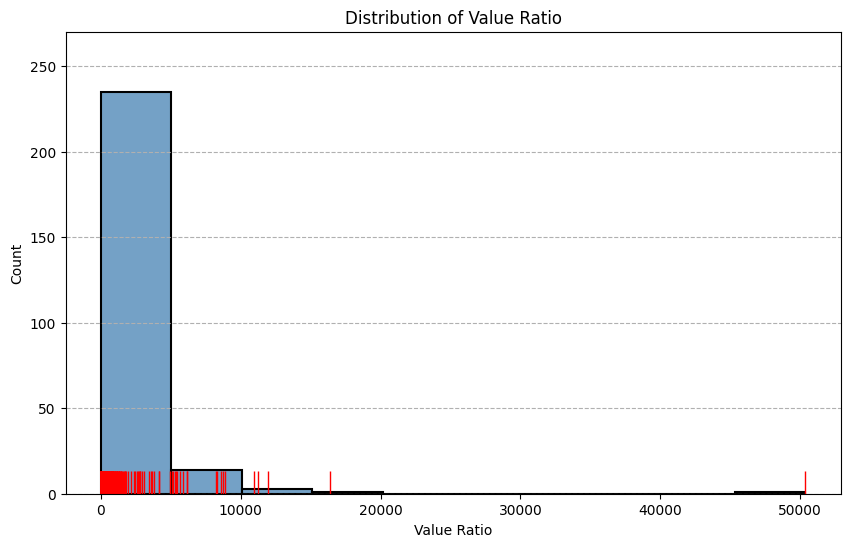

In [132]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))


sns.histplot(
    data=merged_df_selected,
    x='value_ratio',
    bins=10,  # You can adjust the number of bins
    edgecolor='black',
    color='steelblue',
    linewidth=1.5  # Adjust border thickness
)


sns.rugplot(
    data=merged_df_selected,
    x='value_ratio',
    color='red',
    height=0.05  # Adjust the height of the rug lines
)


plt.title('Distribution of Value Ratio')
plt.xlabel('Value Ratio')
plt.ylabel('Count')

plt.grid(axis='y', linestyle='--')
plt.show()

#Difference in 2022 and 2017 crop value ratio

In [133]:
url = 'https://raw.githubusercontent.com/Nemipatel210/GIS/ceb9b04b094f01fee0c9839bfdd89443b61a053c/crop_total_2017.csv'
crop_total_2017_df = pd.read_csv(url)
display(crop_total_2017_df.head(5))

,Program,Year,Period,Week Ending,Geo Level,State,State ANSI,Ag District,Ag District Code,County,...,Zip Code,Region,watershed_code,Watershed,Commodity,Data Item,Domain,Domain Category,Value,CV (%)
0,CENSUS,2017,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BELL,...,NaN,NaN,0,NaN,CROP TOTALS,"CROP TOTALS - SALES, MEASURED IN $",TOTAL,NOT SPECIFIED,"38,084,000",19.2
1,CENSUS,2017,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BOSQUE,...,NaN,NaN,0,NaN,CROP TOTALS,"CROP TOTALS - SALES, MEASURED IN $",TOTAL,NOT SPECIFIED,"6,950,000",19.2
2,CENSUS,2017,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,COLLIN,...,NaN,NaN,0,NaN,CROP TOTALS,"CROP TOTALS - SALES, MEASURED IN $",TOTAL,NOT SPECIFIED,"29,538,000",19.2
3,CENSUS,2017,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,COOKE,...,NaN,NaN,0,NaN,CROP TOTALS,"CROP TOTALS - SALES, MEASURED IN $",TOTAL,NOT SPECIFIED,"12,791,000",19.2
4,CENSUS,2017,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,CORYELL,...,NaN,NaN,0,NaN,CROP TOTALS,"CROP TOTALS - SALES, MEASURED IN $",TOTAL,NOT SPECIFIED,"8,180,000",19.2


In [134]:
crop_total_2017_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253 entries, 0 to 252
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Program           253 non-null    object 
 1   Year              253 non-null    int64  
 2   Period            253 non-null    object 
 3   Week Ending       0 non-null      float64
 4   Geo Level         253 non-null    object 
 5   State             253 non-null    object 
 6   State ANSI        253 non-null    int64  
 7   Ag District       253 non-null    object 
 8   Ag District Code  253 non-null    int64  
 9   County            253 non-null    object 
 10  County ANSI       253 non-null    int64  
 11  Zip Code          0 non-null      float64
 12  Region            0 non-null      float64
 13  watershed_code    253 non-null    int64  
 14  Watershed         0 non-null      float64
 15  Commodity         253 non-null    object 
 16  Data Item         253 non-null    object 
 1

In [135]:
tx_crop2017 = tx.merge(crop2022_df, left_on='CNTY_NM', right_on='County', how='outer',indicator=True)
tx_crop2017_plot = tx_crop2017[['CNTY_NM', 'geometry', 'Value']]

tx_crop2017_plot.head(10)

,CNTY_NM,geometry,Value
0,ANDERSON,"POLYGON ((-10622770.07 3774372.952, -10622743....","24,811,000"
1,ANDREWS,"POLYGON ((-11452352.064 3832169.96, -11452055....","5,343,000"
2,ANGELINA,"POLYGON ((-10560243.006 3701241.912, -10560220...","6,298,000"
3,ARANSAS,"POLYGON ((-10775558.316 3283921.376, -10776779...","688,000"
4,ARCHER,"POLYGON ((-10956443.534 3973368.927, -10956442...","8,344,000"
5,ARMSTRONG,"POLYGON ((-11313190.44 4139324.091, -11313143....","16,849,000"
6,ATASCOSA,"POLYGON ((-10928523.582 3341610.75, -10936457....","16,004,000"
7,AUSTIN,"POLYGON ((-10702848.867 3512350.878, -10702888...","19,506,000"
8,BAILEY,"POLYGON ((-11423114.003 4006331.061, -11423107...","39,401,000"
9,BANDERA,"POLYGON ((-11075692.444 3491572.27, -11073026....","777,000"


In [136]:
url = 'https://raw.githubusercontent.com/Nemipatel210/GIS/374c134d3da8b2821e1b62761d465fc905bacf7f/agri_land_2017.csv'
area_2017_df = pd.read_csv(url)
display(area_2017_df.head(5))

,Program,Year,Period,Week Ending,Geo Level,State,State ANSI,Ag District,Ag District Code,County,...,Zip Code,Region,watershed_code,Watershed,Commodity,Data Item,Domain,Domain Category,Value,CV (%)
0,CENSUS,2017,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BELL,...,NaN,NaN,0,NaN,AG LAND,AG LAND - ACRES,IRRIGATION STATUS,IRRIGATION STATUS: (ANY ON OPERATION),"10,983",19.0
1,CENSUS,2017,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BOSQUE,...,NaN,NaN,0,NaN,AG LAND,AG LAND - ACRES,IRRIGATION STATUS,IRRIGATION STATUS: (ANY ON OPERATION),"65,236",19.0
2,CENSUS,2017,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,COLLIN,...,NaN,NaN,0,NaN,AG LAND,AG LAND - ACRES,IRRIGATION STATUS,IRRIGATION STATUS: (ANY ON OPERATION),"4,595",19.0
3,CENSUS,2017,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,COOKE,...,NaN,NaN,0,NaN,AG LAND,AG LAND - ACRES,IRRIGATION STATUS,IRRIGATION STATUS: (ANY ON OPERATION),"14,070",19.0
4,CENSUS,2017,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,CORYELL,...,NaN,NaN,0,NaN,AG LAND,AG LAND - ACRES,IRRIGATION STATUS,IRRIGATION STATUS: (ANY ON OPERATION),"5,380",19.0


In [137]:
merged_df_2017 = area_2017_df.merge(tx_crop2017_plot, left_on='County', right_on='CNTY_NM', how='outer', indicator=True)
display(merged_df.head())

,Program,Year,Period,Week Ending,Geo Level,State,State ANSI,Ag District,Ag District Code,County,...,Commodity,Data Item,Domain,Domain Category,Value_x,CV (%),CNTY_NM,geometry,Value_y,_merge
0,CENSUS,2022.0,YEAR,NaN,COUNTY,TEXAS,48.0,EAST TEXAS NORTH,51.0,ANDERSON,...,AG LAND,AG LAND - ACRES,IRRIGATION STATUS,IRRIGATION STATUS: (ANY ON OPERATION),"32,469",22.9,ANDERSON,"POLYGON ((-10622770.07 3774372.952, -10622743....",24811000.0,both
1,CENSUS,2022.0,YEAR,NaN,COUNTY,TEXAS,48.0,SOUTHERN HIGH PLAINS,12.0,ANDREWS,...,AG LAND,AG LAND - ACRES,IRRIGATION STATUS,IRRIGATION STATUS: (ANY ON OPERATION),"156,497",22.9,ANDREWS,"POLYGON ((-11452352.064 3832169.96, -11452055....",5343000.0,both
2,CENSUS,2022.0,YEAR,NaN,COUNTY,TEXAS,48.0,EAST TEXAS SOUTH,52.0,ANGELINA,...,AG LAND,AG LAND - ACRES,IRRIGATION STATUS,IRRIGATION STATUS: (ANY ON OPERATION),"1,722",22.9,ANGELINA,"POLYGON ((-10560243.006 3701241.912, -10560220...",6298000.0,both
3,CENSUS,2022.0,YEAR,NaN,COUNTY,TEXAS,48.0,COASTAL BEND,82.0,ARANSAS,...,AG LAND,AG LAND - ACRES,IRRIGATION STATUS,IRRIGATION STATUS: (ANY ON OPERATION),63,22.9,ARANSAS,"POLYGON ((-10775558.316 3283921.376, -10776779...",688000.0,both
4,CENSUS,2022.0,YEAR,NaN,COUNTY,TEXAS,48.0,CROSS TIMBERS,30.0,ARCHER,...,AG LAND,AG LAND - ACRES,IRRIGATION STATUS,IRRIGATION STATUS: (ANY ON OPERATION),"46,951",22.9,ARCHER,"POLYGON ((-10956443.534 3973368.927, -10956442...",8344000.0,both


In [138]:
merged_df_selected_2017 = merged_df_2017[['County', 'Value_x', 'Value_y', 'geometry']]
merged_df_selected_2017.head()

,County,Value_x,Value_y,geometry
0,ANDERSON,"32,795","24,811,000","POLYGON ((-10622770.07 3774372.952, -10622743...."
1,ANDREWS,"32,830","5,343,000","POLYGON ((-11452352.064 3832169.96, -11452055...."
2,ANGELINA,"1,966","6,298,000","POLYGON ((-10560243.006 3701241.912, -10560220..."
3,ARANSAS,(D),"688,000","POLYGON ((-10775558.316 3283921.376, -10776779..."
4,ARCHER,"1,493","8,344,000","POLYGON ((-10956443.534 3973368.927, -10956442..."


In [139]:
merged_df_selected_2017.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 254 entries, 0 to 253
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   County    254 non-null    object  
 1   Value_x   254 non-null    object  
 2   Value_y   254 non-null    object  
 3   geometry  254 non-null    geometry
dtypes: geometry(1), object(3)
memory usage: 8.1+ KB


In [140]:
merged_df_selected_2017['Value_x'] = pd.to_numeric(merged_df_selected_2017['Value_x'].astype(str).str.replace(',', '', regex=False).str.replace(' (D)', '', regex=False), errors='coerce')
merged_df_selected_2017['Value_y'] = pd.to_numeric(merged_df_selected_2017['Value_y'].astype(str).str.replace(',', '', regex=False).str.replace(' (D)', '', regex=False), errors='coerce')

merged_df_selected_2017['value_ratio'] = merged_df_selected_2017['Value_y'] / merged_df_selected_2017['Value_x']
merged_df_selected_2017['value_ratio'] = merged_df_selected_2017['value_ratio'].fillna(0) # Fill NaN values with 0

display(merged_df_selected_2017.head())

/tmp/ipython-input-3896940716.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipython-input-3896940716.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipython-input-3896940716.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipython-input-389

,County,Value_x,Value_y,geometry,value_ratio
0,ANDERSON,32795.0,24811000.0,"POLYGON ((-10622770.07 3774372.952, -10622743....",756.548254
1,ANDREWS,32830.0,5343000.0,"POLYGON ((-11452352.064 3832169.96, -11452055....",162.747487
2,ANGELINA,1966.0,6298000.0,"POLYGON ((-10560243.006 3701241.912, -10560220...",3203.458800
3,ARANSAS,NaN,688000.0,"POLYGON ((-10775558.316 3283921.376, -10776779...",0.000000
4,ARCHER,1493.0,8344000.0,"POLYGON ((-10956443.534 3973368.927, -10956442...",5588.747488


In [141]:
merged_gdf_ratio_2017 = gpd.GeoDataFrame(merged_df_selected_2017, geometry='geometry')

# Drop rows with NaN in 'value_ratio' before plotting
merged_gdf_ratio_plot_2017 = merged_gdf_ratio_2017.dropna(subset=['value_ratio'])

In [142]:
merged_change = merged_gdf_ratio_plot.merge(
    merged_gdf_ratio_plot_2017[['County', 'value_ratio']],
    on='County',
    suffixes=('_2022', '_2017')
)

# Compute the difference
merged_change['value_diff'] = merged_change['value_ratio_2022'] - merged_change['value_ratio_2017']

merged_change.head(10)

,County,Value_x,Value_y,geometry,value_ratio_2022,value_ratio_2017,value_diff
0,ANDERSON,32469.0,24811000.0,"POLYGON ((-10622770.07 3774372.952, -10622743....",764,756.548254,7.451746
1,ANDREWS,156497.0,5343000.0,"POLYGON ((-11452352.064 3832169.96, -11452055....",34,162.747487,-128.747487
2,ANGELINA,1722.0,6298000.0,"POLYGON ((-10560243.006 3701241.912, -10560220...",3657,3203.458800,453.541200
3,ARANSAS,63.0,688000.0,"POLYGON ((-10775558.316 3283921.376, -10776779...",10920,0.000000,10920.000000
4,ARCHER,46951.0,8344000.0,"POLYGON ((-10956443.534 3973368.927, -10956442...",177,5588.747488,-5411.747488
5,ARMSTRONG,91408.0,16849000.0,"POLYGON ((-11313190.44 4139324.091, -11313143....",184,214.448447,-30.448447
6,ATASCOSA,251026.0,16004000.0,"POLYGON ((-10928523.582 3341610.75, -10936457....",63,110.908600,-47.908600
7,AUSTIN,24376.0,19506000.0,"POLYGON ((-10702848.867 3512350.878, -10702888...",800,683.485756,116.514244
8,BAILEY,283732.0,39401000.0,"POLYGON ((-11423114.003 4006331.061, -11423107...",138,170.152399,-32.152399
9,BANDERA,10060.0,777000.0,"POLYGON ((-11075692.444 3491572.27, -11073026....",77,33.662594,43.337406


In [143]:
merged_change['change_category'] = merged_change['value_diff'].apply(
    lambda x: 'Positive' if x > 0 else ('Negative' if x < 0 else 'Neutral')
)

In [144]:
# Make a copy with centroid geometry
merged_change_centroids = merged_change.copy()
merged_change_centroids['geometry'] = merged_change_centroids.geometry.centroid


In [145]:
print(merged_change_centroids.geometry.geom_type.value_counts())


Point    253
Name: count, dtype: int64


<Axes: >

<Axes: >

<Axes: >

<Axes: >

Text(0.5, 1.0, 'Centroid Map: Change in Crop Value/Land Ratio (2022 − 2017)')

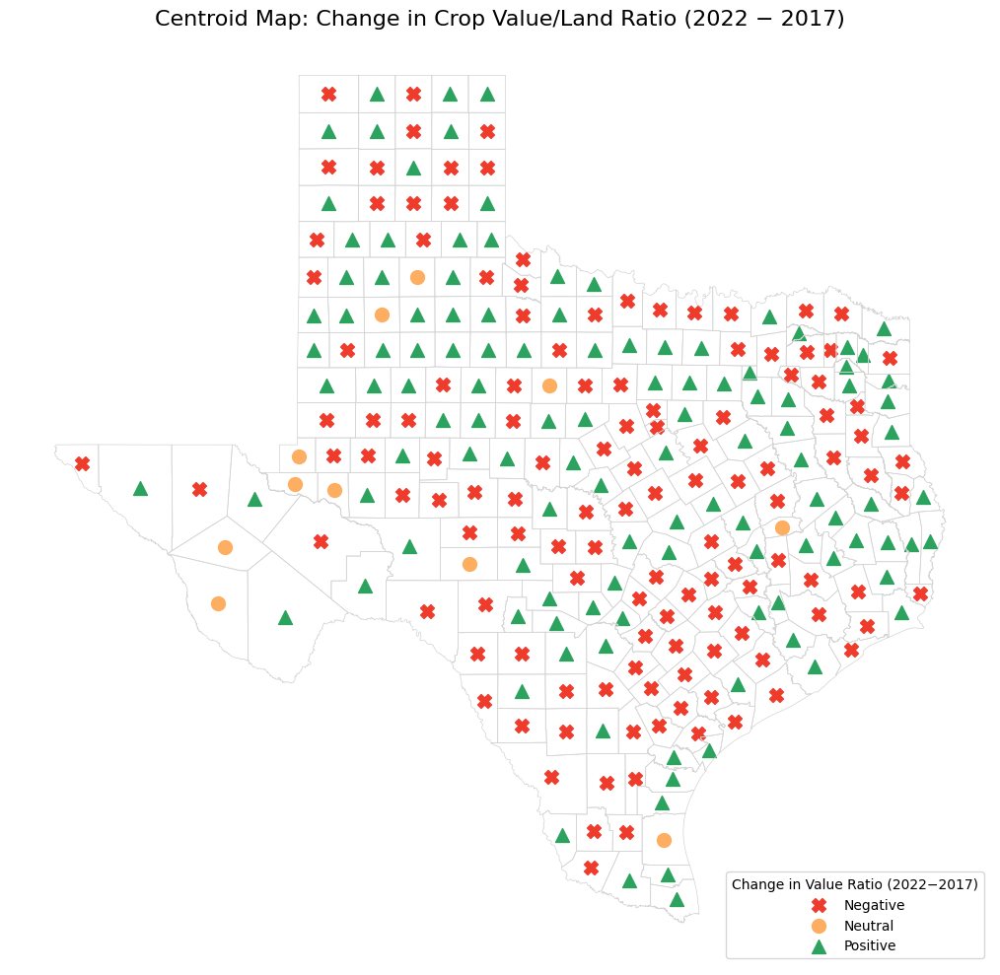

In [146]:
import matplotlib.pyplot as plt

categories = {
    # Red in original cmap: '#ef3b2c'
    'Negative': {'marker': 'X', 'color': '#ef3b2c'}, # Using 'X' as marker
    # Orange in original cmap: '#fdae61'
    'Neutral': {'marker': 'o', 'color': '#fdae61'}, # Using 'o' as marker
    # Green in original cmap: '#2ca25f'
    'Positive': {'marker': '^', 'color': '#2ca25f'}, # Using '^' as marker
}

fig, ax = plt.subplots(1, 1, figsize=(12, 10))

# Iterate and plot each category separately to use a unique marker
for category, attrs in categories.items():
    # Filter the GeoDataFrame for the current category
    subset = merged_change_centroids[merged_change_centroids['change_category'] == category]

    # Use the plot method for the subset with the custom marker
    subset.plot(
        ax=ax,
        marker=attrs['marker'],
        color=attrs['color'],     # Color is often ignored by the emoji glyph, but kept for consistency
        markersize=100,          # Adjusted size for standard markers
        label=category,           # Use 'category' for the legend entry
    )

# The original code for the boundaries
merged_change.boundary.plot(ax=ax, color='lightgray', linewidth=0.5)

ax.set_title('Centroid Map: Change in Crop Value/Land Ratio (2022 − 2017)', fontsize=16)

# Create the legend from the plotted elements
ax.legend(
    title='Change in Value Ratio (2022−2017)',
    loc='lower right',
    frameon=True,
    markerscale=1 # Restore markerscale
)

ax.set_axis_off()
plt.tight_layout()
plt.show()

Climate Variability and Drought:

Frequent droughts and irregular rainfall in North and Central Texas reduced yields and profitability, while southern and coastal regions benefited from steadier rainfall and irrigation access.

Soil and Land Suitability:

Northern and western areas have poorer, erosion-prone soils that limit productivity, whereas the Rio Grande Valley and Gulf Coast have fertile soils supporting higher-value crops.

Economic and Market Drivers:

Falling commodity prices and rising input costs lowered returns in northern regions, while southern and eastern counties diversified into high-value or irrigated crops.

Land Use Changes:

Urban expansion and land conversion have reduced agricultural land in several parts of Texas. These urbanizing areas often correspond with the counties around major metros, especially in the southeast (Houston), north-central (DFW), and parts of Central Texas (Austin and San Antonio).

# Overlay and Folium Maps

Texas Water Development Board: https://www.twdb.texas.gov/mapping/gisdata.asp

In [147]:
! wget -q -O  major_aquifers.zip https://github.com/Nemipatel210/GIS/raw/cc6822b8b6ef210cd2f80068cfac2233270ab5a6/major_aquifers.zip
zip_ref = zipfile.ZipFile('major_aquifers.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping
task1=gpd.read_file('NEW_major_aquifers_dd.shp')

In [148]:
task1.head(5)

,AREA,PERIMETER,AQUIFER,AQ_NAME,geometry
0,0.075117,3.893477,1,SEYMOUR,"POLYGON ((-100.34871 35.00166, -100.35033 34.9..."
1,0.000541,0.141894,0,SEYMOUR,"POLYGON ((-100.04694 34.78674, -100.04631 34.7..."
2,0.000555,0.129224,0,SEYMOUR,"POLYGON ((-100.15418 34.78239, -100.15341 34.7..."
3,0.000843,0.172150,0,SEYMOUR,"POLYGON ((-100.2075 34.77535, -100.20682 34.77..."
4,0.034188,2.543279,1,SEYMOUR,"POLYGON ((-100.78374 34.6883, -100.78284 34.68..."


/tmp/ipython-input-1908122772.py:23: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.



<Axes: >

Text(0.5, 1.0, 'Major Aquifers of Texas')

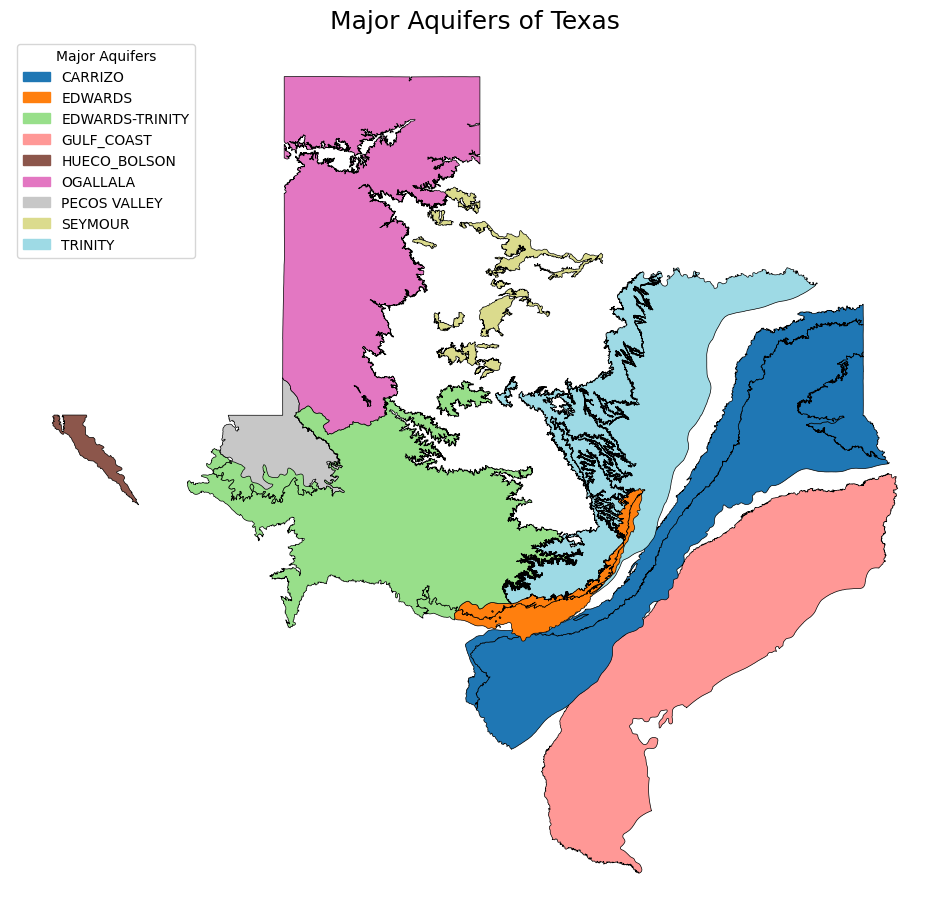

In [149]:
import matplotlib.pyplot as plt
import geopandas as gpd
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches



# Get unique aquifer names and sort them for consistent legend order
aquifer_names = sorted(task1['AQ_NAME'].unique())

cmap = plt.colormaps['tab20'].resampled(len(aquifer_names)) # Use plt.colormaps
# Access colors from the colormap object correctly
colors = [mcolors.rgb2hex(cmap.colors[i]) for i in range(len(aquifer_names))]

# Create a dictionary to map aquifer names to colors
color_map = dict(zip(aquifer_names, colors))

# --- Generate the Thematic Map ---

fig, ax = plt.subplots(1, 1, figsize=(12, 12))

# Plot the GeoDataFrame using the 'AQ_NAME' column and the custom color map
task1.plot(
    column='AQ_NAME',      # The column to use for coloring
    ax=ax,
    # legend=True, # Remove default legend creation
    categorical=True,      # Indicate that the data is categorical
    color=task1['AQ_NAME'].map(color_map), # Map aquifer names to colors
    edgecolor='black',     # Add a thin black edge to polygons
    linewidth=0.5,
    # legend_kwds are ignored when legend=False or removed
    # legend_kwds={
    #     'loc': 'upper left', # Adjust legend location as needed
    #     'title': 'Major Aquifers',
    #     'frameon': True
    # }
)

# --- Add a Custom Legend Manually ---

# Create a list of legend patches using the aquifer names and their assigned colors
patches = [mpatches.Patch(color=color_map[name], label=name) for name in aquifer_names]

# Add the legend to the axes
ax.legend(
    handles=patches,
    title='Major Aquifers',
    loc='upper left', # Adjust legend location as needed
    frameon=True,
    fontsize=10 # Adjust font size as needed
)


# Customize the map appearance
ax.set_title('Major Aquifers of Texas', fontsize=18)
ax.set_axis_off() # Hide the coordinate axes

plt.show()

##Overlay Map Of Major Aquifers

<Axes: >

<Axes: >

Text(0.5, 1.0, 'Major Aquifers of Texas with County Boundaries Overlay')

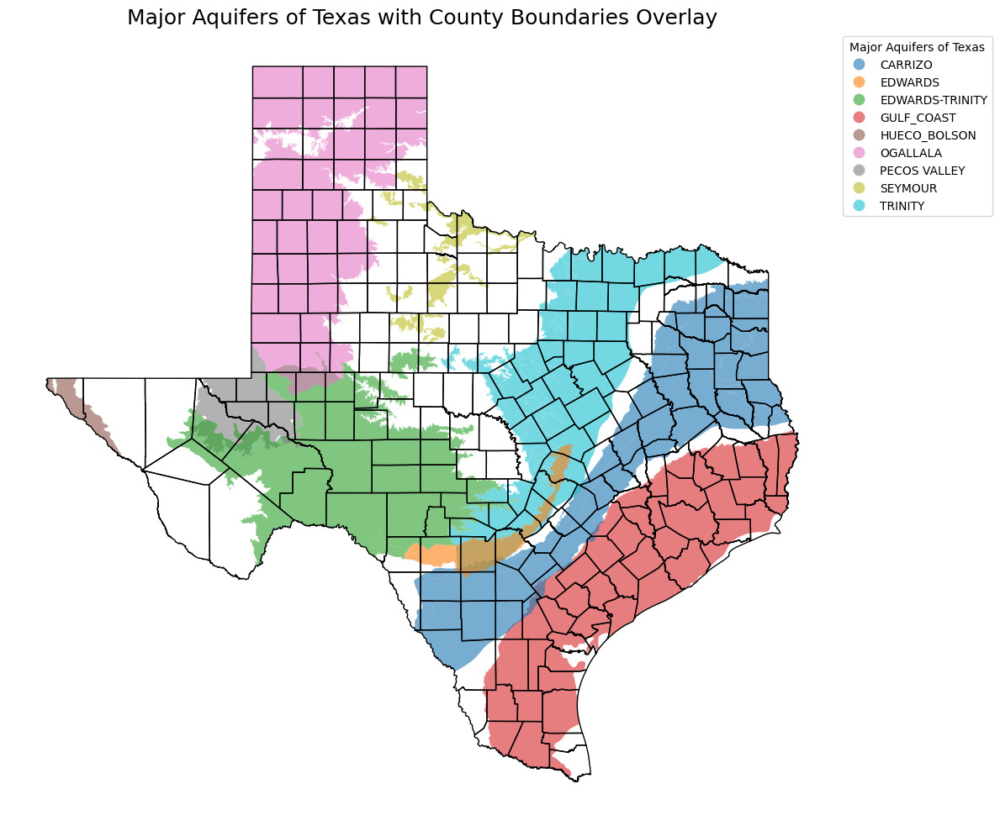

In [150]:
if txC0.crs != task1.crs:
    # Reproject the aquifer data to match the county data's CRS
    aquifer_data = task1.to_crs(txC0.crs)

# --- 3. Plotting the Overlay Map ---

# Set up the figure and axes for plotting
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

# PLOT 1: Plot the Aquifer Polygons (The colored areas)
# Use the 'AQ_NAME' column to color-code the different aquifers
aquifer_data.plot(
    column='AQ_NAME',
    ax=ax,
    legend=True,
    legend_kwds={
        'loc': 'upper left',
        'bbox_to_anchor': (1, 1), # Position the legend outside the map
        'title': "Major Aquifers of Texas"
    },
    alpha=0.6,          # Semi-transparent fill to hint at overlap
    edgecolor='none'    # No outline on the aquifer polygons
)

# PLOT 2: Plot the Texas County Boundaries (The boundary lines)
txC0.plot(
    ax=ax,
    facecolor='none',  # No fill color, so the aquifers show through
    edgecolor='black', # Color of the county boundary lines
    linewidth=1      # Line thickness
)

# Optional: Add title and clean up the plot
ax.set_title('Major Aquifers of Texas with County Boundaries Overlay', fontsize=18)
ax.set_axis_off() # Hide the coordinate axes

plt.tight_layout() # Adjust layout to make room for the legend
plt.show()

##Folium Map of Major Aquifers

In [151]:
import folium

# 1. Reproject data to EPSG:4326 for Folium
# Using 'task1' (original aquifer load)
aquifers_wgs84 = task1.to_crs(epsg=4326)

# 2. Initialize the map centered on Texas
# Calculate center from the aquifers to focus the view
center_lat = aquifers_wgs84.geometry.centroid.y.mean()
center_lon = aquifers_wgs84.geometry.centroid.x.mean()

m_overlay = folium.Map(location=[center_lat, center_lon], zoom_start=6, tiles='CartoDB positron')

# 3. Add Aquifers Layer
# We use the existing 'color_map' dictionary for consistent styling
folium.GeoJson(
    aquifers_wgs84,
    name='Major Aquifers',
    style_function=lambda feature: {
        'fillColor': color_map.get(feature['properties']['AQ_NAME'], 'gray'),
        'color': 'none', # No outline for aquifers to avoid clutter
        'weight': 0,
        'fillOpacity': 0.6
    },
    tooltip=folium.GeoJsonTooltip(fields=['AQ_NAME'], aliases=['Aquifer:'])
).add_to(m_overlay)

# 4. Add Layer Control
folium.LayerControl().add_to(m_overlay)

# Display the map
m_overlay

Output hidden; open in https://colab.research.google.com to view.

Texas Open Data Portal: https://gis-txdot.opendata.arcgis.com/datasets/TXDOT::txdot-urbanized-areas/about

In [152]:
! wget -q -O  Urbanized_Areas_2020.zip https://github.com/Nemipatel210/GIS/raw/374c134d3da8b2821e1b62761d465fc905bacf7f/Urbanized_Areas_2020.zip
zip_ref = zipfile.ZipFile('Urbanized_Areas_2020.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping
task2=gpd.read_file('TxDOT_Urbanized_Areas.shp')

<Axes: >

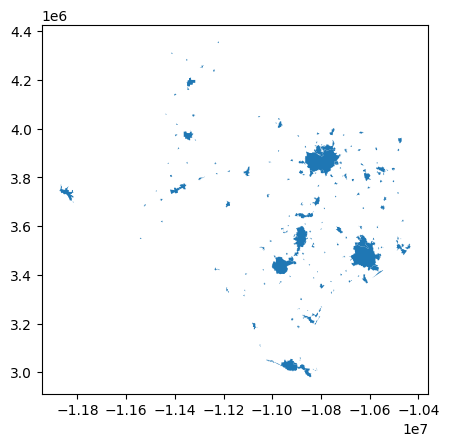

In [153]:
task2.plot()

In [154]:
task2.head(5)

,UZA_NM,UZA_NBR,FIPS_UZA_C,UZA_TYPE,POP2020,GID,UZA_TYPE_C,geometry
0,Livingston,686.0,50662,SUA,5592,70,SUA,"POLYGON ((-10569754.969 3591540.069, -10569816..."
1,Raymondville,715.0,73612,SUA,12986,73,SUA,"POLYGON ((-10886757.742 3050400.681, -10886761..."
2,Manor,817.0,54050,SUA,17006,161,SUA,"POLYGON ((-10856058.115 3552181.451, -10855500..."
3,Canyon Lake,625.0,13483,SUA,7918,11,SUA,"POLYGON ((-10942012.01 3488611.292, -10941867...."
4,Rockdale,720.0,75691,SUA,5464,75,SUA,"POLYGON ((-10795811.774 3589488.196, -10795779..."


##Overlay Map of urbanized areas

<Axes: >

<Axes: >

Text(0.5, 1.0, 'Urbanized Areas of Texas with County Boundaries Overlay')

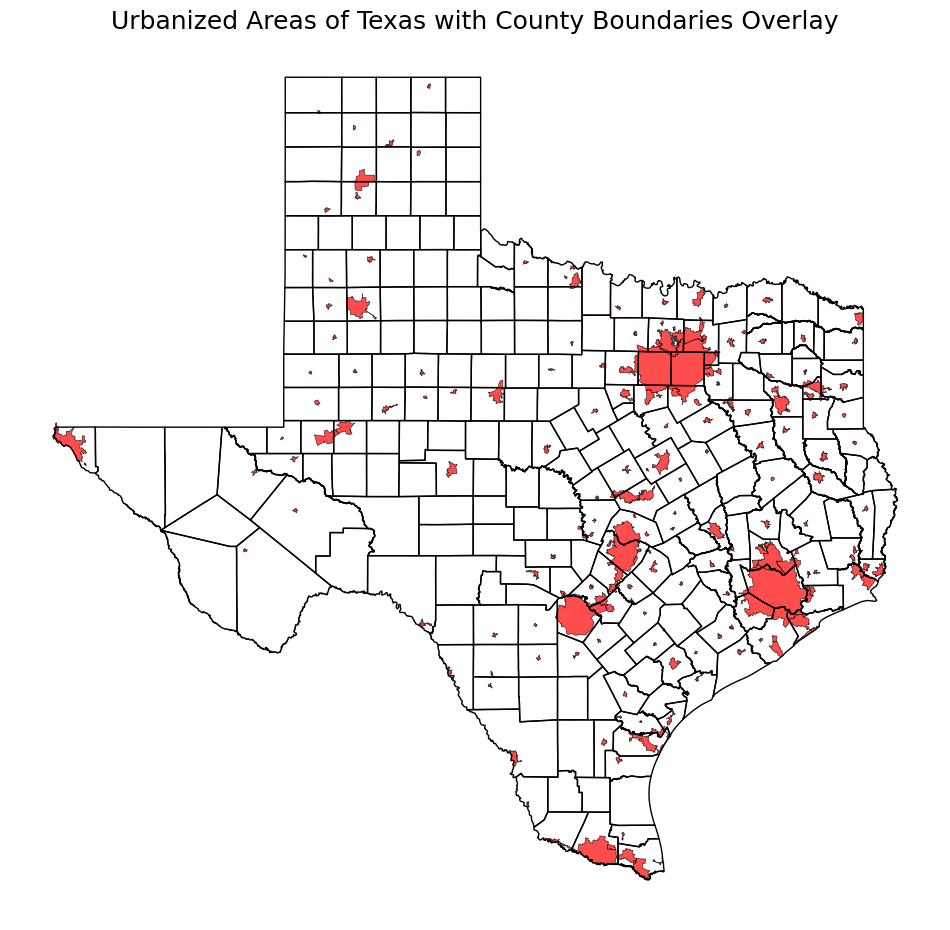

In [155]:
import matplotlib.pyplot as plt
import geopandas as gpd

# Check if the CRS of the two GeoDataFrames match
if task2.crs != txC0.crs:
    # Reproject the urbanized areas data to match the county data's CRS
    urbanized_areas_data = task2.to_crs(txC0.crs)
else:
    urbanized_areas_data = task2

# --- Plotting the Overlay Map ---

# Set up the figure and axes for plotting
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

# PLOT 1: Plot the Urbanized Areas Polygons (The colored areas)
# Use a single color for all urbanized areas or a color based on a specific attribute if desired
urbanized_areas_data.plot(
    ax=ax,
    color='red',  # Example color, you can choose another color
    alpha=0.7,    # Semi-transparent fill
    edgecolor='black', # Add a thin black edge to polygons
    linewidth=0.5,
    legend=False # No legend needed for a single color
)

# PLOT 2: Plot the Texas County Boundaries (The boundary lines)
txC0.plot(
    ax=ax,
    facecolor='none',  # No fill color, so the urbanized areas show through
    edgecolor='black', # Color of the county boundary lines
    linewidth=1      # Line thickness
)

# Optional: Add title and clean up the plot
ax.set_title('Urbanized Areas of Texas with County Boundaries Overlay', fontsize=18)
ax.set_axis_off() # Hide the coordinate axes

plt.show()

##Folium Map of Urbanized areas

In [156]:
import folium

# 1. Reproject data to EPSG:4326 for Folium
# Using 'task2' which contains the Urbanized Areas
urbanized_wgs84 = task2.to_crs(epsg=4326)

# --- New Step: Create a formatted population column ---
def format_pop(population):
    if population >= 1_000_000:
        return f'{population/1_000_000:.2f} Million'
    elif population >= 1_000:
        return f'{population/1_000:.1f} Thousand'
    else:
        return f'{population:,}'

# Apply the formatting function
urbanized_wgs84['Pop_Label'] = urbanized_wgs84['POP2020'].apply(format_pop)
# ------------------------------------------------------

# 2. Initialize the map centered on Texas
# Calculate center from the urbanized areas
center_lat = urbanized_wgs84.geometry.centroid.y.mean()
center_lon = urbanized_wgs84.geometry.centroid.x.mean()

m_urban = folium.Map(location=[center_lat, center_lon], zoom_start=6, tiles='CartoDB positron')

# 3. Add Urbanized Areas Layer
folium.GeoJson(
    urbanized_wgs84,
    name='Urbanized Areas',
    style_function=lambda feature: {
        'fillColor': 'red',
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0.6
    },
    # Use the new 'Pop_Label' column in the tooltip
    tooltip=folium.GeoJsonTooltip(fields=['UZA_NM', 'Pop_Label'], aliases=['Name:', 'Population (2020):'])
).add_to(m_urban)

# 4. Add Layer Control
folium.LayerControl().add_to(m_urban)

# Display the map
m_urban

Output hidden; open in https://colab.research.google.com to view.

##Urbanized area 2010

In [210]:
! wget -q -O  Urbanized_Areas_2010.zip https://raw.githubusercontent.com/Nemipatel210/GIS/97e93b154b15799251044cb19a9c4749311c87d0/Urbanized_Areas_2010.zip
zip_ref = zipfile.ZipFile('Urbanized_Areas_2010.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping

In [211]:
!ls

County_Boundaries.cpg
County_Boundaries.dbf
County_Boundaries.prj
County_Boundaries.shp
County_Boundaries.shp.xml
County_Boundaries.shx
geo_export_5daba26a-1a9f-44f5-af78-b6c2b8a01b32.cpg
geo_export_5daba26a-1a9f-44f5-af78-b6c2b8a01b32.dbf
geo_export_5daba26a-1a9f-44f5-af78-b6c2b8a01b32.prj
geo_export_5daba26a-1a9f-44f5-af78-b6c2b8a01b32.shp
geo_export_5daba26a-1a9f-44f5-af78-b6c2b8a01b32.shx
major_aquifers.zip
NEW_major_aquifers_dd.dbf
NEW_major_aquifers_dd.prj
NEW_major_aquifers_dd.sbn
NEW_major_aquifers_dd.sbx
NEW_major_aquifers_dd.shp
NEW_major_aquifers_dd.shp.xml
NEW_major_aquifers_dd.shx
NEW_major_aquifers.lyr
readme.pdf
sample_data
TexasCountiesCartographic.zip
Texas_County_Boundaries_4845315375211121464.zip
TWDB_Groundwater.cpg
TWDB_Groundwater.dbf
TWDB_Groundwater.prj
TWDB_Groundwater.shp
TWDB_Groundwater.shx
TWDBGroundwater.zip
TxDOT_Urbanized_Areas.cpg
TxDOT_Urbanized_Areas.dbf
TxDOT_Urbanized_Areas.prj
TxDOT_Urbanized_Areas.shp
TxDOT_Urbanized_Areas.shp.xml
TxDOT_Urbanized_

In [212]:
urb_2010=gpd.read_file('Urbanized_Area.shp')

In [213]:
urb_2010.head(5)

,UZA_NM,UZA_NBR,FIPS_UZA_C,POP2010,UZA_TYPE_C,GID,geometry
0,Livingston,686.0,50662,5139,SUA,70,"POLYGON ((-10569754.969 3591540.069, -10569816..."
1,Raymondville,715.0,73612,14481,SUA,73,"POLYGON ((-10885009.689 3054401.277, -10885063..."
2,Manor,817.0,54050,5320,SUA,161,"POLYGON ((-10859337.461 3550185.743, -10858683..."
3,Canyon Lake,625.0,13483,5277,SUA,11,"POLYGON ((-10941024.547 3488538.578, -10941036..."
4,Sullivan City,829.0,85492,5694,SUA,162,"POLYGON ((-10970896.746 3033006.153, -10970900..."


<Axes: >

<Axes: >

Text(0.5, 1.0, 'Urbanized Areas of Texas with County Boundaries Overlay 2010')

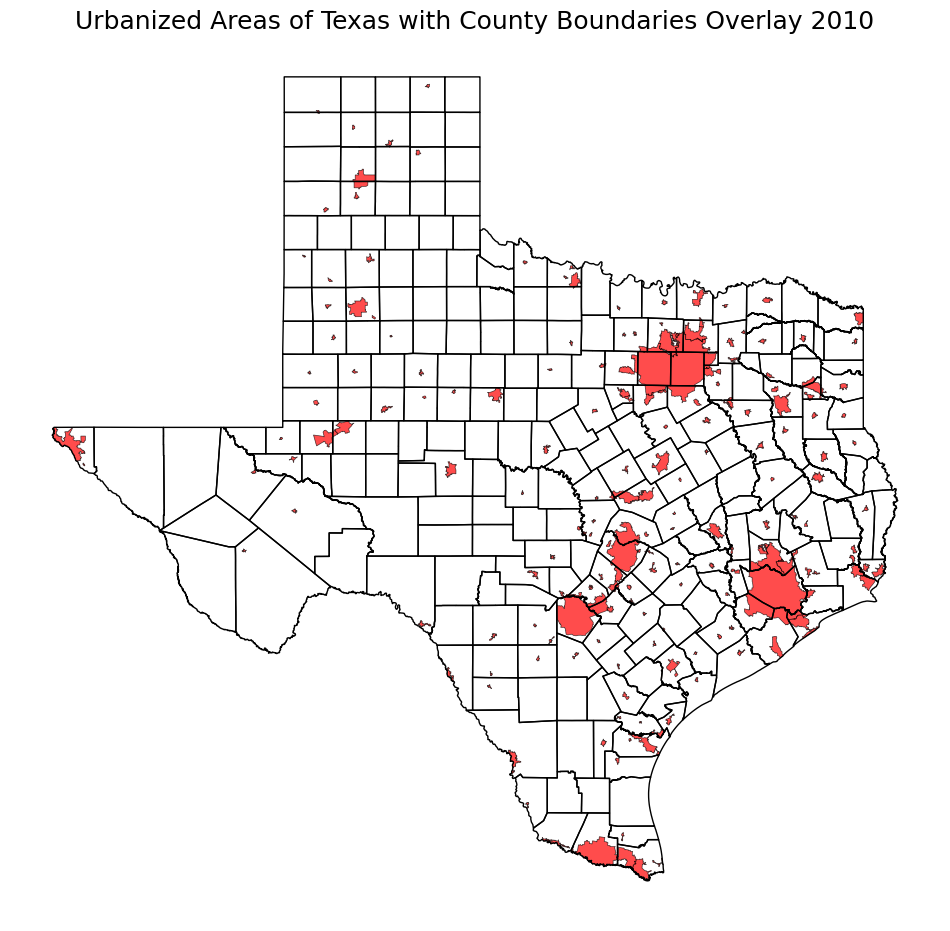

In [214]:
import matplotlib.pyplot as plt
import geopandas as gpd

# Check if the CRS of the two GeoDataFrames match
if urb_2010.crs != txC0.crs:
    # Reproject the urbanized areas data to match the county data's CRS
    urbanized_areas_data_2010 = urb_2010.to_crs(txC0.crs)
else:
    urbanized_areas_data_2010 = urb_2010

# --- Plotting the Overlay Map ---

# Set up the figure and axes for plotting
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

# PLOT 1: Plot the Urbanized Areas Polygons (The colored areas)
# Use a single color for all urbanized areas or a color based on a specific attribute if desired
urbanized_areas_data_2010.plot(
    ax=ax,
    color='red',  # Example color, you can choose another color
    alpha=0.7,    # Semi-transparent fill
    edgecolor='black', # Add a thin black edge to polygons
    linewidth=0.5,
    legend=False # No legend needed for a single color
)

# PLOT 2: Plot the Texas County Boundaries (The boundary lines)
txC0.plot(
    ax=ax,
    facecolor='none',  # No fill color, so the urbanized areas show through
    edgecolor='black', # Color of the county boundary lines
    linewidth=1      # Line thickness
)

# Optional: Add title and clean up the plot
ax.set_title('Urbanized Areas of Texas with County Boundaries Overlay 2010', fontsize=18)
ax.set_axis_off() # Hide the coordinate axes

plt.show()

In [216]:
import folium

# 1. Reproject data to EPSG:4326 for Folium
# Using 'task2' which contains the Urbanized Areas
urbanized_wgs84_2010 = urb_2010.to_crs(epsg=4326)

# --- New Step: Create a formatted population column ---
def format_pop(population):
    if population >= 1_000_000:
        return f'{population/1_000_000:.2f} Million'
    elif population >= 1_000:
        return f'{population/1_000:.1f} Thousand'
    else:
        return f'{population:,}'

# Apply the formatting function
urbanized_wgs84_2010['Pop_Label'] = urbanized_wgs84_2010['POP2010'].apply(format_pop)
# ------------------------------------------------------

# 2. Initialize the map centered on Texas
# Calculate center from the urbanized areas
center_lat = urbanized_wgs84_2010.geometry.centroid.y.mean()
center_lon = urbanized_wgs84_2010.geometry.centroid.x.mean()

m_urban_2010 = folium.Map(location=[center_lat, center_lon], zoom_start=6, tiles='CartoDB positron')

# 3. Add Urbanized Areas Layer
folium.GeoJson(
    urbanized_wgs84_2010,
    name='Urbanized Areas 2010',
    style_function=lambda feature: {
        'fillColor': 'red',
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0.6
    },
    # Use the new 'Pop_Label' column in the tooltip
    tooltip=folium.GeoJsonTooltip(fields=['UZA_NM', 'Pop_Label'], aliases=['Name:', 'Population (2010):'])
).add_to(m_urban_2010)

# 4. Add Layer Control
folium.LayerControl().add_to(m_urban_2010)

# Display the map
m_urban_2010

Output hidden; open in https://colab.research.google.com to view.

##Map To Present (comparing 2020 and 2010)

In [221]:
import folium
from folium.plugins import DualMap
from branca.element import Element

# --- 1. DATA PREPARATION ---
# (Assuming 'urbanized_2020' and 'urbanized_2010' are already loaded/projected from your previous steps)
urbanized_2020 = task2.to_crs(epsg=4326)

urbanized_2010 = urb_2010.to_crs(epsg=4326)


# Formatting function
def format_pop(population):
    if population >= 1_000_000:
        return f'{population/1_000_000:.2f} Million'
    elif population >= 1_000:
        return f'{population/1_000:.1f} Thousand'
    else:
        return f'{population:,}'

# Apply formatting
urbanized_2020['Pop_Label'] = urbanized_2020['POP2020'].apply(format_pop)
urbanized_2010['Pop_Label'] = urbanized_2010['POP2010'].apply(format_pop)

# --- 2. SETUP DUAL MAP ---

center_lat = urbanized_2020.geometry.centroid.y.mean()
center_lon = urbanized_2020.geometry.centroid.x.mean()

m = DualMap(location=[center_lat, center_lon], zoom_start=6, tiles='CartoDB positron')

# --- 3. ADD LAYERS ---

# LEFT MAP (2020)
folium.GeoJson(
    urbanized_2020,
    name='Urbanized Areas 2020',
    style_function=lambda feature: {
        'fillColor': 'red',
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0.6
    },
    tooltip=folium.GeoJsonTooltip(fields=['UZA_NM', 'Pop_Label'], aliases=['Name:', 'Pop 2020:'])
).add_to(m.m1)

# RIGHT MAP (2010)
folium.GeoJson(
    urbanized_2010,
    name='Urbanized Areas 2010',
    style_function=lambda feature: {
        'fillColor': 'blue',
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0.6
    },
    tooltip=folium.GeoJsonTooltip(fields=['UZA_NM', 'Pop_Label'], aliases=['Name:', 'Pop 2010:'])
).add_to(m.m2)

folium.LayerControl(collapsed=False).add_to(m.m1)
folium.LayerControl(collapsed=False).add_to(m.m2)

custom_css = """
<style>
    /* Target the internal map divs */
    .folium-map {
        border: 4px solid #333;       /* Thick dark grey border */
        border-radius: 8px;           /* Rounded corners */
        box-shadow: 5px 5px 15px rgba(0,0,0,0.3); /* Drop shadow for "card" look */
        box-sizing: border-box;       /* Crucial: Ensures border doesn't break the 50% width */
        margin-bottom: 10px;          /* distinct bottom edge */
    }
</style>
"""

# Attach the CSS to the map root
m.get_root().html.add_child(Element(custom_css))

# Display
m

Output hidden; open in https://colab.research.google.com to view.

#Comparison of Crop Value Ratio, Major Aquifers, and Urbanized Areas

<Axes: >

Text(0.5, 1.0, 'Thematic Map of Crop Value to Agricultural Land Ratio by County')

<Axes: >

<Axes: >

Text(0.5, 1.0, 'Major Aquifers of Texas with County Boundaries Overlay')

<Axes: >

<Axes: >

Text(0.5, 1.0, 'Urbanized Areas of Texas with County Boundaries Overlay')

Text(0.5, 0.95, 'Comparison of Crop Value Ratio, Major Aquifers, and Urbanized Areas')

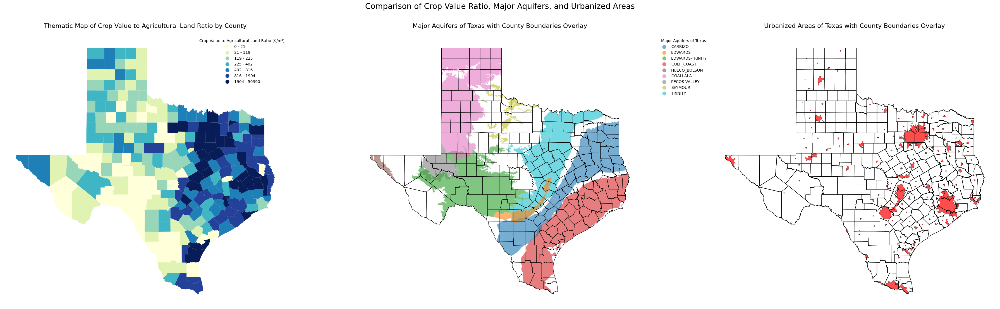

In [157]:
import mapclassify
import matplotlib.pyplot as plt
import geopandas as gpd


merged_gdf_ratio = gpd.GeoDataFrame(merged_df_selected, geometry='geometry')

merged_gdf_ratio_plot = merged_gdf_ratio.dropna(subset=['value_ratio'])

k_classes = 7
classifier = mapclassify.Quantiles(merged_gdf_ratio_plot['value_ratio'], k=k_classes)

bin_edges = classifier.bins
legend_labels = []

for i in range(len(bin_edges)):
    if i == 0:
        legend_labels.append(f'0 - {bin_edges[i]:.0f}')
    else:
        legend_labels.append(f'{bin_edges[i-1]:.0f} - {bin_edges[i]:.0f}')

if txC0.crs != task1.crs:
    aquifer_data = task1.to_crs(txC0.crs)
else:
    aquifer_data = task1


if txC0.crs != task2.crs:
    urbanized_areas_data = task2.to_crs(txC0.crs)
else:
    urbanized_areas_data = task2

fig, axs = plt.subplots(1, 3, figsize=(36, 12)) # 1 row, 3 columns

ax0 = axs[0] # The first axes object (left)

# Plot the data using the defined classification
merged_gdf_ratio_plot.plot(column='value_ratio',
                           ax=ax0,
                           legend=True,
                           cmap='YlGnBu',
                           scheme='Quantiles',
                           classification_kwds={'k': k_classes},
                           legend_kwds={'loc': 'upper right',
                                        'labels': legend_labels,
                                        'title': 'Crop Value to Agricultural Land Ratio ($/m²)',
                                        'frameon': False}) # Added frameon=False for cleaner look


ax0.set_title('Thematic Map of Crop Value to Agricultural Land Ratio by County',
              fontsize=16,
              pad=20)
ax0.set_axis_off()

ax1 = axs[1] # The second axes object (middle)

# PLOT 1 (of 2): Plot the Aquifer Polygons (The colored areas)
aquifer_data.plot(
    column='AQ_NAME',
    ax=ax1,
    legend=True,
    legend_kwds={
        'loc': 'upper left',
        'bbox_to_anchor': (1.05, 1),
        'title': "Major Aquifers of Texas",
        'frameon': False
    },
    alpha=0.6,
    edgecolor='none'
)


txC0.plot(
    ax=ax1,
    facecolor='none',
    edgecolor='black',
    linewidth=0.8
)


ax1.set_title('Major Aquifers of Texas with County Boundaries Overlay',
              fontsize=16,
              pad=20)
ax1.set_axis_off()



ax2 = axs[2]


urbanized_areas_data.plot(
    ax=ax2,
    color='red',
    alpha=0.7,
    edgecolor='black',
    linewidth=0.5,
    legend=False
)


txC0.plot(
    ax=ax2,
    facecolor='none',
    edgecolor='black',
    linewidth=1
)


ax2.set_title('Urbanized Areas of Texas with County Boundaries Overlay', fontsize=16, pad=20)
ax2.set_axis_off()


plt.suptitle('Comparison of Crop Value Ratio, Major Aquifers, and Urbanized Areas', fontsize=20, y=0.95)
plt.tight_layout(rect=[0, 0.03, 1, 0.9]) # Adjust layout to make room for the suptitle and legend
plt.show()

**Water and Climate Define Value Zones:**

1.The East and Southeast regions exhibit a High Crop Value Ratio, thanks to a favorable climate, higher rainfall, and the presence of abundant groundwater from the Gulf Coast and Carrizo-Wilcox Aquifers. This natural resource endowment supports intensive, high-value agriculture like horticulture, specialty crops, and timber, yielding a higher profit per acre.

2.The West and Panhandle regions, characterized by a semi-arid climate, display a Low Crop Value Ratio. Agriculture here is primarily extensive, commodity-based farming (e.g., cotton, grains, ranching) that relies heavily on irrigation from the Ogallala Aquifer.

**Urbanization Drives Highest Value:**

There is a clear link between urban growth and agricultural income efficiency:

1.Market Proximity: The highest Crop Value Ratios (darkest blue) are concentrated adjacent to major urban centers (e.g., the Texas Triangle: Dallas, Houston, San Antonio).

2.Economic Rationale: Urban areas provide immediate, large markets, reducing transportation costs and increasing demand for high-value, perishable goods (produce, nursery products).

3.Land Pressure: High land prices near cities force farmers to maximize income per unit of land, resulting in highly intensive, high-income operations.

**Resource Conflict and Sustainability:**

The overlap of key resources indicates future challenges:

Resource Competition: Major aquifers like the Edwards and Carrizo-Wilcox underlie both high-value agricultural land and densely urbanized areas. This overlap signifies a growing conflict over shared groundwater between municipal and agricultural users.

Land Loss: The most economically productive (High Value Ratio) farmland is simultaneously the most vulnerable to conversion to housing and commercial use due to urban sprawl, threatening the sustainability of local food production.

#Aggregation Of Expenses data

USDA: https://www.nass.usda.gov/Statistics_by_State/Texas/index.php

In [158]:
url = 'https://raw.githubusercontent.com/Nemipatel210/GIS/0d976d215d5fe847a9052e7949668e06b9c7e661/expenses_2022.csv'
expenses_2022_df = pd.read_csv(url)
display(expenses_2022_df.head(5))

,Program,Year,Period,Week Ending,Geo Level,State,State ANSI,Ag District,Ag District Code,County,...,Zip Code,Region,watershed_code,Watershed,Commodity,Data Item,Domain,Domain Category,Value,CV (%)
0,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BELL,...,NaN,NaN,0,NaN,AG SERVICES,"AG SERVICES, CUSTOM SERVICES FOR LIVESTOCK, IN...",TOTAL,NOT SPECIFIED,"1,992,000",(L)
1,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BELL,...,NaN,NaN,0,NaN,AG SERVICES,"AG SERVICES, CUSTOM SERVICES FOR LIVESTOCK, IN...",TOTAL,NOT SPECIFIED,941,5.7
2,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BELL,...,NaN,NaN,0,NaN,AG SERVICES,"AG SERVICES, CUSTOMWORK - EXPENSE, MEASURED IN $",TOTAL,NOT SPECIFIED,"2,421,000",(L)
3,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BELL,...,NaN,NaN,0,NaN,AG SERVICES,"AG SERVICES, CUSTOMWORK - OPERATIONS WITH EXPENSE",TOTAL,NOT SPECIFIED,355,10.8
4,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BELL,...,NaN,NaN,0,NaN,AG SERVICES,"AG SERVICES, MACHINERY RENTAL - EXPENSE, MEASU...",TOTAL,NOT SPECIFIED,"1,020,000",(L)


In [159]:
# Ensure the 'Value' column is numeric
expenses_2022_df['Value'] = pd.to_numeric(expenses_2022_df['Value'].astype(str).str.replace(',', '', regex=False).str.replace(' (D)', '', regex=False).str.replace(' (Z)', '', regex=False), errors='coerce')

# Group by 'County' and sum the 'Value' column
county_expenses = expenses_2022_df.groupby('County')['Value'].sum().reset_index()

# Rename the 'Value' column to 'total_expense'
county_expenses = county_expenses.rename(columns={'Value': 'total_expense'})

display(county_expenses.head())

,County,total_expense
0,ANDERSON,374629402.0
1,ANDREWS,30535207.0
2,ANGELINA,114856630.0
3,ARANSAS,7065233.0
4,ARCHER,189653424.0


In [160]:
county_expenses.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 254 entries, 0 to 253
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   County         254 non-null    object 
 1   total_expense  254 non-null    float64
dtypes: float64(1), object(1)
memory usage: 4.1+ KB


In [161]:
# Merge county_expenses with tx_crop2022_plot on county name
county_expenses_gdf = tx_crop2022_plot.merge(county_expenses, left_on='CNTY_NM', right_on='County', how='outer')

# Select only the desired columns and rename CNTY_NM to County
county_expenses_gdf = county_expenses_gdf[['CNTY_NM', 'total_expense', 'geometry']].rename(columns={'CNTY_NM': 'County'})

display(county_expenses_gdf.head())

,County,total_expense,geometry
0,ANDERSON,374629402.0,"POLYGON ((-10622770.07 3774372.952, -10622743...."
1,ANDREWS,30535207.0,"POLYGON ((-11452352.064 3832169.96, -11452055...."
2,ANGELINA,114856630.0,"POLYGON ((-10560243.006 3701241.912, -10560220..."
3,ARANSAS,7065233.0,"POLYGON ((-10775558.316 3283921.376, -10776779..."
4,ARCHER,189653424.0,"POLYGON ((-10956443.534 3973368.927, -10956442..."


<Axes: >

Text(0.5, 1.0, 'Thematic Map of Total Agricultural Expense by County (2022)')

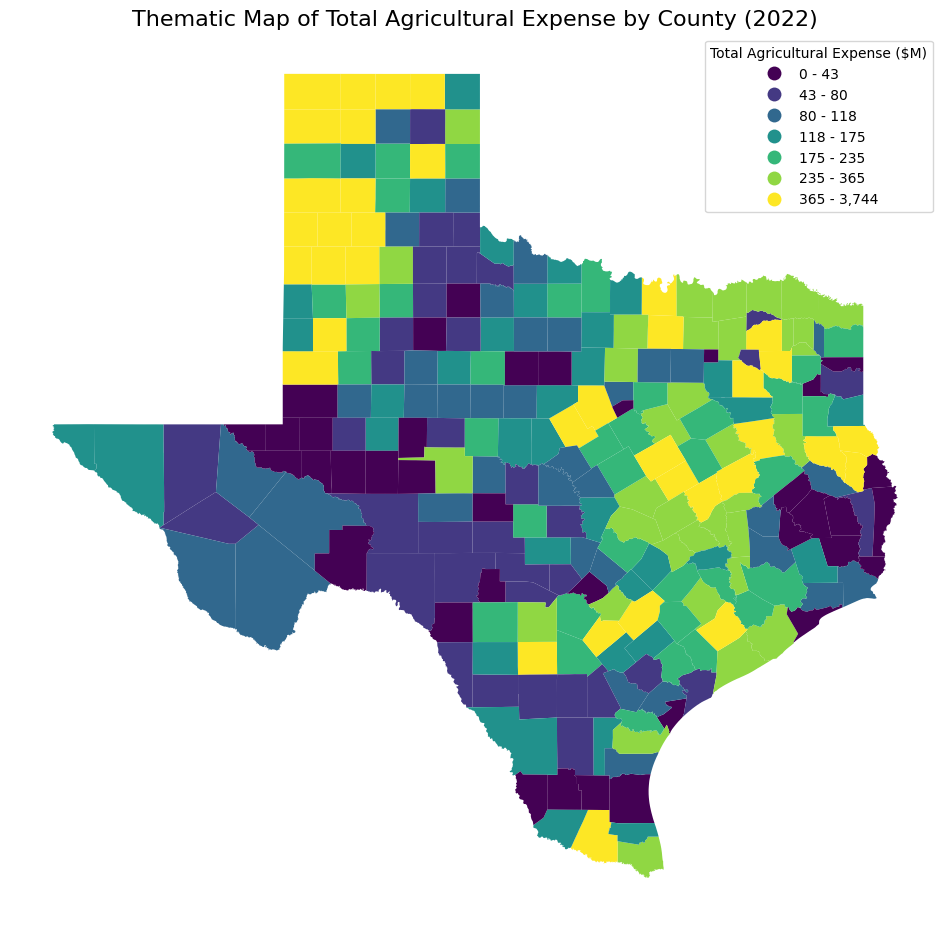

In [162]:
import mapclassify
import matplotlib.pyplot as plt
import geopandas as gpd

# Ensure county_expenses_gdf is a GeoDataFrame (it should be after the merge with tx_crop2022_plot)
# If it's not already, you might need to explicitly create it:
# county_expenses_gdf = gpd.GeoDataFrame(county_expenses_gdf, geometry='geometry')


# Drop rows with NaN in 'total_expense' before plotting
county_expenses_gdf_plot = county_expenses_gdf.dropna(subset=['total_expense']).set_geometry('geometry')

# Define the classification scheme (e.g., Quantiles) and number of classes
k_classes = 7 # You can adjust the number of classes
classifier = mapclassify.Quantiles(county_expenses_gdf_plot['total_expense'], k=k_classes)

# Get the bin edges for the legend
bin_edges = classifier.bins
legend_labels = []

# Create legend labels with formatted values, showing in millions and as integers
for i in range(len(bin_edges)):
    if i == 0:
        # Assuming the minimum is close to 0 or setting it to 0 for a cleaner look
        legend_labels.append(f'0 - {bin_edges[i]/1000000:,.0f}') # Divide by 1e6 and format to 0 decimal places
    else:
        legend_labels.append(f'{bin_edges[i-1]/1000000:,.0f} - {bin_edges[i]/1000000:,.0f}') # Divide by 1e6 and format to 0 decimal places


# Create the figure and axes
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

# Plot the data using the defined classification
county_expenses_gdf_plot.plot(column='total_expense',
                           ax=ax,
                           legend=True,
                           cmap='viridis', # You can change the colormap
                           scheme='Quantiles',
                           classification_kwds={'k': k_classes},
                           legend_kwds={'loc': 'upper right', 'labels': legend_labels,
                                        'title': 'Total Agricultural Expense ($M)'}) # Update title for millions


ax.set_title('Thematic Map of Total Agricultural Expense by County (2022)', fontsize=16)
ax.set_axis_off()
plt.show()

<Axes: >

<Axes: >

Text(0.5, 1.0, 'Centroid Map of Total Agricultural Expense by County (2022)')

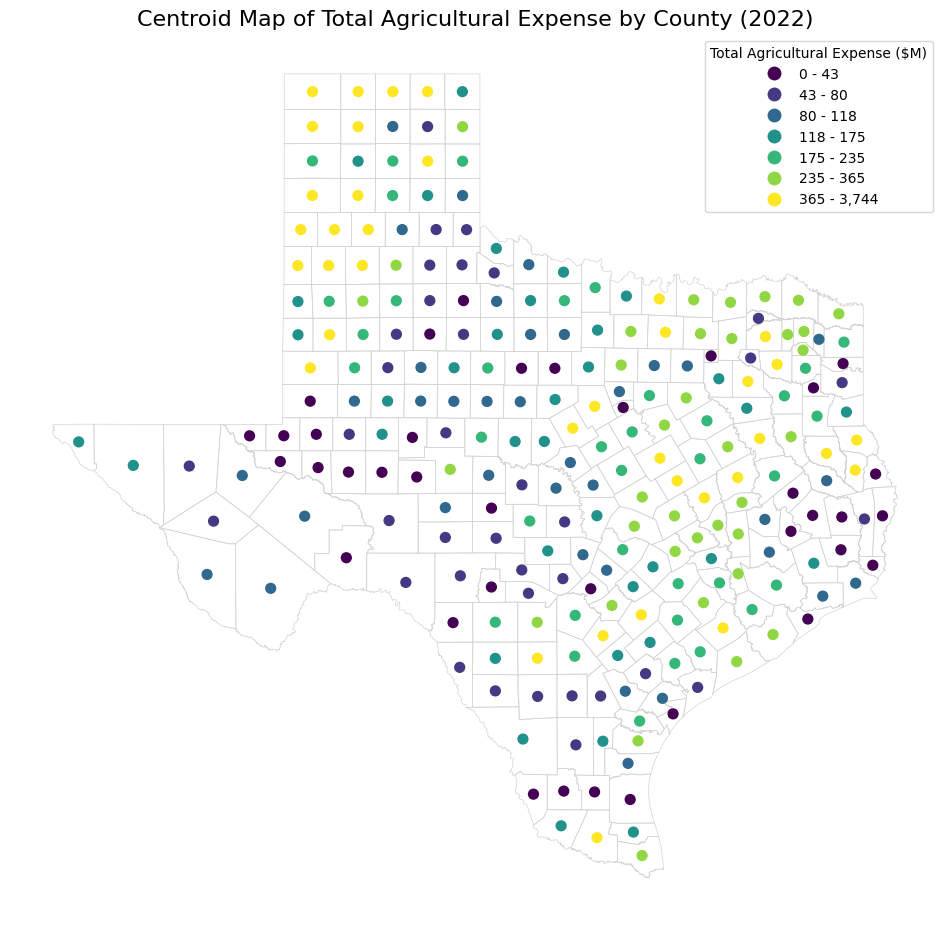

In [163]:
import matplotlib.pyplot as plt
import geopandas as gpd
import mapclassify

# Ensure county_expenses_gdf is a GeoDataFrame and has the 'geometry' column
# (It should be from the previous merge)

# Drop rows with NaN in 'total_expense' before plotting
county_expenses_gdf_plot = county_expenses_gdf.dropna(subset=['total_expense']).set_geometry('geometry')


# Calculate the centroids of the county polygons
county_expenses_gdf_plot['centroid_geometry'] = county_expenses_gdf_plot.geometry.centroid

# Create a new GeoDataFrame with the centroid geometries
county_expenses_centroids = county_expenses_gdf_plot.set_geometry('centroid_geometry')

# Define the classification scheme (e.g., Quantiles) and number of classes for coloring
k_classes = 7 # Use the same number of classes as the thematic map for consistency
classifier = mapclassify.Quantiles(county_expenses_centroids['total_expense'], k=k_classes)

# Get the bin edges for the legend (using the same binning as the thematic map)
bin_edges = classifier.bins
legend_labels = []

# Create legend labels with formatted values, showing in millions and as integers
for i in range(len(bin_edges)):
    if i == 0:
        legend_labels.append(f'0 - {bin_edges[i]/1000000:,.0f}')
    else:
        legend_labels.append(f'{bin_edges[i-1]/1000000:,.0f} - {bin_edges[i]/1000000:,.0f}')


# Create the figure and axes
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

# Plot the county boundaries in the background
county_expenses_gdf_plot.plot(ax=ax, facecolor='none', edgecolor='lightgray', linewidth=0.5)

# Plot the centroids, colored by total expense
county_expenses_centroids.plot(column='total_expense',
                               ax=ax,
                               legend=True,
                               cmap='viridis', # Use the same colormap as the thematic map
                               scheme='Quantiles',
                               classification_kwds={'k': k_classes},
                               legend_kwds={'loc': 'upper right', 'labels': legend_labels,
                                            'title': 'Total Agricultural Expense ($M)'},
                               markersize=50) # Adjust the size of the centroid markers


ax.set_title('Centroid Map of Total Agricultural Expense by County (2022)', fontsize=16)
ax.set_axis_off()
plt.show()

#Crop Value Ratio & Agricultural Expense by County (2022)

Text(0.5, 1.0, 'Texas: Crop Value Ratio & Agricultural Expense by County (2022)')

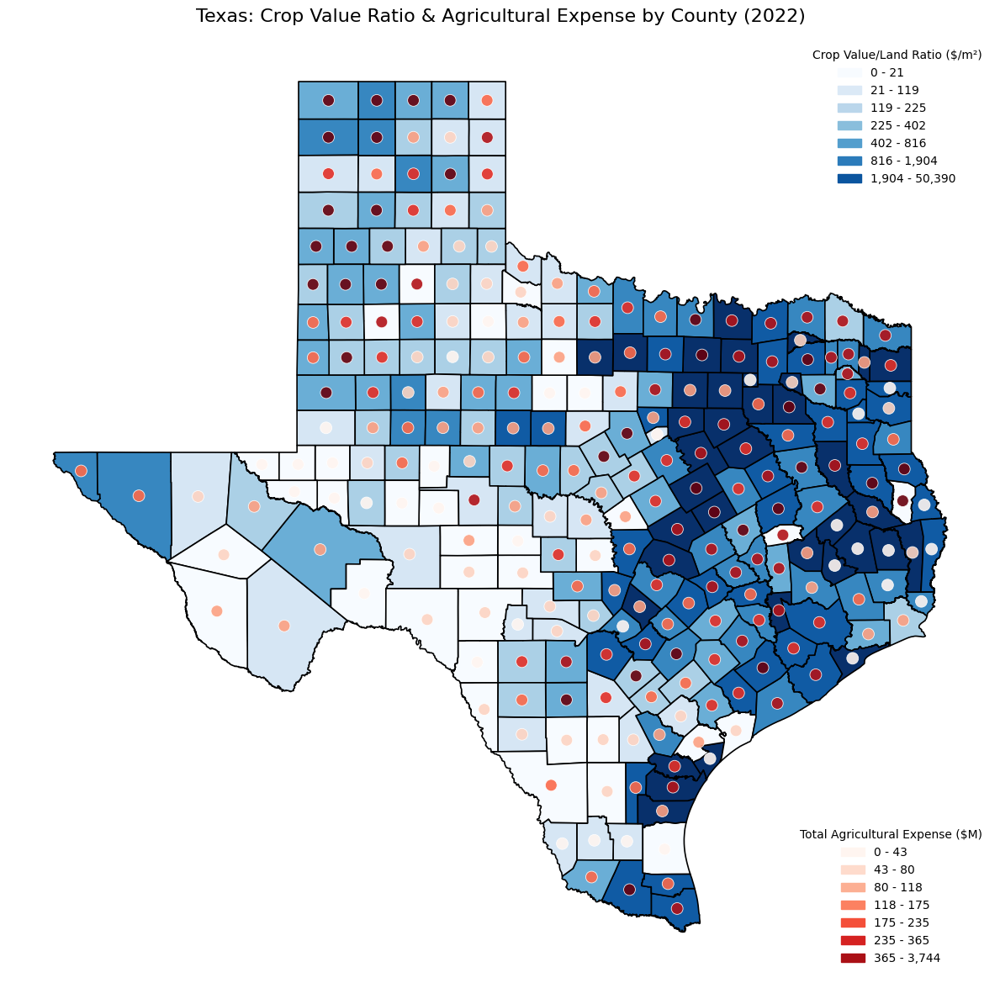

In [164]:
import matplotlib.pyplot as plt
import geopandas as gpd
import mapclassify
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

fig, ax = plt.subplots(1, 1, figsize=(12, 12))

# --- Plot 1: Thematic Map (Crop Value Ratio) ---
merged_gdf_ratio_plot = merged_gdf_ratio_plot.set_geometry('geometry')
k_classes = 7
classifier_ratio = mapclassify.Quantiles(merged_gdf_ratio_plot['value_ratio'], k=k_classes)
bin_edges_ratio = classifier_ratio.bins
legend_labels_ratio = [f'{0 if i==0 else bin_edges_ratio[i-1]:,.0f} - {bin_edges_ratio[i]:,.0f}' for i in range(len(bin_edges_ratio))]

ratio_plot = merged_gdf_ratio_plot.plot(
    column='value_ratio',
    ax=ax,
    cmap='Blues',
    scheme='Quantiles',
    edgecolor='Black',
    classification_kwds={'k': k_classes},
    linewidth=1.2,
    legend=False  # turn off GeoPandas legend
)

# --- Plot 2: Centroid Map (Total Agricultural Expense) ---
county_expenses_centroids = county_expenses_centroids.set_geometry('centroid_geometry')
classifier_expense = mapclassify.Quantiles(county_expenses_centroids['total_expense'], k=k_classes)
bin_edges_expense = classifier_expense.bins
legend_labels_expense = [f'{0 if i==0 else bin_edges_expense[i-1]/1e6:,.0f} - {bin_edges_expense[i]/1e6:,.0f}' for i in range(len(bin_edges_expense))]

expense_plot = county_expenses_centroids.plot(
    column='total_expense',
    ax=ax,
    cmap='Reds',
    scheme='Quantiles',
    classification_kwds={'k': k_classes},
    markersize=100,
    edgecolor='White',
    linewidth=0.6,
    alpha=0.9,
    legend=False  # turn off GeoPandas legend
)

# --- Create two custom legends manually ---
# Legend 1: Crop Value/Land Ratio (Greens)
green_patches = [Patch(color=plt.cm.Blues(i / k_classes), label=label) for i, label in enumerate(legend_labels_ratio)]
legend1 = ax.legend(handles=green_patches, title='Crop Value/Land Ratio ($/m²)', loc='upper right', frameon=False)

# Add the first legend to the axis
ax.add_artist(legend1)

# Legend 2: Total Agricultural Expense (Reds)
red_patches = [Patch(color=plt.cm.Reds(i / k_classes), label=label) for i, label in enumerate(legend_labels_expense)]
legend2 = ax.legend(handles=red_patches, title='Total Agricultural Expense ($M)', loc='lower right', frameon=False)

ax.set_title('Texas: Crop Value Ratio & Agricultural Expense by County (2022)', fontsize=16, pad=15)
ax.set_axis_off()

plt.tight_layout()
plt.show()


expenses:

High-expense zone:

1.Texas Panhandle/High Plains: Represents massive investment in vertically integrated operations like beef feedlots, dairy CAFOs, and irrigated crops (cotton/corn). This concentration is tied to unsustainable groundwater mining from the Ogallala Aquifer, posing a critical long-term risk.

2.Central Blackland Prairie: A key area for commercial row crops.

3.South Texas: Focused on intensive, irrigated agriculture.

Low-Expense Zones:

1.East Texas: Despite favorable rainfall, expenses are low because the economy is land-extensive, focused on the high-value timber industry and smaller-scale ranching, not capital-intensive crops.

2.West/Southwest Texas: Low expenses often reflect climatic marginalization, where aridity limits investment viability.

#Tree Map for Type of Expenses

In [165]:
expenses_2022_df['Value'] = expenses_2022_df['Value'].astype(str)

    # 2. Remove commas
expenses_2022_df['Value'] = expenses_2022_df['Value'].str.replace(',', '', regex=False)

    # 3. Convert to numeric. 'errors=coerce' turns non-numeric strings into NaN
expenses_2022_df['Value'] = pd.to_numeric(expenses_2022_df['Value'], errors='coerce')


In [166]:
original_rows = len(expenses_2022_df)
df_cleaned = expenses_2022_df.dropna(subset=['Value'])
cleaned_rows = len(df_cleaned)

In [167]:
commodity_summary = df_cleaned.groupby('Commodity')['Value'].sum().reset_index()

In [168]:
commodity_summary = commodity_summary.sort_values(by='Value', ascending=False)

In [169]:
import plotly.express as px
import pandas as pd

# 1. Complete Data with all 13 Commodities Grouped
data = {
    'Category': [
        # Livestock Group
        'Livestock & Feed', 'Livestock & Feed',

        # Labor & Operations Group
        'Labor & Operations', 'Labor & Operations', 'Labor & Operations', 'Labor & Operations',

        # Financial & Fixed Costs Group
        'Financial & Fixed', 'Financial & Fixed', 'Financial & Fixed', 'Financial & Fixed',

        # Crop Inputs Group (The new 4 items go mostly here + Supplies in Ops)
        'Crop Inputs', 'Crop Inputs', 'Crop Inputs'
    ],
    'Commodity': [
        'ANIMAL TOTALS', 'FEED',

        'LABOR', 'AG SERVICES', 'FUELS', 'SUPPLIES & REPAIRS',

        'DEPRECIATION', 'INTEREST', 'TAXES', 'RENT',

        'FERTILIZER TOTALS', 'CHEMICAL TOTALS', 'SEEDS & PLANTS TOTALS'
    ],
    'Value': [
        # Livestock Values
        12130000000, 7970000000,

        # Labor & Ops Values
        4180000000, 2730000000, 1170000000, 1610000000,

        # Financial Values
        2540000000, 1670000000, 796000000, 749690000,

        # Crop Input Values
        1330000000, 862040000, 864030000
    ]
}

df_filtered = pd.DataFrame(data)

# 2. Define formatting function
def format_currency(value):
    if value >= 1_000_000_000:
        return f'${value / 1_000_000_000:.2f}B'
    if value >= 1_000_000:
        return f'${value / 1_000_000:.2f}M'
    if value >= 1_000:
        return f'${value / 1_000:.2f}K'
    else:
        return f'${value:,.0f}'

df_filtered['Value_Formatted'] = df_filtered['Value'].apply(format_currency)

# 3. Create the Treemap
fig = px.treemap(
    df_filtered,
    path=[px.Constant("All Commodities"), 'Category', 'Commodity'],
    values='Value',
    title='Total Expenses by Category and Commodity',
    color='Category', # Changed color to Category to make groups distinct visually
    color_discrete_sequence=px.colors.qualitative.Prism, # Using a distinct color palette
    custom_data=['Value_Formatted']
)

# 4. Update Traces
fig.update_traces(
    texttemplate="<b>%{label}</b><br>%{customdata[0]}<br>%{percentParent:.2%}",
    hovertemplate='<b>%{label}</b><br>Value: %{customdata[0]}<br>Group Share: %{percentParent:.2%}<br>Total Share: %{percentRoot:.2%}'
)

# Increase layout size slightly for readability
fig.update_layout(
    margin=dict(t=50, l=25, r=25, b=25)
)

fig.show()

##Map To present

In [170]:
import plotly.express as px
import pandas as pd

# 1. Complete Data with all 13 Commodities Grouped
data = {
    'Category': [
        # Livestock Group
        'Livestock & Feed', 'Livestock & Feed',

        # Labor & Operations Group
        'Labor & Operations', 'Labor & Operations', 'Labor & Operations', 'Labor & Operations',

        # Financial & Fixed Costs Group
        'Financial & Fixed', 'Financial & Fixed', 'Financial & Fixed', 'Financial & Fixed',

        # Crop Inputs Group
        'Crop Inputs', 'Crop Inputs', 'Crop Inputs'
    ],
    'Commodity': [
        'ANIMAL TOTALS', 'FEED',
        'LABOR', 'AG SERVICES', 'FUELS', 'SUPPLIES & REPAIRS',
        'DEPRECIATION', 'INTEREST', 'TAXES', 'RENT',
        'FERTILIZER TOTALS', 'CHEMICAL TOTALS', 'SEEDS & PLANTS TOTALS'
    ],
    'Value': [
        # Livestock Values
        12130000000, 7970000000,
        # Labor & Ops Values
        4180000000, 2730000000, 1170000000, 1610000000,
        # Financial Values
        2540000000, 1670000000, 796000000, 749690000,
        # Crop Input Values
        1330000000, 862040000, 864030000
    ]
}

df_filtered = pd.DataFrame(data)

# 2. Create the Treemap
# We use color='Value' to get the continuous color bar on the right
fig = px.treemap(
    df_filtered,
    path=[px.Constant("All Commodities"), 'Category', 'Commodity'],
    values='Value',
    title='Total Expenses by Category and Commodity',
    color='Value', # <--- CHANGED: Uses numerical value for the color scale
    color_continuous_scale='viridis',
)

# 3. Update Traces
# We use %{value:$.2s} to automatically format the number for ALL boxes (including subgroups).
# $.2s means: "Format as currency, 2 significant digits, use SI prefix (k, M, G)".
# G = Giga (Billion).
fig.update_traces(
    texttemplate="<b>%{label}</b><br>%{value:$.3s}<br>%{percentParent:.2%}",
    hovertemplate='<b>%{label}</b><br>Value: %{value:$.3s}<br>Group Share: %{percentParent:.2%}<br>Total Share: %{percentRoot:.2%}'
)

# Increase layout size slightly for readability
fig.update_layout(
    margin=dict(t=50, l=25, r=25, b=25)
)

fig.show()

Texas agricultural producers spent $38.8 billion in total farm production expenses during 2022, reflecting a 29.9% increase from 2017. Also It tells the story of an industry under significant financial pressure.

Livestock and feed costs dominating at 51.8% of total expenses reflect the state's cattle-ranching heritage and current production priorities.

However, the sharp increases in input costs—particularly fertilizer (50%), fuel (35%), and feed (18.5%)—squeezed profit margins despite strong commodity prices.

#Scatter Plot for Crop-value ratio and expense

In [171]:
# Drop the duplicate geometry column from merged_df_selected
merged_df_selected = merged_df_selected.drop(columns=['geometry'])

# Merge the two GeoDataFrames on the 'County' column
merged_expenses_value = county_expenses_gdf.merge(merged_df_selected, on='County', how='inner')

# Display the first 5 rows of the merged dataframe
display(merged_expenses_value.head())

,County,total_expense,geometry,Value_x,Value_y,value_ratio
0,ANDERSON,374629402.0,"POLYGON ((-10622770.07 3774372.952, -10622743....",32469.0,24811000.0,764
1,ANDREWS,30535207.0,"POLYGON ((-11452352.064 3832169.96, -11452055....",156497.0,5343000.0,34
2,ANGELINA,114856630.0,"POLYGON ((-10560243.006 3701241.912, -10560220...",1722.0,6298000.0,3657
3,ARANSAS,7065233.0,"POLYGON ((-10775558.316 3283921.376, -10776779...",63.0,688000.0,10920
4,ARCHER,189653424.0,"POLYGON ((-10956443.534 3973368.927, -10956442...",46951.0,8344000.0,177


<Figure size 1000x800 with 0 Axes>

Text(204948684.25925925, 2097274421.7305338, 'Hi-Hi')

Text(5399334.259259257, 41935003.18053359, 'Lo-Lo')

Text(5399334.259259257, 2097274421.7305338, 'Lo-Hi')

Text(204948684.25925925, 41935003.18053359, 'Hi-Lo')

Text(96353000.0, 3036227534.0, 'CASTRO')

Text(188835000.0, 2020138388.0, 'DALLAM')

Text(102740000.0, 3744045994.0, 'DEAF SMITH')

Text(37026000.0, 1670201861.0, 'GONZALES')

Text(278013000.0, 2758839987.0, 'HARTLEY')

Text(362855000.0, 814965883.0, 'HIDALGO')

Text(128399000.0, 2478123403.0, 'PARMER')

Text(190706000.0, 1820463183.0, 'SHERMAN')

Text(354833000.0, 716400922.0, 'WHARTON')

Text(0.5, 1.0, 'Crop Value Ratio vs. Total Agricultural Expense by County')

Text(0.5, 0, 'Crop Value/Land Ratio ($/m²)')

Text(0, 0.5, 'Total Agricultural Expense ($)')

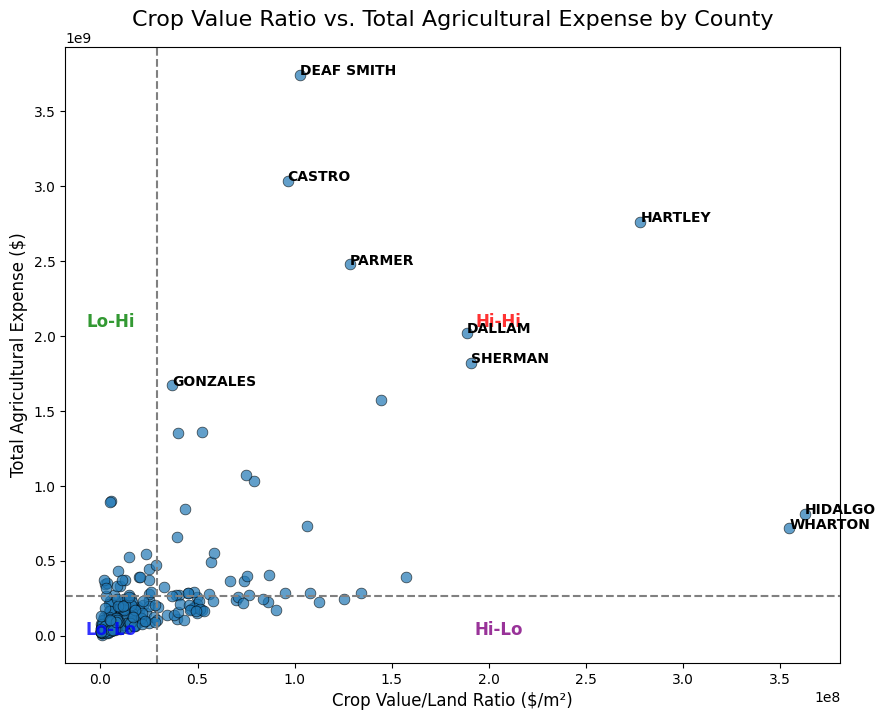

In [172]:
import seaborn as sns
import matplotlib.pyplot as plt

# --- 1. Define Variables and Quadrant Lines ---
# Use the DataFrame and column names you provided
# Assumes 'merged_expenses_value' is an existing DataFrame
df_to_plot = merged_expenses_value
x_var = 'Value_y'
y_var = 'total_expense'

# Calculate the mean to divide the quadrants
x_mean = df_to_plot[x_var].mean()
y_mean = df_to_plot[y_var].mean()

# --- 2. Create the Scatter Plot ---
plt.figure(figsize=(10, 8))
ax = sns.scatterplot(
    data=df_to_plot,  # Use your merged DataFrame
    x=x_var,        # Use 'Value_y'
    y=y_var,        # Use 'total_expense'
    alpha=0.7,
    s=60,           # s = marker size
    edgecolor='black',
    linewidth=0.5
)

# --- 3. Add Quadrant Lines (Lo-Lo, Hi-Hi) ---
ax.axvline(x=x_mean, color='grey', linestyle='--', linewidth=1.5,
            label=f'Mean Ratio ({x_mean:.2f})')
ax.axhline(y=y_mean, color='grey', linestyle='--', linewidth=1.5,
            label=f'Mean Expense (${y_mean:,.0f})')

# --- 4. Add Quadrant Labels ---
xmin, xmax = ax.get_xlim()
ymin, ymax = ax.get_ylim()

# Hi-Hi
ax.text(x_mean + (xmax - x_mean) * 0.5, y_mean + (ymax - y_mean) * 0.5,
        'Hi-Hi',
        ha='center', va='center', fontsize=12, color='red', alpha=0.8, weight='bold')
# Lo-Lo
ax.text(x_mean - (x_mean - xmin) * 0.5, y_mean - (y_mean - ymin) * 0.5,
        'Lo-Lo',
        ha='center', va='center', fontsize=12, color='blue', alpha=0.8, weight='bold')
# Lo-Hi
ax.text(x_mean - (x_mean - xmin) * 0.5, y_mean + (ymax - y_mean) * 0.5,
        'Lo-Hi',
        ha='center', va='center', fontsize=12, color='green', alpha=0.8, weight='bold')
# Hi-Lo
ax.text(x_mean + (xmax - x_mean) * 0.5, y_mean - (y_mean - ymin) * 0.5,
        'Hi-Lo',
        ha='center', va='center', fontsize=12, color='purple', alpha=0.8, weight='bold')


# --- 4b. Identify and Label Outliers ---

# 1. Define a threshold (2 is standard, 3 is for very extreme outliers)
std_dev_threshold = 3

# 2. Calculate Standard Deviations
x_std = df_to_plot[x_var].std()
y_std = df_to_plot[y_var].std()

# 3. Create a mask for outliers
# This checks if a point is > 2 std devs away from mean on EITHER axis
outliers = df_to_plot[
    (df_to_plot[x_var] > x_mean + (std_dev_threshold * x_std)) |
    (df_to_plot[y_var] > y_mean + (std_dev_threshold * y_std))
]

# 4. Loop through the outliers and label them
# IMPORTANT: Replace 'County' with the actual name of your county column (e.g., 'NAMELSAD', 'CountyName')
name_column = 'County'

for line in range(0, outliers.shape[0]):
    # Get the data for the current outlier
    row = outliers.iloc[line]

    # Place text slightly offset from the dot
    ax.text(
        row[x_var],
        row[y_var],
        row[name_column],
        horizontalalignment='left',
        size='medium',
        color='black',
        weight='semibold'
    )

# --- 5. Final Touches (using your map's titles) ---
# Use the titles from your original map for consistency
ax.set_title('Crop Value Ratio vs. Total Agricultural Expense by County', fontsize=16, pad=15)
ax.set_xlabel('Crop Value/Land Ratio ($/m²)', fontsize=12)
ax.set_ylabel('Total Agricultural Expense ($)', fontsize=12)

##Log Based Scatter Plot

<Figure size 1000x800 with 0 Axes>

Text(0.5, 1.0, 'Log-Scale: Crop Value Ratio vs. Total Agricultural Expense')

Text(0.5, 0, 'Log of Crop Value')

Text(0, 0.5, 'Log of Total Agricultural Expense')

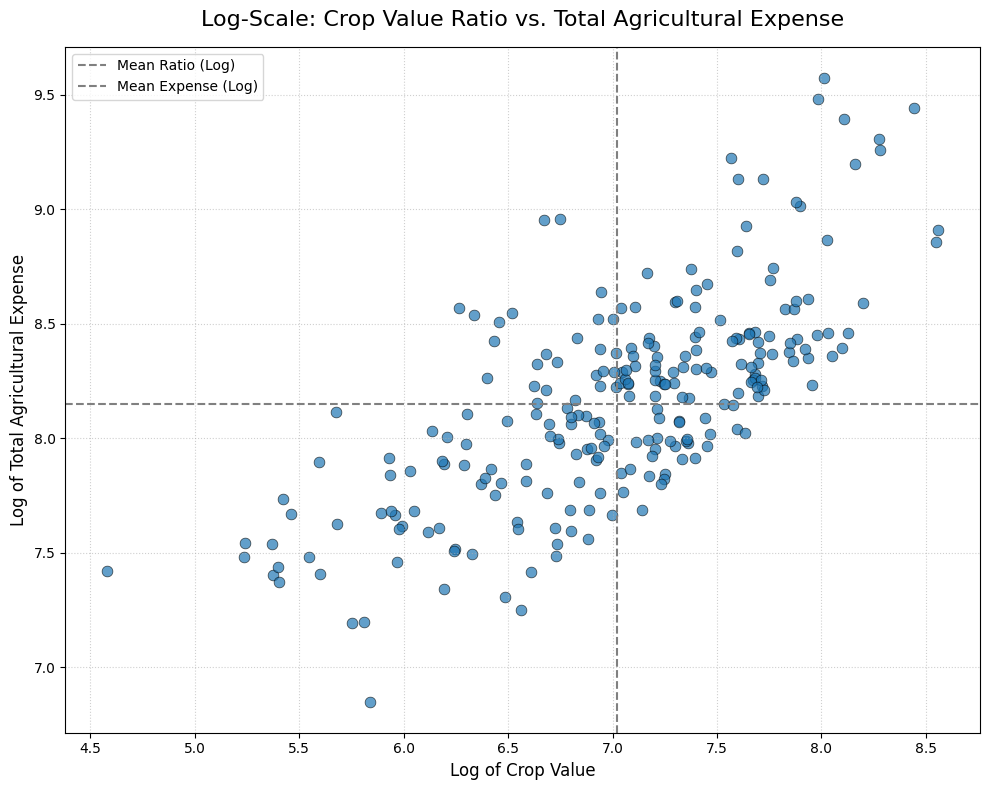

In [173]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# --- 1. Use the same DataFrame ---
df_to_plot = merged_expenses_value
x_var = 'Value_y'
y_var = 'total_expense'

# --- 2. Create the Scatter Plot ---
plt.figure(figsize=(10, 8))
# We create a log-transformed copy of the columns for plotting
# Adding 1 to avoid log(0) errors if you have zero values
df_to_plot['log_' + y_var] = np.log10(df_to_plot[y_var] + 1)
df_to_plot['log_' + x_var] = np.log10(df_to_plot[x_var] + 1)

ax = sns.scatterplot(
    data=df_to_plot,
    x='log_' + x_var,
    y='log_' + y_var,
    alpha=0.7,
    s=60,
    edgecolor='black',
    linewidth=0.5
)

# --- 3. Add Quadrant Lines (on the log-transformed means) ---
log_x_mean = df_to_plot['log_' + x_var].mean()
log_y_mean = df_to_plot['log_' + y_var].mean()

ax.axvline(x=log_x_mean, color='grey', linestyle='--', linewidth=1.5, label='Mean Ratio (Log)')
ax.axhline(y=log_y_mean, color='grey', linestyle='--', linewidth=1.5, label='Mean Expense (Log)')

# --- 4. Final Touches ---
ax.set_title('Log-Scale: Crop Value Ratio vs. Total Agricultural Expense', fontsize=16, pad=15)
ax.set_xlabel('Log of Crop Value', fontsize=12)
ax.set_ylabel('Log of Total Agricultural Expense', fontsize=12)

plt.grid(True, linestyle=':', alpha=0.6)
plt.legend(loc='best')
plt.tight_layout()
plt.show()

###Map to present

<Figure size 1200x1000 with 0 Axes>

Text(7.890485780393444, 8.928641420607953, 'Hi-Hi')

Text(5.701519832106079, 7.4303233767951635, 'Lo-Lo')

Text(5.701519832106079, 8.928641420607953, 'Lo-Hi')

Text(7.890485780393444, 7.4303233767951635, 'Hi-Lo')

Text(8.559733113063798, 8.911139428739165, 'HIDALGO')

Text(8.550024004298642, 8.855156136715728, 'WHARTON')

Text(8.44406510574015, 9.440726512242916, 'HARTLEY')

Text(8.28036435932907, 9.260181900437049, 'SHERMAN')

Text(8.276082494900228, 9.305381121684439, 'DALLAM')

Text(8.01173956561544, 9.573341175336367, 'DEAF SMITH')

Text(7.983865245690418, 9.482334314487002, 'CASTRO')

Text(8.108561644746267, 9.394122929296627, 'PARMER')

Text(4.579795025268589, 7.421430635123678, 'KINNEY')

Text(5.235530971868127, 7.480491155740153, 'IRION')

Text(5.8375890694770325, 6.849126550222206, 'ARANSAS')

Text(nan, 6.886681772717141, 'CRANE')

Text(6.7469454873898975, 8.955296630820055, 'NACOGDOCHES')

Text(6.67292878266919, 8.951495759212238, 'SHELBY')

Text(0.5, 1.0, 'Crop Value Ratio vs. Total Agricultural Expense (Log Scale)')

Text(0.5, 0, 'Log (Crop Value/Land Ratio)')

Text(0, 0.5, 'Log (Total Agricultural Expense)')

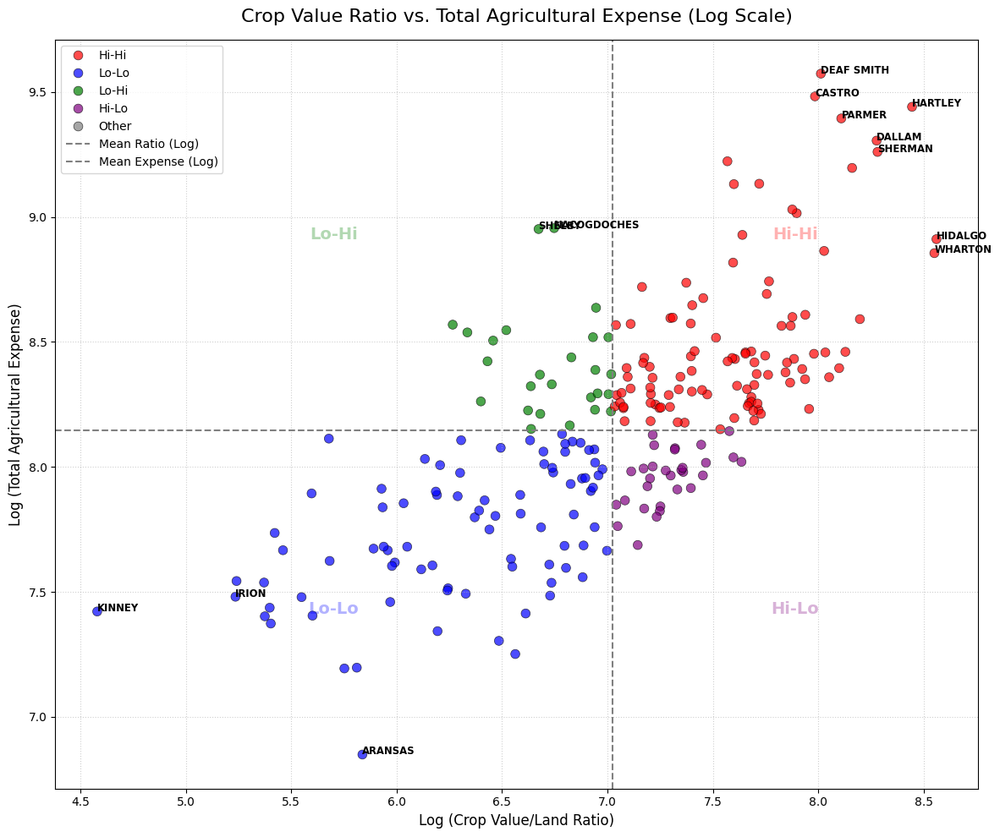

In [174]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# --- 1. Use the same DataFrame ---
df_to_plot = merged_expenses_value
x_var = 'Value_y'
y_var = 'total_expense'
name_column = 'County'  # <--- ENSURE THIS MATCHES YOUR DATA

# --- 2. Create Log-Transformed Columns ---
df_to_plot['log_' + y_var] = np.log10(df_to_plot[y_var] + 1)
df_to_plot['log_' + x_var] = np.log10(df_to_plot[x_var] + 1)

# --- 3. Calculate Quadrant Lines (Means) ---
log_x_mean = df_to_plot['log_' + x_var].mean()
log_y_mean = df_to_plot['log_' + y_var].mean()

# --- 4. Define the Quadrants ---
conditions = [
    (df_to_plot['log_' + x_var] > log_x_mean) & (df_to_plot['log_' + y_var] > log_y_mean), # Hi-Hi
    (df_to_plot['log_' + x_var] <= log_x_mean) & (df_to_plot['log_' + y_var] <= log_y_mean), # Lo-Lo
    (df_to_plot['log_' + x_var] <= log_x_mean) & (df_to_plot['log_' + y_var] > log_y_mean), # Lo-Hi
    (df_to_plot['log_' + x_var] > log_x_mean) & (df_to_plot['log_' + y_var] <= log_y_mean)  # Hi-Lo
]
choices = ['Hi-Hi', 'Lo-Lo', 'Lo-Hi', 'Hi-Lo']
df_to_plot['quadrant'] = np.select(conditions, choices, default='Other')

palette_colors = {
    'Hi-Hi': 'red', 'Lo-Lo': 'blue', 'Lo-Hi': 'green', 'Hi-Lo': 'purple', 'Other': 'grey'
}

# --- 5. Create the Scatter Plot ---
plt.figure(figsize=(12, 10))
ax = sns.scatterplot(
    data=df_to_plot,
    x='log_' + x_var,
    y='log_' + y_var,
    alpha=0.7,
    s=60,
    edgecolor='black',
    linewidth=0.5,
    hue='quadrant',
    palette=palette_colors
)

# --- 6. Add Quadrant Mean Lines ---
ax.axvline(x=log_x_mean, color='grey', linestyle='--', linewidth=1.5, label='Mean Ratio (Log)')
ax.axhline(y=log_y_mean, color='grey', linestyle='--', linewidth=1.5, label='Mean Expense (Log)')

# --- 7. Add Simplified Quadrant Text Labels ---
xmin, xmax = ax.get_xlim()
ymin, ymax = ax.get_ylim()

ax.text(log_x_mean + (xmax - log_x_mean) * 0.5, log_y_mean + (ymax - log_y_mean) * 0.5,
        'Hi-Hi', ha='center', va='center', fontsize=14, color='red', alpha=0.3, weight='bold')
ax.text(log_x_mean - (log_x_mean - xmin) * 0.5, log_y_mean - (log_y_mean - ymin) * 0.5,
        'Lo-Lo', ha='center', va='center', fontsize=14, color='blue', alpha=0.3, weight='bold')
ax.text(log_x_mean - (log_x_mean - xmin) * 0.5, log_y_mean + (ymax - log_y_mean) * 0.5,
        'Lo-Hi', ha='center', va='center', fontsize=14, color='green', alpha=0.3, weight='bold')
ax.text(log_x_mean + (xmax - log_x_mean) * 0.5, log_y_mean - (log_y_mean - ymin) * 0.5,
        'Hi-Lo', ha='center', va='center', fontsize=14, color='purple', alpha=0.3, weight='bold')

# --- 7b. NEW: Label Highest AND Lowest Outliers ---

# 1. Get the Highest values (Top Right / Top Left / Bottom Right)
top_x = df_to_plot.nlargest(5, 'log_' + x_var)
top_y = df_to_plot.nlargest(5, 'log_' + y_var)

# 2. Get the Lowest values (Bottom Left)
bot_x = df_to_plot.nsmallest(2, 'log_' + x_var)
bot_y = df_to_plot.nsmallest(2, 'log_' + y_var)

lo_hi_region = df_to_plot[
    (df_to_plot['log_' + x_var] < log_x_mean) &
    (df_to_plot['log_' + y_var] > log_y_mean)
]

# Pick the top 5 most expensive counties INSIDE the Lo-Hi region
lo_hi_labels = lo_hi_region.nlargest(2, 'log_' + y_var)

# 3. Combine all groups
# We combine global outliers + our specific Lo-Hi labels
outliers_to_label = pd.concat([top_x, top_y, bot_x, bot_y, lo_hi_labels]).drop_duplicates()


# 4. Loop and Label
for idx, row in outliers_to_label.iterrows():
    ax.text(
        row['log_' + x_var],
        row['log_' + y_var],
        row[name_column],
        horizontalalignment='left',
        size='small',
        color='black',
        weight='semibold'
    )

# --- 8. Final Touches ---
ax.set_title('Crop Value Ratio vs. Total Agricultural Expense (Log Scale)', fontsize=16, pad=15)
ax.set_xlabel('Log (Crop Value/Land Ratio)', fontsize=12)
ax.set_ylabel('Log (Total Agricultural Expense)', fontsize=12)

plt.grid(True, linestyle=':', alpha=0.6)
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles, labels, loc='best')
plt.tight_layout()
plt.show()

**1.Hi-Hi (High Value, High Expense)** — "Intensive Agriculture"

Located: East Texas, portions of South Texas

Characteristics: Specialized crops (cotton, rice, vegetables), significant capital investment, irrigation infrastructure

**2.Lo-Lo (Low Value, Low Expense)** — "Extensive Agriculture"

Located: West Texas, Panhandle, arid regions

Characteristics: Rangeland, dryland farming, minimal external inputs

**3.Lo-Hi (Low Value, High Expense)** — "Economically Distressed"

Located: Central Texas transition zones

Characteristics: High input costs with inadequate returns, marginal land conditions

**4.Hi-Lo (High Value, Low Expense)** — "Agricultural Excellence" (Rare)

Located: Select East-Central/Southeast counties

Characteristics: Advanced technology, optimal conditions, high-value specialized crops

#Irrigation data

Dataset Link: https://www.nass.usda.gov/Statistics_by_State/Texas/index.php

In [175]:
url = 'https://raw.githubusercontent.com/Nemipatel210/GIS/36d349bc7668aa0def7cef4bc77b25a46eee75af/irrigation.csv'
irrigation_2022_df = pd.read_csv(url)
display(irrigation_2022_df.head(5))

,Program,Year,Period,Week Ending,Geo Level,State,State ANSI,Ag District,Ag District Code,County,...,Zip Code,Region,watershed_code,Watershed,Commodity,Data Item,Domain,Domain Category,Value,CV (%)
0,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BELL,...,NaN,NaN,0,NaN,FACILITIES & EQUIPMENT,"FACILITIES & EQUIPMENT, IRRIGATION, SYSTEMS & ...",TOTAL,NOT SPECIFIED,104,16.3
1,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BOSQUE,...,NaN,NaN,0,NaN,FACILITIES & EQUIPMENT,"FACILITIES & EQUIPMENT, IRRIGATION, SYSTEMS & ...",TOTAL,NOT SPECIFIED,63,16.3
2,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,COLLIN,...,NaN,NaN,0,NaN,FACILITIES & EQUIPMENT,"FACILITIES & EQUIPMENT, IRRIGATION, SYSTEMS & ...",TOTAL,NOT SPECIFIED,213,16.3
3,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,COOKE,...,NaN,NaN,0,NaN,FACILITIES & EQUIPMENT,"FACILITIES & EQUIPMENT, IRRIGATION, SYSTEMS & ...",TOTAL,NOT SPECIFIED,87,16.3
4,CENSUS,2022,YEAR,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,CORYELL,...,NaN,NaN,0,NaN,FACILITIES & EQUIPMENT,"FACILITIES & EQUIPMENT, IRRIGATION, SYSTEMS & ...",TOTAL,NOT SPECIFIED,71,16.3


In [176]:
# Convert county names to uppercase for consistent merging
txC0['CNTY_NM'] = txC0['CNTY_NM'].str.upper()
irrigation_2022_df['County'] = irrigation_2022_df['County'].str.upper()

# Merge the GeoDataFrame and DataFrame
merged_irrigation_df = txC0.merge(irrigation_2022_df, left_on='CNTY_NM', right_on='County', how='outer', indicator=True)

# Select the desired columns
merged_irrigation_selected = merged_irrigation_df[['CNTY_NM', 'Value', 'geometry']]

# Display the first few rows
display(merged_irrigation_selected.head())

,CNTY_NM,Value,geometry
0,ANDERSON,93.0,"POLYGON ((-10622770.07 3774372.952, -10622743...."
1,ANDREWS,48.0,"POLYGON ((-11452352.064 3832169.96, -11452055...."
2,ANGELINA,49.0,"POLYGON ((-10560243.006 3701241.912, -10560220..."
3,ARANSAS,3.0,"POLYGON ((-10775558.316 3283921.376, -10776779..."
4,ARCHER,22.0,"POLYGON ((-10956443.534 3973368.927, -10956442..."


<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='Value', ylabel='Count'>

<Axes: xlabel='Value', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Value')

Text(0.5, 0, 'Value')

Text(0, 0.5, 'Count')

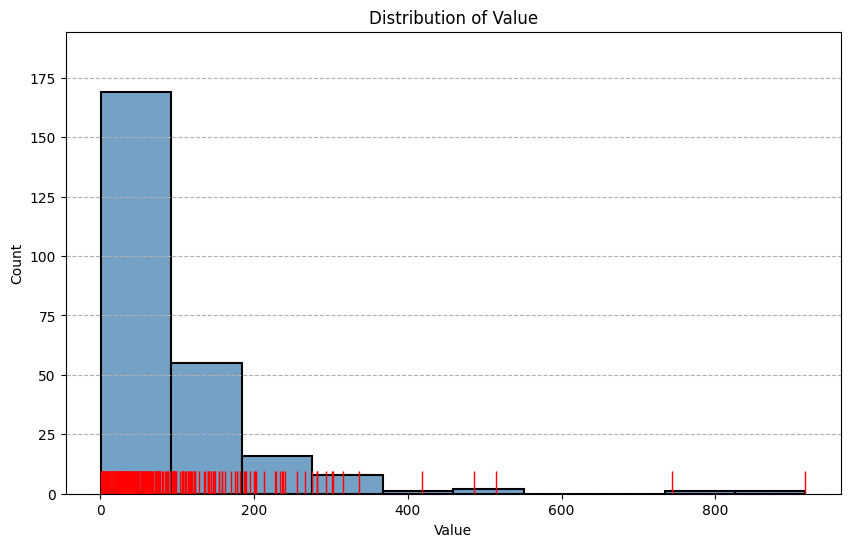

In [177]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))


sns.histplot(
    data=merged_irrigation_selected,
    x='Value',
    bins=10,  # You can adjust the number of bins
    edgecolor='black',
    color='steelblue',
    linewidth=1.5  # Adjust border thickness
)


sns.rugplot(
    data=merged_irrigation_selected,
    x='Value',
    color='red',
    height=0.05  # Adjust the height of the rug lines
)


plt.title('Distribution of Value')
plt.xlabel('Value')
plt.ylabel('Count')

plt.grid(axis='y', linestyle='--')
plt.show()

/tmp/ipython-input-1994942950.py:38: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.



<Axes: >

<Axes: >

Text(-10652051.213784467, 3736377.550899379, '93')

Text(-11425602.305243652, 3803884.786567723, '48')

Text(-10534682.94427833, 3668757.8429031204, '49')

Text(-10801100.740039364, 3258865.5967657287, '3')

Text(-10985944.934255103, 3977162.343368116, '22')

Text(-11283005.173711335, 4158758.5009404942, '29')

Text(-10967571.495613644, 3367761.034702356, '282')

Text(-10717277.62146032, 3484237.737950369, '120')

Text(-11446933.000481568, 4036316.3632710595, '95')

Text(-11043336.801275909, 3469091.4968086854, '73')

Text(-10834041.145237237, 3516982.3804795565, '170')

Text(-11044413.672927104, 3977400.235883627, '42')

Text(-10877035.213730084, 3302638.3037617262, '35')

Text(-10854620.527501754, 3637542.934899303, '104')

Text(-10961713.6447922, 3431416.11501953, '182')

Text(-10954609.328561295, 3531960.120182043, '68')

Text(-11291391.60722011, 3860777.923145968, '11')

Text(-10870177.581605379, 3749916.5917445114, '63')

Text(-10507986.279359758, 3958798.3783628186, '60')

Text(-10626592.671632413, 3402900.9124159585, '188')

Text(-10729018.180000354, 3587731.862344727, '78')

Text(-11475084.962881409, 3480785.6490147845, '31')

Text(-11266471.25505909, 4100319.851917943, '35')

Text(-10931799.977943294, 3127827.158170146, '15')

Text(-11015894.93584502, 3732439.1583725144, '69')

Text(-10757448.77416917, 3569709.0350550814, '88')

Text(-10930270.09525032, 3597882.8901430126, '87')

Text(-10867645.852642566, 3484450.787933629, '86')

Text(-10754607.99309945, 3299106.629032371, '6')

Text(-11062240.609281443, 3802376.474916164, '27')

Text(-10855212.116774943, 3014526.8914755657, '744')

Text(-10574621.043689447, 3893977.48364602, '23')

Text(-11282730.762167692, 4218249.937371347, '122')

Text(-10502769.380273802, 3908089.2982669347, '41')

Text(-11383739.656698938, 4100217.8605913725, '195')

Text(-10535048.341564704, 3464228.0569179393, '60')

Text(-10595973.594306197, 3734817.7650300087, '124')

Text(-11154962.088723026, 4100969.9983534934, '26')

Text(-10931630.346705105, 4003186.28034712, '44')

Text(-11446807.695161365, 3974285.6383479848, '117')

Text(-11190843.36690687, 3755572.3101921906, '15')

Text(-11071953.057138633, 3730106.2010563333, '15')

Text(-10749850.094525617, 3920856.595185991, '213')

Text(-11162025.91989555, 4156825.6337828324, '42')

Text(-10744969.83224426, 3452917.6413123286, '187')

Text(-10941619.40939047, 3479748.3069616007, '47')

Text(-10976280.071809065, 3759849.065417295, '276')

Text(-11116109.91986658, 3676173.16566567, '25')

Text(-10821864.484073767, 3986810.122655456, '87')

Text(-10886869.34402865, 3683617.782726614, '71')

Text(-11163444.030529937, 4039890.6871024603, '21')

Text(-11414732.308572982, 3680697.414055148, '1')

Text(-11284862.146706276, 3592352.92501165, '11')

Text(-11276642.597675506, 3974414.9859060487, '190')

Text(-11632524.45753048, 3676614.319274206, '16')

Text(-11421616.674243566, 4334632.434167339, '176')

Text(-10773210.04680207, 3864418.235007046, '76')

Text(-11348773.672867421, 3860897.6692406666, '150')

Text(-10832093.056541802, 3388231.5464658737, '61')

Text(-11421953.166743003, 4159645.5574368183, '227')

Text(-10656002.340619054, 3942775.6377024185, '29')

Text(-10810856.018896323, 3922815.5399275236, '256')

Text(-11218644.405393895, 3970581.5917491335, '46')

Text(-11105349.432150975, 3303040.8621140914, '45')

Text(-11222581.23672268, 4159090.7173727714, '63')

Text(-10966933.483644458, 3207290.2805636683, '49')

Text(-10998169.631826118, 3802326.4375723023, '76')

Text(-11415048.170190137, 3746474.150256537, '34')

Text(-11170736.273511449, 3497937.0911024967, '19')

Text(-11819041.14213286, 3723318.010119617, '486')

Text(-10771879.774525318, 3802553.654205345, '115')

Text(-10933260.146263279, 3789255.5431455607, '241')

Text(-10791368.562740926, 3665958.294480476, '43')

Text(-10699914.62451444, 3977249.872336214, '96')

Text(-10787990.39983179, 3490291.9939284017, '144')

Text(-11176736.834327785, 3861665.2565273326, '31')

Text(-11277019.25574654, 4039713.9609617875, '155')

Text(-11105422.411516283, 4024713.5118960124, '4')

Text(-10658430.13361721, 3442753.7797451345, '112')

Text(-10599445.22345008, 3918904.6834230316, '22')

Text(-10704242.976892874, 3725747.8601628067, '60')

Text(-11032592.460726786, 3358551.673225089, '148')

Text(-11425290.839199692, 3861456.1334956987, '282')

Text(-10568630.159541305, 3418918.5878509474, '48')

Text(-11276444.13240593, 3919168.60804573, '29')

Text(-11014524.577053651, 3544391.0597283803, '142')

Text(-11301242.603861328, 3745036.0219717342, '71')

Text(-10850114.056143928, 3332093.535640915, '46')

Text(-10853527.171839464, 3433692.8610199257, '77')

Text(-11222394.809245406, 4218245.843069937, '37')

Text(-10760365.822997807, 3985784.0488322373, '140')

Text(-10558004.473091662, 3830611.566014223, '28')

Text(-10685724.990779884, 3573820.015303137, '97')

Text(-10905323.014912577, 3453785.739536059, '200')

Text(-11335276.851620749, 4039473.409023593, '336')

Text(-11207708.97489335, 4099778.9435649896, '74')

Text(-10920214.44769217, 3726294.846665667, '44')

Text(-11282748.221495107, 4339451.3684354015, '66')

Text(-11102617.246169023, 4072051.9226923445, '16')

Text(-10507079.322016533, 3543754.0601057624, '56')

Text(-10618653.426373722, 3482308.8375893515, '203')

Text(-10505504.200641735, 3836874.9719418045, '82')

Text(-11421612.71884242, 4278840.892569521, '116')

Text(-11101971.446004953, 3919020.981511621, '75')

Text(-10911729.399640918, 3510640.8573514614, '80')

Text(-11162085.104131307, 4278485.942574982, '18')

Text(-10666408.272241537, 3787306.3698084466, '123')

Text(-10929935.653732404, 3050013.1525216745, '917')

Text(-10811633.738991156, 3761804.523339293, '84')

Text(-11392762.353964694, 3976044.1963498527, '303')

Text(-10888784.71358047, 3815008.104219935, '96')

Text(-10640489.296263177, 3917342.6560363336, '65')

Text(-10623579.117297273, 3666543.1577134384, '35')

Text(-11291741.584913297, 3803860.1065869806, '40')

Text(-11735799.279755313, 3674153.2216935037, '59')

Text(-10695511.30293512, 3911673.798281273, '147')

Text(-11282741.87342542, 4278645.918113776, '36')

Text(-11241165.492005095, 3672022.938663057, '26')

Text(-10928293.143636152, 3926508.808123884, '25')

Text(-10749239.47789913, 3371776.727342546, '99')

Text(-10463847.629596625, 3593957.572915866, '61')

Text(-11594875.832530946, 3601277.015348492, '26')

Text(-10475553.343871288, 3487535.398657703, '73')

Text(-10988416.428155638, 3133304.5876989197, '5')

Text(-10918999.41123528, 3206492.5230876235, '51')

Text(-10837103.51600966, 3808138.213449742, '137')

Text(-11118465.871755974, 3860439.719194596, '95')

Text(-10898386.209067374, 3368409.7419141885, '38')

Text(-10719980.32760742, 3840844.6108384053, '91')

Text(-10984555.425086277, 3493580.3240413098, '67')

Text(-10873649.037386442, 3115506.180302505, '3')

Text(-11218823.301390426, 3919303.611368402, '5')

Text(-11054637.86583279, 3509056.5318345614, '75')

Text(-11109738.339265717, 3567947.9501307704, '53')

Text(-11160435.780134037, 3977476.427025969, '9')

Text(-11177639.07711149, 3420820.1439947933, '7')

Text(-10873574.82227216, 3176047.005843416, '11')

Text(-11102314.092913155, 3977476.427025977, '57')

Text(-11031861.789881907, 3292855.4375418536, '24')

Text(-10640268.292085622, 3983298.163537224, '88')

Text(-11393746.239982413, 4038187.115280672, '294')

Text(-10940781.025356632, 3664885.4878035863, '60')

Text(-10785616.910544807, 3420030.255691792, '112')

Text(-10785611.287727917, 3541526.0159306754, '78')

Text(-10686243.983905844, 3673667.2409872916, '62')

Text(-10560220.779570349, 3527725.6122462777, '55')

Text(-10748255.087786298, 3700303.623387534, '24')

Text(-11162362.292873092, 4341766.2819953505, '35')

Text(-10925112.528755974, 3302565.5787293427, '48')

Text(-10986005.922229959, 3594400.9765988933, '51')

Text(-11334609.351890381, 3976610.116644674, '515')

Text(-11334170.453720607, 3919368.951886379, '202')

Text(-10681071.68528653, 3627613.292832558, '39')

Text(-10504486.643072508, 3866634.899870827, '12')

Text(-11349191.596254814, 3802415.0236352594, '111')

Text(-11045545.066972192, 3596382.010052818, '107')

Text(-10678752.113753095, 3350984.5296341856, '108')

Text(-11163226.37458876, 3330221.2146763736, '114')

Text(-11059213.604946107, 3661048.860159695, '28')

Text(-10820474.986083463, 3704808.31625302, '178')

Text(-10972606.744676303, 3293216.5075571537, '16')

Text(-11032724.190693662, 3424921.917201478, '419')

Text(-11109723.394328041, 3619679.558270286, '32')

Text(-11358096.218349595, 3746474.150256537, '96')

Text(-10795282.23114299, 3604863.247176975, '135')

Text(-10981877.463424243, 3694891.4100321783, '46')

Text(-11234485.765043693, 3803711.9214602476, '41')

Text(-10879470.161727618, 3990231.490535802, '96')

Text(-10632640.84031967, 3545881.237227074, '144')

Text(-11342679.047063159, 4284893.658158135, '72')

Text(-10545666.984014431, 3911656.299693924, '13')

Text(-11218764.212859668, 4038571.5090828286, '24')

Text(-10530275.266677503, 3702380.0985878003, '64')

Text(-10739645.601624876, 3771627.943914596, '59')

Text(-10435654.535076927, 3596090.687394631, '18')

Text(-11177174.63584488, 3803241.7321042456, '20')

Text(-10855372.83156041, 3220966.3089796165, '23')

Text(-11222761.704080988, 4341766.2819953505, '73')

Text(-11421773.422863796, 4220823.86456298, '27')

Text(-10453861.438680563, 3515392.0515201446, '31')

Text(-10944792.176439997, 3863550.1276676785, '35')

Text(-10498716.047864482, 3787533.2675417736, '36')

Text(-10887548.016350051, 3866783.863418746, '266')

Text(-11441897.308391284, 4100954.7614444178, '229')

Text(-11427984.593125302, 3595683.418633894, '48')

Text(-10563865.414718999, 3609084.3205311294, '56')

Text(-11342797.476684324, 4218107.129433192, '23')

Text(-11603847.35643598, 3496627.222272386, '20')

Text(-10664550.655246941, 3874843.837390235, '42')

Text(-11343072.862538125, 4158977.184130202, '118')

Text(-11301481.986050662, 3680846.346347483, '27')

Text(-11111095.452074628, 3484724.1640281137, '18')

Text(-10578502.790850528, 3980572.802698095, '45')

Text(-11538695.8230143, 3682910.320594406, '54')

Text(-10814536.456260417, 3288001.6647479567, '2')

Text(-11222512.353691116, 4278485.942574982, '8')

Text(-10743766.63195223, 3636237.9704576107, '63')

Text(-10732064.277578132, 3881888.4501332156, '45')

Text(-11129324.166944727, 3741052.202511484, '58')

Text(-10551641.809673574, 3779916.7732056733, '108')

Text(-10446901.615745027, 3681350.8938415805, '12')

Text(-10483563.449585423, 3681797.4607214415, '2')

Text(-10595190.555810235, 3582586.0356539977, '30')

Text(-10853836.387273826, 3249007.8004342234, '59')

Text(-11001749.229181565, 3659520.146548734, '107')

Text(-11191864.86524289, 3619356.5232587354, '55')

Text(-11233992.52651263, 3861661.945945409, '53')

Text(-11060030.89411233, 3860370.905480844, '8')

Text(-10478157.533434708, 3733776.711253429, '22')

Text(-11342714.208050996, 4339451.368372398, '140')

Text(-10602678.347391605, 3817475.5605061105, '234')

Text(-10885288.551571839, 3790016.149139087, '31')

Text(-10996787.222637443, 3062486.291800726, '64')

Text(-11002358.675751003, 3860366.9365446065, '4')

Text(-11248283.88915022, 3740093.819157461, '11')

Text(-11160425.314168518, 3919095.4613248855, '13')

Text(-11191891.832369946, 3567989.290384313, '12')

Text(-11325086.598852739, 4100319.851917943, '159')

Text(-10830463.545064718, 3865215.539901019, '154')

Text(-11119696.776840119, 3803038.2529784534, '45')

Text(-11372698.159453388, 3532329.2362876125, '5')

Text(-11391905.247426406, 3917588.7547772573, '316')

Text(-11044269.172387753, 3918848.748190227, '2')

Text(-10571853.681137163, 3921276.995415834, '19')

Text(-11176715.894865176, 3684324.5976529187, '238')

Text(-10884808.249413379, 3546275.283852328, '129')

Text(-10588838.558708882, 3646693.309327171, '9')

Text(-10507171.168258443, 3605898.628514942, '33')

Text(-10567261.385995327, 3857485.2498896555, '51')

Text(-11359505.521764684, 3679943.560541049, '24')

Text(-11105481.397040416, 3421309.34300814, '108')

Text(-11248739.698331285, 3473341.217646651, '48')

Text(-10668312.550762154, 3841762.15004675, '178')

Text(-10790956.071512802, 3349600.8663233267, '99')

Text(-10641375.578381598, 3604385.7681247834, '73')

Text(-10686604.726784758, 3501835.2545038434, '140')

Text(-11480226.573211487, 3692548.6517067603, '15')

Text(-10734516.64914038, 3532047.730060705, '122')

Text(-11052637.552195286, 3215364.6157878204, '37')

Text(-10711264.331331784, 3413777.153025138, '301')

Text(-11161970.038614394, 4219232.543226169, '37')

Text(-10985844.396045959, 4031900.0442301035, '163')

Text(-11044455.229209889, 4048360.7190100984, '50')

Text(-10867006.679427646, 3055626.0269560544, '118')

Text(-10868684.484123461, 3588059.249943914, '148')

Text(-10919441.005023811, 3395831.3069133083, '237')

Text(-11472927.027306773, 3746347.3673435496, '3')

Text(-10870966.502716737, 3923023.09479964, '158')

Text(-10619635.294475134, 3866985.3352128933, '98')

Text(-11446771.435360761, 3917423.161584094, '108')

Text(-10985935.029764699, 3918558.146709196, '11')

Text(-11039749.104267303, 3116807.8927304014, '10')

Text(-11105485.113157397, 3357928.253084027, '76')

Text(-10829935.653732404, 3130013.1525216745, 'HIDALGO')

Text(-10755212.116774943, 3094526.8914755657, 'CAMERON')

Text(0.5, 1.0, 'Major Aquifers of Texas with Irrigation Value by County (2022)')

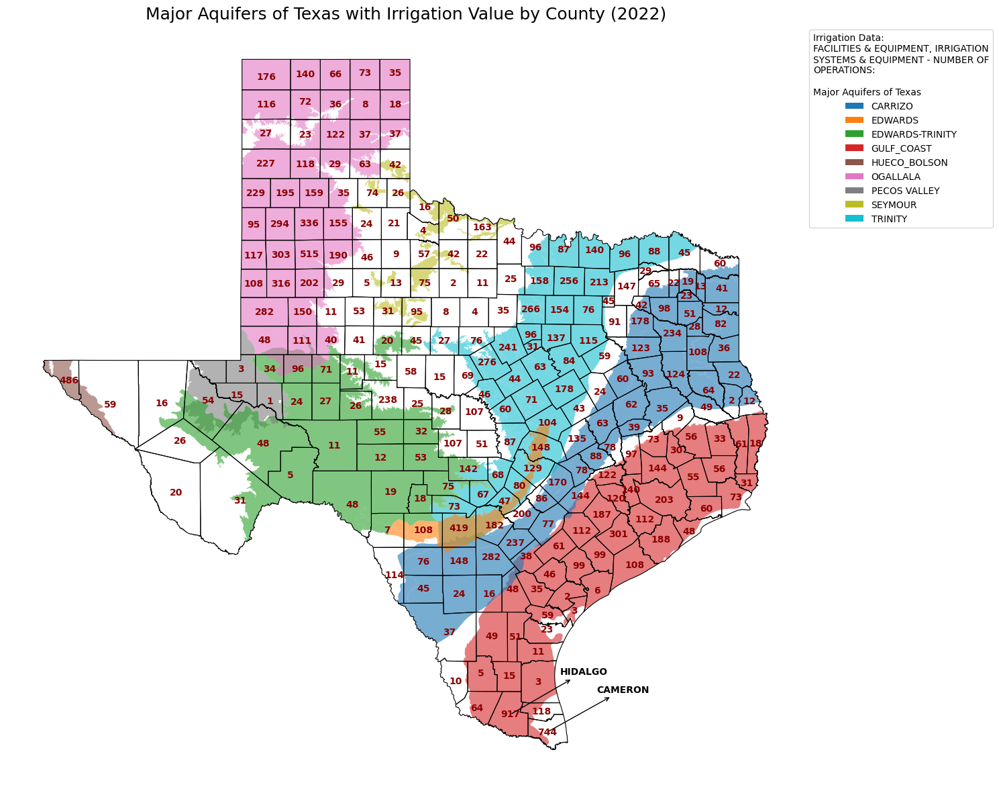

In [178]:
# Import the textwrap module to format the long legend title
import textwrap

# [Your existing code from merged_irrigation_selected = ... to color_map = dict(...)]
# ...

merged_irrigation_selected = gpd.GeoDataFrame(merged_irrigation_selected, geometry='geometry')

# Drop rows with NaN in 'Value' before plotting and calculating centroids
merged_irrigation_plot = merged_irrigation_selected.dropna(subset=['Value']).copy()

# Convert 'Value' to numeric, coercing errors
merged_irrigation_plot['Value'] = pd.to_numeric(merged_irrigation_plot['Value'], errors='coerce')

# Calculate representative points for labeling
merged_irrigation_plot['centroid_geometry'] = merged_irrigation_plot.geometry.representative_point()


# Get unique aquifer names and sort them
aquifer_names = sorted(task1['AQ_NAME'].unique())

# Define a colormap for aquifers
cmap_base = plt.colormaps['tab10'].resampled(len(aquifer_names))
colors = [mcolors.rgb2hex(cmap_base.colors[i]) for i in range(len(aquifer_names))]
color_map = dict(zip(aquifer_names, colors))


# --- Plotting the Overlay Map ---

fig, ax = plt.subplots(1, 1, figsize=(15, 15))

# PLOT 1: Plot the Aquifer Polygons
if task1.crs != merged_irrigation_plot.crs:
    aquifer_data = task1.to_crs(merged_irrigation_plot.crs)
else:
    aquifer_data = task1

aquifer_data.plot(
    column='AQ_NAME',
    ax=ax,
    legend=False,
    alpha=0.6,
    edgecolor='none',
    color=aquifer_data['AQ_NAME'].map(color_map)
)

# PLOT 2: Plot the County Boundaries
merged_irrigation_selected.plot(
    ax=ax,
    facecolor='none',
    edgecolor='black',
    linewidth=0.8
)

# PLOT 3: Add Irrigation Value Labels
for idx, row in merged_irrigation_plot.iterrows():
    ax.text(row['centroid_geometry'].x, row['centroid_geometry'].y,
            f"{row['Value']:.0f}",
            fontsize=10,
            ha='center',
            va='center',
            color='darkred',
            weight='bold'
           )


# --- Manually Create Legend ---

# Create legend handles (patches) for aquifers
legend_handles = [
    Patch(facecolor=color, label=name)
    for name, color in sorted(color_map.items())
]

# --- MODIFIED SECTION ---
# Define the different parts of the legend title
data_source_label = "FACILITIES & EQUIPMENT, IRRIGATION SYSTEMS & EQUIPMENT - NUMBER OF OPERATIONS"
wrapped_data_source = "\n".join(textwrap.wrap(data_source_label, width=35))

aquifer_title = "Major Aquifers of Texas"

# Use textwrap to format the long label nicely
# You can change width=35 to make it wider or narrowe

# Combine the parts into a single, multi-line title
full_legend_title = (
    f"Irrigation Data:\n"
    f"{wrapped_data_source}:\n\n"
    f"{aquifer_title}"
)
# --- END OF MODIFIED SECTION ---


# Add the manual legend to the plot
ax.legend(
    handles=legend_handles,
    loc='upper left',
    bbox_to_anchor=(1, 1),
    title=full_legend_title # <<< CHANGED to use the new multi-line title
)

# --- NEW: Add Annotations for Top 2 Counties by Value ---

# Sort the data by 'Value' in descending order and select the top 2
top_2_counties = merged_irrigation_plot.nlargest(2, 'Value')

# Iterate through the top 2 counties and add annotations
for idx, row in top_2_counties.iterrows():
    ax.annotate(row['CNTY_NM'],
                xy=(row['centroid_geometry'].x, row['centroid_geometry'].y),
                xytext=(row['centroid_geometry'].x + 100000, row['centroid_geometry'].y + 80000),
                textcoords='data',
                fontsize=10,
                arrowprops=dict(arrowstyle="<-", color='black', lw=1),
                ha='left',
                color='black',
                weight='bold')


# Optional: Add title and clean up the plot
ax.set_title('Major Aquifers of Texas with Irrigation Value by County (2022)', fontsize=18)
ax.set_axis_off()

plt.tight_layout()
plt.show()

1.Hidalgo and Cameron counties form the core of the Lower Rio Grande Valley (RGV), which has transformed over the past century into one of North America's most productive intensively-irrigated agricultural regions. The valley specializes in high-value crops including:​

Winter vegetables (citrus, tomatoes, peppers)

Sugarcane

Sorghum and corn

Specialty crops (melons, squash)


2.The Lower Rio Grande Valley operates through an extensive network of 25+ organized irrigation districts that manage over 2,000 miles of canals and underground pipelines.

3.The Rio Grande Valley generates exceptional economic value from irrigated agriculture. Combined value of valley agriculture often exceeds $2+ billion annually



#Line Plots For Asset per acre

All Asset per acre data from https://www.nass.usda.gov/Statistics_by_State/Texas/index.php

In [179]:
url = 'https://raw.githubusercontent.com/Nemipatel210/GIS/a7af1277adaf57a018db846354154f5f467db02d/asset_per_acre.csv'
asset_2022_df = pd.read_csv(url)
display(asset_2022_df.head(5))

,Program,Year,Period,Week Ending,Geo Level,State,State ANSI,Ag District,Ag District Code,County,...,Zip Code,Region,watershed_code,Watershed,Commodity,Data Item,Domain,Domain Category,Value,CV (%)
0,CENSUS,2022,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BELL,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"4,587",8.8
1,CENSUS,2022,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BOSQUE,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"3,405",8.8
2,CENSUS,2022,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,COLLIN,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"13,066",8.8
3,CENSUS,2022,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,COOKE,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"4,391",8.8
4,CENSUS,2022,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,CORYELL,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"3,621",8.8


In [180]:
# Convert county names to uppercase for consistent merging
txC0['CNTY_NM'] = txC0['CNTY_NM'].str.upper()
asset_2022_df['County'] = asset_2022_df['County'].str.upper()

# Merge the GeoDataFrame and DataFrame
merged_asset_df = txC0.merge(asset_2022_df, left_on='CNTY_NM', right_on='County', how='outer', indicator=True)

# Select the desired columns
merged_asset_selected = merged_asset_df[['CNTY_NM', 'Value', 'geometry']]

# Display the first few rows
display(merged_asset_selected.head())

,CNTY_NM,Value,geometry
0,ANDERSON,"3,818","POLYGON ((-10622770.07 3774372.952, -10622743...."
1,ANDREWS,"1,595","POLYGON ((-11452352.064 3832169.96, -11452055...."
2,ANGELINA,"4,498","POLYGON ((-10560243.006 3701241.912, -10560220..."
3,ARANSAS,"1,831","POLYGON ((-10775558.316 3283921.376, -10776779..."
4,ARCHER,"2,017","POLYGON ((-10956443.534 3973368.927, -10956442..."


In [181]:
url = 'https://raw.githubusercontent.com/Nemipatel210/GIS/a796c1a46aacbc194e5105712a3faaadded02164/asset_per_acre2017.csv'
asset_2017_df = pd.read_csv(url)
display(asset_2017_df.head(5))

,Program,Year,Period,Week Ending,Geo Level,State,State ANSI,Ag District,Ag District Code,County,...,Zip Code,Region,watershed_code,Watershed,Commodity,Data Item,Domain,Domain Category,Value,CV (%)
0,CENSUS,2017,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BELL,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"3,282",18.7
1,CENSUS,2017,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BOSQUE,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"2,483",18.7
2,CENSUS,2017,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,COLLIN,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"9,946",18.7
3,CENSUS,2017,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,COOKE,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"3,307",18.7
4,CENSUS,2017,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,CORYELL,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"2,606",18.7


In [182]:
# Convert county names to uppercase for consistent merging
txC0['CNTY_NM'] = txC0['CNTY_NM'].str.upper()
asset_2017_df['County'] = asset_2017_df['County'].str.upper()

# Merge the GeoDataFrame and DataFrame
merged_asset_df = txC0.merge(asset_2017_df, left_on='CNTY_NM', right_on='County', how='outer', indicator=True)

# Select the desired columns
merged_asset_selected_2017 = merged_asset_df[['CNTY_NM', 'Value', 'geometry']]

# Display the first few rows
display(merged_asset_selected_2017.head())

,CNTY_NM,Value,geometry
0,ANDERSON,"2,836","POLYGON ((-10622770.07 3774372.952, -10622743...."
1,ANDREWS,787,"POLYGON ((-11452352.064 3832169.96, -11452055...."
2,ANGELINA,"3,644","POLYGON ((-10560243.006 3701241.912, -10560220..."
3,ARANSAS,"1,684","POLYGON ((-10775558.316 3283921.376, -10776779..."
4,ARCHER,"1,486","POLYGON ((-10956443.534 3973368.927, -10956442..."


In [183]:
url = 'https://raw.githubusercontent.com/Nemipatel210/GIS/a796c1a46aacbc194e5105712a3faaadded02164/asset_per_acre2012.csv'
asset_2012_df = pd.read_csv(url)
display(asset_2012_df.head(5))

,Program,Year,Period,Week Ending,Geo Level,State,State ANSI,Ag District,Ag District Code,County,...,Zip Code,Region,watershed_code,Watershed,Commodity,Data Item,Domain,Domain Category,Value,CV (%)
0,CENSUS,2012,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BELL,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"3,062",6.2
1,CENSUS,2012,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BOSQUE,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"2,420",6.2
2,CENSUS,2012,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,COLLIN,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"5,303",6.2
3,CENSUS,2012,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,COOKE,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"3,267",6.2
4,CENSUS,2012,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,CORYELL,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"2,432",6.2


In [184]:
# Convert county names to uppercase for consistent merging
txC0['CNTY_NM'] = txC0['CNTY_NM'].str.upper()
asset_2012_df['County'] = asset_2012_df['County'].str.upper()

# Merge the GeoDataFrame and DataFrame
merged_asset_df = txC0.merge(asset_2012_df, left_on='CNTY_NM', right_on='County', how='outer', indicator=True)

# Select the desired columns
merged_asset_selected_2012 = merged_asset_df[['CNTY_NM', 'Value', 'geometry']]

# Display the first few rows
display(merged_asset_selected_2012.head())

,CNTY_NM,Value,geometry
0,ANDERSON,"2,446","POLYGON ((-10622770.07 3774372.952, -10622743...."
1,ANDREWS,328,"POLYGON ((-11452352.064 3832169.96, -11452055...."
2,ANGELINA,"3,157","POLYGON ((-10560243.006 3701241.912, -10560220..."
3,ARANSAS,"1,704","POLYGON ((-10775558.316 3283921.376, -10776779..."
4,ARCHER,984,"POLYGON ((-10956443.534 3973368.927, -10956442..."


In [185]:
url = 'https://raw.githubusercontent.com/Nemipatel210/GIS/a796c1a46aacbc194e5105712a3faaadded02164/asset_per_acre2007.csv'
asset_2007_df = pd.read_csv(url)
display(asset_2007_df.head(5))



,Program,Year,Period,Week Ending,Geo Level,State,State ANSI,Ag District,Ag District Code,County,...,Zip Code,Region,watershed_code,Watershed,Commodity,Data Item,Domain,Domain Category,Value,CV (%)
0,CENSUS,2007,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BELL,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"2,359",NaN
1,CENSUS,2007,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BOSQUE,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"2,158",NaN
2,CENSUS,2007,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,COLLIN,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"3,462",NaN
3,CENSUS,2007,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,COOKE,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"2,489",NaN
4,CENSUS,2007,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,CORYELL,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"2,004",NaN


In [186]:
# Convert county names to uppercase for consistent merging
txC0['CNTY_NM'] = txC0['CNTY_NM'].str.upper()
asset_2007_df['County'] = asset_2007_df['County'].str.upper()

# Merge the GeoDataFrame and DataFrame
merged_asset_df = txC0.merge(asset_2007_df, left_on='CNTY_NM', right_on='County', how='outer', indicator=True)

# Select the desired columns
merged_asset_selected_2007 = merged_asset_df[['CNTY_NM', 'Value', 'geometry']]

# Display the first few rows
display(merged_asset_selected_2007.head())

,CNTY_NM,Value,geometry
0,ANDERSON,"2,232","POLYGON ((-10622770.07 3774372.952, -10622743...."
1,ANDREWS,340,"POLYGON ((-11452352.064 3832169.96, -11452055...."
2,ANGELINA,"2,798","POLYGON ((-10560243.006 3701241.912, -10560220..."
3,ARANSAS,"1,380","POLYGON ((-10775558.316 3283921.376, -10776779..."
4,ARCHER,973,"POLYGON ((-10956443.534 3973368.927, -10956442..."


In [187]:
url = 'https://raw.githubusercontent.com/Nemipatel210/GIS/a796c1a46aacbc194e5105712a3faaadded02164/asset_per_acre2002.csv'
asset_2002_df = pd.read_csv(url)
display(asset_2002_df.head(5))

,Program,Year,Period,Week Ending,Geo Level,State,State ANSI,Ag District,Ag District Code,County,...,Zip Code,Region,watershed_code,Watershed,Commodity,Data Item,Domain,Domain Category,Value,CV (%)
0,CENSUS,2002,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BELL,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"1,293",NaN
1,CENSUS,2002,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,BOSQUE,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"1,477",NaN
2,CENSUS,2002,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,COLLIN,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"2,534",NaN
3,CENSUS,2002,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,COOKE,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"1,413",NaN
4,CENSUS,2002,END OF DEC,NaN,COUNTY,TEXAS,48,BLACKLANDS,40,CORYELL,...,NaN,NaN,0,NaN,AG LAND,"AG LAND, INCL BUILDINGS - ASSET VALUE, MEASURE...",TOTAL,NOT SPECIFIED,"1,063",NaN


In [188]:
# Convert county names to uppercase for consistent merging
txC0['CNTY_NM'] = txC0['CNTY_NM'].str.upper()
asset_2002_df['County'] = asset_2002_df['County'].str.upper()

# Merge the GeoDataFrame and DataFrame
merged_asset_df = txC0.merge(asset_2002_df, left_on='CNTY_NM', right_on='County', how='outer', indicator=True)

# Select the desired columns
merged_asset_selected_2002 = merged_asset_df[['CNTY_NM', 'Value', 'geometry']]

# Display the first few rows
display(merged_asset_selected_2002.head())

,CNTY_NM,Value,geometry
0,ANDERSON,"1,038","POLYGON ((-10622770.07 3774372.952, -10622743...."
1,ANDREWS,164,"POLYGON ((-11452352.064 3832169.96, -11452055...."
2,ANGELINA,"2,320","POLYGON ((-10560243.006 3701241.912, -10560220..."
3,ARANSAS,"1,008","POLYGON ((-10775558.316 3283921.376, -10776779..."
4,ARCHER,529,"POLYGON ((-10956443.534 3973368.927, -10956442..."


In [189]:
import pandas as pd
import geopandas as gpd # Assuming txC0 is a GeoDataFrame

# --- 1. Setup ---

# Put all your asset DataFrames and their corresponding years into a list
asset_dfs_list = [
    (asset_2022_df, 2022),
    (asset_2017_df, 2017),
    (asset_2012_df, 2012),
    (asset_2007_df, 2007),
    (asset_2002_df, 2002)
]

# Prepare your base GeoDataFrame (the map) ONE time
txC0['CNTY_NM'] = txC0['CNTY_NM'].str.upper()

# Start with the base geometry and county names
# We use .copy() to avoid any SettingWithCopyWarning
final_merged_gdf = txC0[['CNTY_NM', 'geometry']].copy()

# --- 2. Loop and Merge ---

print("Starting merge process...")

for df, year in asset_dfs_list:
    # 1. Prepare the year-specific DataFrame
    df['County'] = df['County'].str.upper()

    # 2. Select and RENAME the 'Value' column to be year-specific
    # This is the most important step!
    df_temp = df[['County', 'Value']].rename(columns={'Value': f'Value_{year}'})

    # 3. Perform the outer merge onto the single final DataFrame
    # We use a unique indicator name for each year's merge
    final_merged_gdf = final_merged_gdf.merge(
        df_temp,
        left_on='CNTY_NM',
        right_on='County',
        how='outer',
        indicator=f'merge_status_{year}' # Fulfills your 'indicator=True' request
    )

    # 4. Clean up the extra 'County' column added by the merge
    if 'County' in final_merged_gdf.columns:
        final_merged_gdf = final_merged_gdf.drop(columns='County')

print("Merge complete.")

# --- 3. Display Results ---

# Display the first few rows of the final combined DataFrame
display(final_merged_gdf.head())

# Display the info to see all your new columns
final_merged_gdf.info()

# You can also inspect the merge status columns
# status_cols = [col for col in final_merged_gdf.columns if 'merge_status' in col]
# display(final_merged_gdf[status_cols].head())

Starting merge process...
Merge complete.


,CNTY_NM,geometry,Value_2022,merge_status_2022,Value_2017,merge_status_2017,Value_2012,merge_status_2012,Value_2007,merge_status_2007,Value_2002,merge_status_2002
0,ANDERSON,"POLYGON ((-10622770.07 3774372.952, -10622743....","3,818",both,"2,836",both,"2,446",both,"2,232",both,"1,038",both
1,ANDREWS,"POLYGON ((-11452352.064 3832169.96, -11452055....","1,595",both,787,both,328,both,340,both,164,both
2,ANGELINA,"POLYGON ((-10560243.006 3701241.912, -10560220...","4,498",both,"3,644",both,"3,157",both,"2,798",both,"2,320",both
3,ARANSAS,"POLYGON ((-10775558.316 3283921.376, -10776779...","1,831",both,"1,684",both,"1,704",both,"1,380",both,"1,008",both
4,ARCHER,"POLYGON ((-10956443.534 3973368.927, -10956442...","2,017",both,"1,486",both,984,both,973,both,529,both


<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 254 entries, 0 to 253
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   CNTY_NM            254 non-null    object  
 1   geometry           254 non-null    geometry
 2   Value_2022         254 non-null    object  
 3   merge_status_2022  254 non-null    category
 4   Value_2017         254 non-null    object  
 5   merge_status_2017  254 non-null    category
 6   Value_2012         254 non-null    object  
 7   merge_status_2012  254 non-null    category
 8   Value_2007         254 non-null    object  
 9   merge_status_2007  254 non-null    category
 10  Value_2002         254 non-null    object  
 11  merge_status_2002  254 non-null    category
dtypes: category(5), geometry(1), object(6)
memory usage: 15.9+ KB


In [190]:
import geopandas as gpd
import pandas as pd
from sklearn.cluster import KMeans

# --- 1. Load your main county data (you already have this) ---
# 'gdf' is your GeoDataFrame with val_2002, val_2007, etc.
# We'll assume gdf is already loaded.

# --- 2. Calculate Centroids ---
# We need to make sure we're using a projected CRS (like Web Mercator)
# so the 'distance' calculation for clustering is accurate.
gdf_projected = final_merged_gdf.to_crs(epsg=3857)

# Get the centroid (geographic center) of each county
gdf_projected['centroid'] = gdf_projected.geometry.centroid

# --- 3. Extract X and Y Coordinates ---
# K-Means works on a simple set of numbers (X, Y), not geometry
coords = pd.DataFrame({
    'x': gdf_projected.centroid.x,
    'y': gdf_projected.centroid.y
})

# --- 4. Run K-Means Clustering ---
# n_clusters=6 will create 6 groups. You can change this to 5, 7, etc.
kmeans = KMeans(n_clusters=6, random_state=42, n_init=10)
cluster_labels = kmeans.fit_predict(coords)

# --- 5. Add Cluster Labels back to the *Original* DataFrame ---
# 'cluster_labels' is just an array [0, 2, 1, 5, 0, 3, ...]
# We add it as a new column to your original 'gdf'
final_merged_gdf['Region'] = cluster_labels

# --- 6. Make the Region Label Clearer (Optional but Recommended) ---
# This converts numbers (0, 1, 2...) to strings ("Region 0", "Region 1"...)
# which looks much better on a plot legend.
final_merged_gdf['Region'] = 'Region ' + final_merged_gdf['Region'].astype(str)

print("K-Means clustering complete. New 'Region' column added:")
print(final_merged_gdf[['CNTY_NM', 'Value_2017','Value_2012', 'Region']].head())

K-Means clustering complete. New 'Region' column added:
    CNTY_NM Value_2017 Value_2012    Region
0  ANDERSON      2,836      2,446  Region 2
1   ANDREWS        787        328  Region 5
2  ANGELINA      3,644      3,157  Region 4
3   ARANSAS      1,684      1,704  Region 0
4    ARCHER      1,486        984  Region 1


In [191]:
final_merged_gdf.head(5)

,CNTY_NM,geometry,Value_2022,merge_status_2022,Value_2017,merge_status_2017,Value_2012,merge_status_2012,Value_2007,merge_status_2007,Value_2002,merge_status_2002,Region
0,ANDERSON,"POLYGON ((-10622770.07 3774372.952, -10622743....","3,818",both,"2,836",both,"2,446",both,"2,232",both,"1,038",both,Region 2
1,ANDREWS,"POLYGON ((-11452352.064 3832169.96, -11452055....","1,595",both,787,both,328,both,340,both,164,both,Region 5
2,ANGELINA,"POLYGON ((-10560243.006 3701241.912, -10560220...","4,498",both,"3,644",both,"3,157",both,"2,798",both,"2,320",both,Region 4
3,ARANSAS,"POLYGON ((-10775558.316 3283921.376, -10776779...","1,831",both,"1,684",both,"1,704",both,"1,380",both,"1,008",both,Region 0
4,ARCHER,"POLYGON ((-10956443.534 3973368.927, -10956442...","2,017",both,"1,486",both,984,both,973,both,529,both,Region 1


In [192]:
final_merged_gdf_year=final_merged_gdf[['CNTY_NM', 'Value_2022','Value_2017','Value_2012','Value_2007','Value_2002', 'Region']]
final_merged_gdf_year.head(5)

,CNTY_NM,Value_2022,Value_2017,Value_2012,Value_2007,Value_2002,Region
0,ANDERSON,"3,818","2,836","2,446","2,232","1,038",Region 2
1,ANDREWS,"1,595",787,328,340,164,Region 5
2,ANGELINA,"4,498","3,644","3,157","2,798","2,320",Region 4
3,ARANSAS,"1,831","1,684","1,704","1,380","1,008",Region 0
4,ARCHER,"2,017","1,486",984,973,529,Region 1


/tmp/ipython-input-936174098.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipython-input-936174098.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipython-input-936174098.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipython-input-936174

Text(0.5, 1.0, 'Trends by County for Region 2')

Text(0.5, 0, 'Value')

Text(0, 0.5, 'County Name')

[Text(0, 0.0, 'ANDERSON'),
 Text(0, 1.0, 'BOWIE'),
 Text(0, 2.0, 'CAMP'),
 Text(0, 3.0, 'CASS'),
 Text(0, 4.0, 'CHEROKEE'),
 Text(0, 5.0, 'COLLIN'),
 Text(0, 6.0, 'COOKE'),
 Text(0, 7.0, 'DALLAS'),
 Text(0, 8.0, 'DELTA'),
 Text(0, 9.0, 'DENTON'),
 Text(0, 10.0, 'ELLIS'),
 Text(0, 11.0, 'FANNIN'),
 Text(0, 12.0, 'FRANKLIN'),
 Text(0, 13.0, 'FREESTONE'),
 Text(0, 14.0, 'GRAYSON'),
 Text(0, 15.0, 'GREGG'),
 Text(0, 16.0, 'HARRISON'),
 Text(0, 17.0, 'HENDERSON'),
 Text(0, 18.0, 'HILL'),
 Text(0, 19.0, 'HOPKINS'),
 Text(0, 20.0, 'HUNT'),
 Text(0, 21.0, 'KAUFMAN'),
 Text(0, 22.0, 'LAMAR'),
 Text(0, 23.0, 'MARION'),
 Text(0, 24.0, 'MORRIS'),
 Text(0, 25.0, 'NACOGDOCHES'),
 Text(0, 26.0, 'NAVARRO'),
 Text(0, 27.0, 'PANOLA'),
 Text(0, 28.0, 'RAINS'),
 Text(0, 29.0, 'RED RIVER'),
 Text(0, 30.0, 'ROCKWALL'),
 Text(0, 31.0, 'RUSK'),
 Text(0, 32.0, 'SHELBY'),
 Text(0, 33.0, 'SMITH'),
 Text(0, 34.0, 'TARRANT'),
 Text(0, 35.0, 'TITUS'),
 Text(0, 36.0, 'UPSHUR'),
 Text(0, 37.0, 'VAN ZANDT'),
 Text(0, 

Text(0.5, 1.0, 'Trends by County for Region 5')

Text(0.5, 0, 'Value')

Text(0, 0.5, 'County Name')

[Text(0, 0.0, 'ANDREWS'),
 Text(0, 1.0, 'BORDEN'),
 Text(0, 2.0, 'BREWSTER'),
 Text(0, 3.0, 'CRANE'),
 Text(0, 4.0, 'CROCKETT'),
 Text(0, 5.0, 'CULBERSON'),
 Text(0, 6.0, 'DAWSON'),
 Text(0, 7.0, 'ECTOR'),
 Text(0, 8.0, 'EL PASO'),
 Text(0, 9.0, 'GAINES'),
 Text(0, 10.0, 'GLASSCOCK'),
 Text(0, 11.0, 'HOWARD'),
 Text(0, 12.0, 'HUDSPETH'),
 Text(0, 13.0, 'IRION'),
 Text(0, 14.0, 'JEFF DAVIS'),
 Text(0, 15.0, 'LOVING'),
 Text(0, 16.0, 'LYNN'),
 Text(0, 17.0, 'MARTIN'),
 Text(0, 18.0, 'MIDLAND'),
 Text(0, 19.0, 'MITCHELL'),
 Text(0, 20.0, 'PECOS'),
 Text(0, 21.0, 'PRESIDIO'),
 Text(0, 22.0, 'REAGAN'),
 Text(0, 23.0, 'REEVES'),
 Text(0, 24.0, 'SCHLEICHER'),
 Text(0, 25.0, 'STERLING'),
 Text(0, 26.0, 'SUTTON'),
 Text(0, 27.0, 'TERRELL'),
 Text(0, 28.0, 'TERRY'),
 Text(0, 29.0, 'UPTON'),
 Text(0, 30.0, 'VAL VERDE'),
 Text(0, 31.0, 'WARD'),
 Text(0, 32.0, 'WINKLER'),
 Text(0, 33.0, 'YOAKUM')]

Text(0.5, 1.0, 'Trends by County for Region 4')

Text(0.5, 0, 'Value')

Text(0, 0.5, 'County Name')

[Text(0, 0.0, 'ANGELINA'),
 Text(0, 1.0, 'AUSTIN'),
 Text(0, 2.0, 'BASTROP'),
 Text(0, 3.0, 'BELL'),
 Text(0, 4.0, 'BRAZORIA'),
 Text(0, 5.0, 'BRAZOS'),
 Text(0, 6.0, 'BURLESON'),
 Text(0, 7.0, 'CHAMBERS'),
 Text(0, 8.0, 'COLORADO'),
 Text(0, 9.0, 'FALLS'),
 Text(0, 10.0, 'FAYETTE'),
 Text(0, 11.0, 'FORT BEND'),
 Text(0, 12.0, 'GALVESTON'),
 Text(0, 13.0, 'GRIMES'),
 Text(0, 14.0, 'HARDIN'),
 Text(0, 15.0, 'HARRIS'),
 Text(0, 16.0, 'HOUSTON'),
 Text(0, 17.0, 'JASPER'),
 Text(0, 18.0, 'JEFFERSON'),
 Text(0, 19.0, 'LAVACA'),
 Text(0, 20.0, 'LEE'),
 Text(0, 21.0, 'LEON'),
 Text(0, 22.0, 'LIBERTY'),
 Text(0, 23.0, 'LIMESTONE'),
 Text(0, 24.0, 'MADISON'),
 Text(0, 25.0, 'MATAGORDA'),
 Text(0, 26.0, 'MCLENNAN'),
 Text(0, 27.0, 'MILAM'),
 Text(0, 28.0, 'MONTGOMERY'),
 Text(0, 29.0, 'NEWTON'),
 Text(0, 30.0, 'ORANGE'),
 Text(0, 31.0, 'POLK'),
 Text(0, 32.0, 'ROBERTSON'),
 Text(0, 33.0, 'SABINE'),
 Text(0, 34.0, 'SAN AUGUSTINE'),
 Text(0, 35.0, 'SAN JACINTO'),
 Text(0, 36.0, 'TRAVIS'),
 Text(0,

Text(0.5, 1.0, 'Trends by County for Region 0')

Text(0.5, 0, 'Value')

Text(0, 0.5, 'County Name')

[Text(0, 0.0, 'ARANSAS'),
 Text(0, 1.0, 'ATASCOSA'),
 Text(0, 2.0, 'BANDERA'),
 Text(0, 3.0, 'BEE'),
 Text(0, 4.0, 'BEXAR'),
 Text(0, 5.0, 'BLANCO'),
 Text(0, 6.0, 'BROOKS'),
 Text(0, 7.0, 'CALDWELL'),
 Text(0, 8.0, 'CALHOUN'),
 Text(0, 9.0, 'CAMERON'),
 Text(0, 10.0, 'COMAL'),
 Text(0, 11.0, 'DE WITT'),
 Text(0, 12.0, 'DIMMIT'),
 Text(0, 13.0, 'DUVAL'),
 Text(0, 14.0, 'EDWARDS'),
 Text(0, 15.0, 'FRIO'),
 Text(0, 16.0, 'GILLESPIE'),
 Text(0, 17.0, 'GOLIAD'),
 Text(0, 18.0, 'GONZALES'),
 Text(0, 19.0, 'GUADALUPE'),
 Text(0, 20.0, 'HAYS'),
 Text(0, 21.0, 'HIDALGO'),
 Text(0, 22.0, 'JACKSON'),
 Text(0, 23.0, 'JIM HOGG'),
 Text(0, 24.0, 'JIM WELLS'),
 Text(0, 25.0, 'KARNES'),
 Text(0, 26.0, 'KENDALL'),
 Text(0, 27.0, 'KENEDY'),
 Text(0, 28.0, 'KERR'),
 Text(0, 29.0, 'KINNEY'),
 Text(0, 30.0, 'KLEBERG'),
 Text(0, 31.0, 'LA SALLE'),
 Text(0, 32.0, 'LIVE OAK'),
 Text(0, 33.0, 'MAVERICK'),
 Text(0, 34.0, 'MCMULLEN'),
 Text(0, 35.0, 'MEDINA'),
 Text(0, 36.0, 'NUECES'),
 Text(0, 37.0, 'REAL'),
 

Text(0.5, 1.0, 'Trends by County for Region 1')

Text(0.5, 0, 'Value')

Text(0, 0.5, 'County Name')

[Text(0, 0.0, 'ARCHER'),
 Text(0, 1.0, 'BAYLOR'),
 Text(0, 2.0, 'BOSQUE'),
 Text(0, 3.0, 'BROWN'),
 Text(0, 4.0, 'BURNET'),
 Text(0, 5.0, 'CALLAHAN'),
 Text(0, 6.0, 'CLAY'),
 Text(0, 7.0, 'COKE'),
 Text(0, 8.0, 'COLEMAN'),
 Text(0, 9.0, 'COMANCHE'),
 Text(0, 10.0, 'CONCHO'),
 Text(0, 11.0, 'CORYELL'),
 Text(0, 12.0, 'EASTLAND'),
 Text(0, 13.0, 'ERATH'),
 Text(0, 14.0, 'FISHER'),
 Text(0, 15.0, 'HAMILTON'),
 Text(0, 16.0, 'HASKELL'),
 Text(0, 17.0, 'HOOD'),
 Text(0, 18.0, 'JACK'),
 Text(0, 19.0, 'JOHNSON'),
 Text(0, 20.0, 'JONES'),
 Text(0, 21.0, 'KENT'),
 Text(0, 22.0, 'KIMBLE'),
 Text(0, 23.0, 'KNOX'),
 Text(0, 24.0, 'LAMPASAS'),
 Text(0, 25.0, 'LLANO'),
 Text(0, 26.0, 'MASON'),
 Text(0, 27.0, 'MCCULLOCH'),
 Text(0, 28.0, 'MENARD'),
 Text(0, 29.0, 'MILLS'),
 Text(0, 30.0, 'MONTAGUE'),
 Text(0, 31.0, 'NOLAN'),
 Text(0, 32.0, 'PALO PINTO'),
 Text(0, 33.0, 'PARKER'),
 Text(0, 34.0, 'RUNNELS'),
 Text(0, 35.0, 'SAN SABA'),
 Text(0, 36.0, 'SCURRY'),
 Text(0, 37.0, 'SHACKELFORD'),
 Text(0, 3

Text(0.5, 1.0, 'Trends by County for Region 3')

Text(0.5, 0, 'Value')

Text(0, 0.5, 'County Name')

[Text(0, 0.0, 'ARMSTRONG'),
 Text(0, 1.0, 'BAILEY'),
 Text(0, 2.0, 'BRISCOE'),
 Text(0, 3.0, 'CARSON'),
 Text(0, 4.0, 'CASTRO'),
 Text(0, 5.0, 'CHILDRESS'),
 Text(0, 6.0, 'COCHRAN'),
 Text(0, 7.0, 'COLLINGSWORTH'),
 Text(0, 8.0, 'COTTLE'),
 Text(0, 9.0, 'CROSBY'),
 Text(0, 10.0, 'DALLAM'),
 Text(0, 11.0, 'DEAF SMITH'),
 Text(0, 12.0, 'DICKENS'),
 Text(0, 13.0, 'DONLEY'),
 Text(0, 14.0, 'FLOYD'),
 Text(0, 15.0, 'FOARD'),
 Text(0, 16.0, 'GARZA'),
 Text(0, 17.0, 'GRAY'),
 Text(0, 18.0, 'HALE'),
 Text(0, 19.0, 'HALL'),
 Text(0, 20.0, 'HANSFORD'),
 Text(0, 21.0, 'HARDEMAN'),
 Text(0, 22.0, 'HARTLEY'),
 Text(0, 23.0, 'HEMPHILL'),
 Text(0, 24.0, 'HOCKLEY'),
 Text(0, 25.0, 'HUTCHINSON'),
 Text(0, 26.0, 'KING'),
 Text(0, 27.0, 'LAMB'),
 Text(0, 28.0, 'LIPSCOMB'),
 Text(0, 29.0, 'LUBBOCK'),
 Text(0, 30.0, 'MOORE'),
 Text(0, 31.0, 'MOTLEY'),
 Text(0, 32.0, 'OCHILTREE'),
 Text(0, 33.0, 'OLDHAM'),
 Text(0, 34.0, 'PARMER'),
 Text(0, 35.0, 'POTTER'),
 Text(0, 36.0, 'RANDALL'),
 Text(0, 37.0, 'ROBERTS

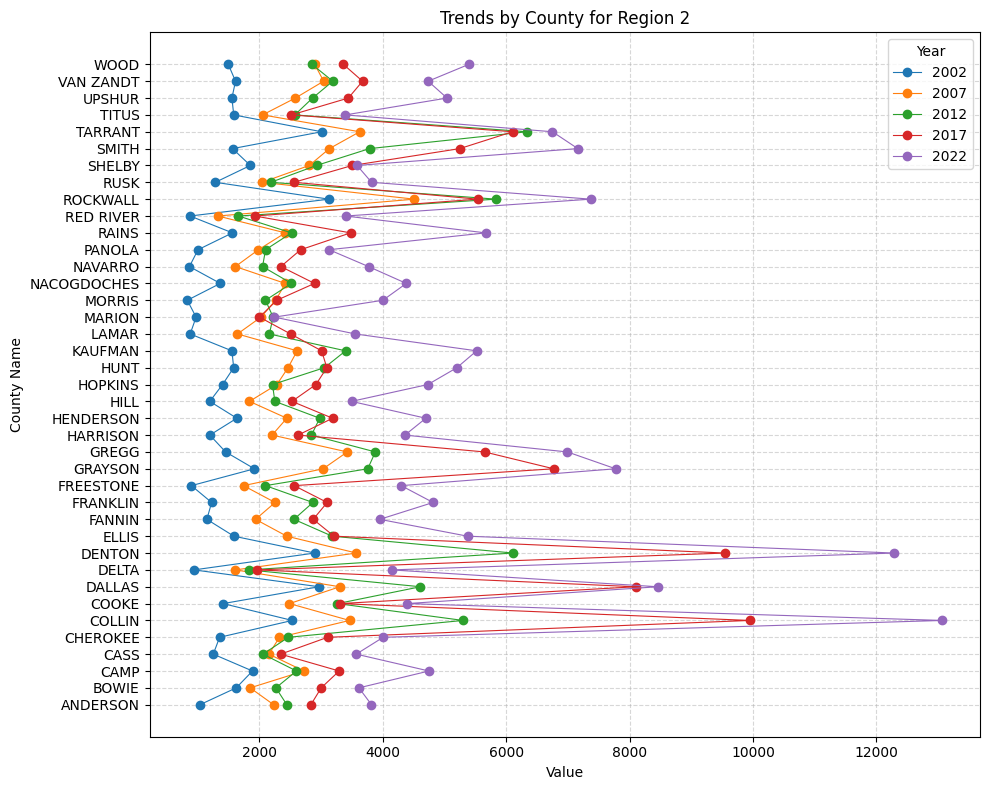

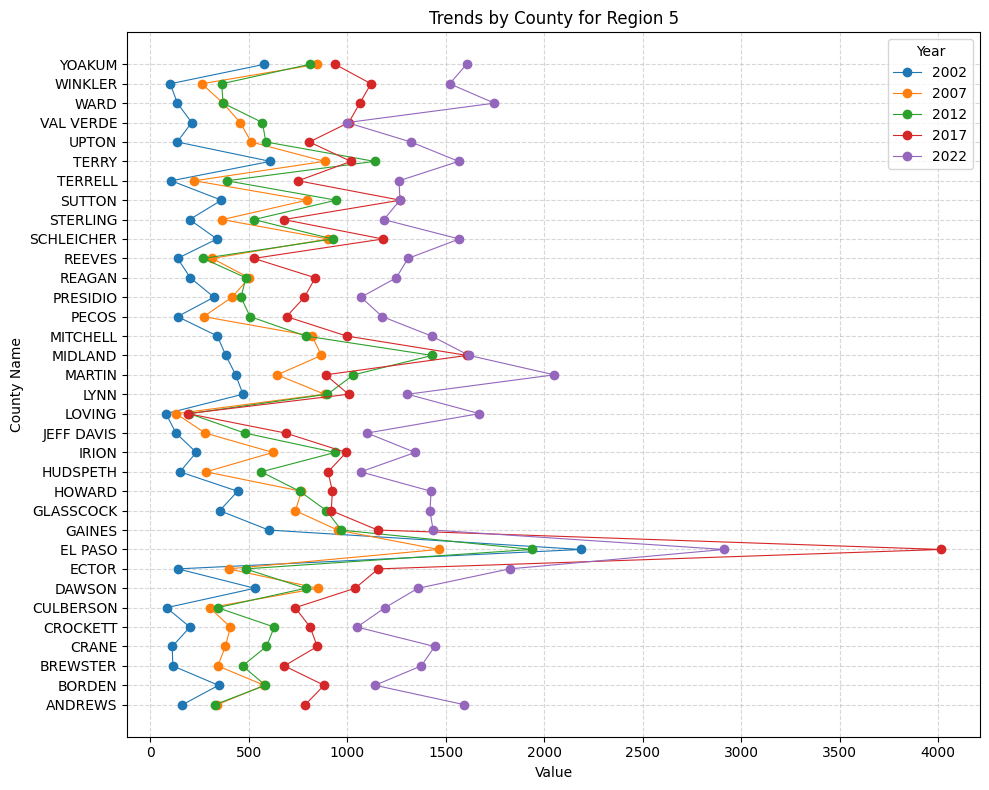

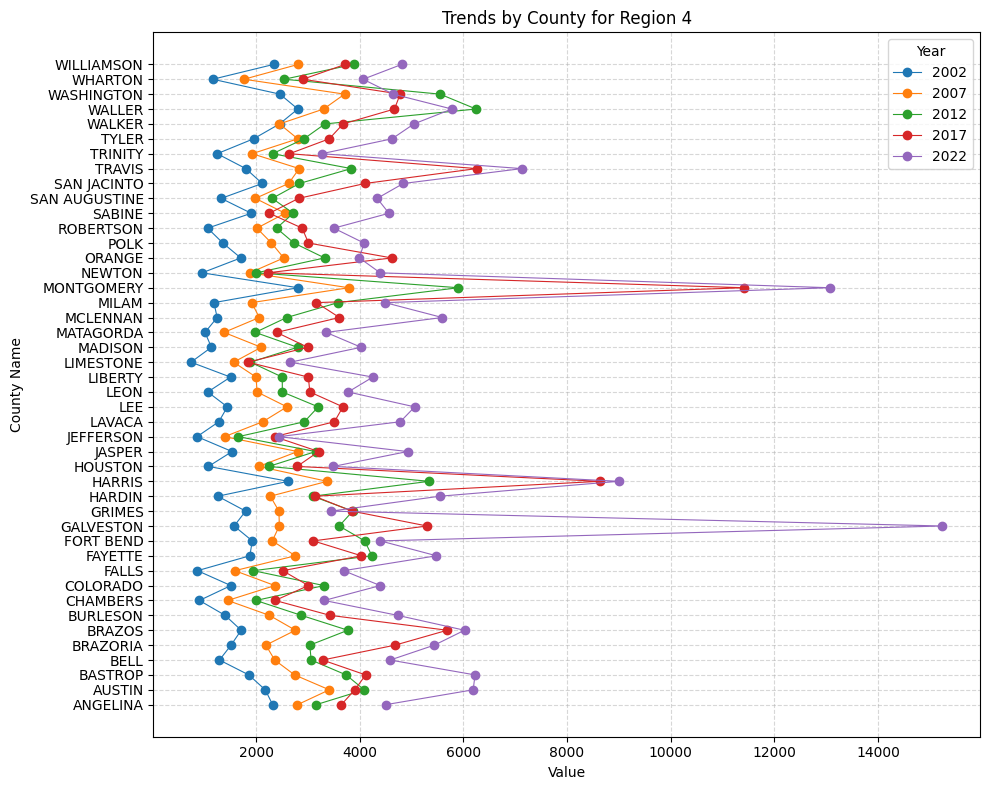

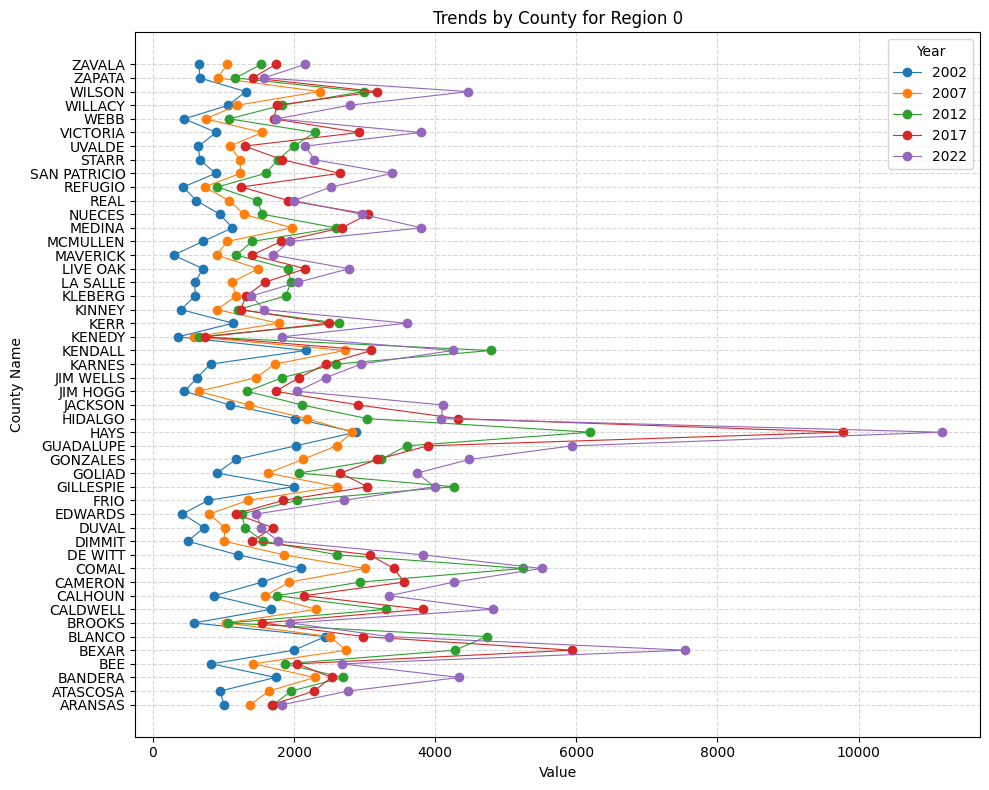

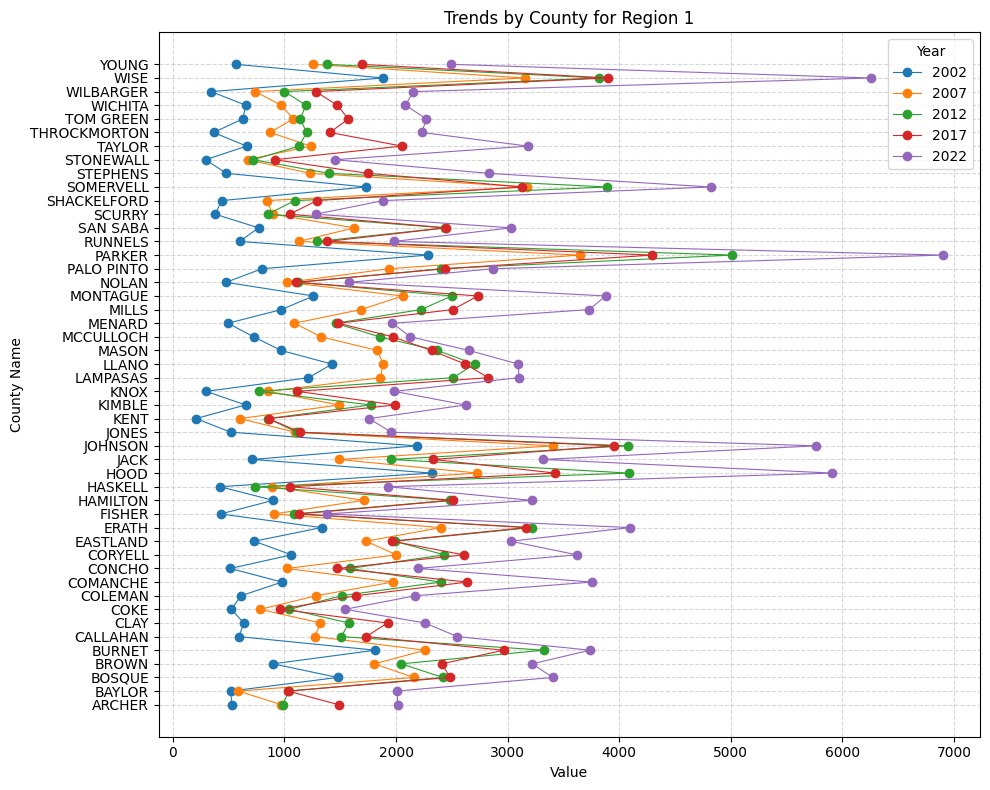

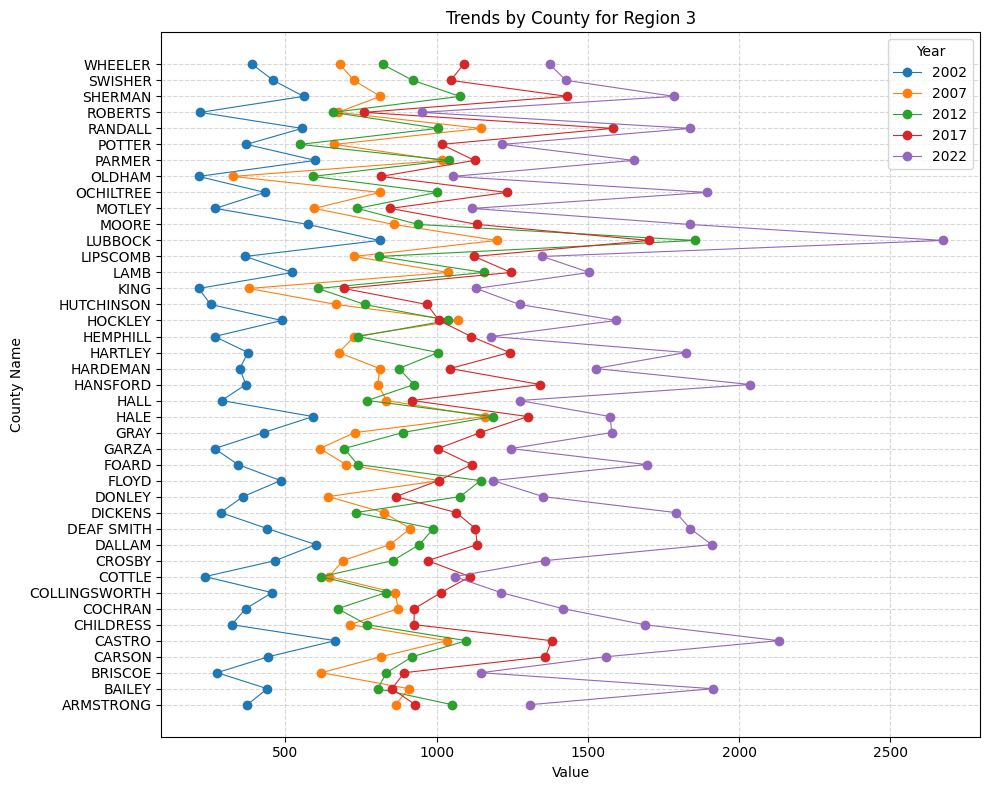

In [193]:
import matplotlib.pyplot as plt
import pandas as pd

# Clean numeric columns (remove commas and convert to float)
for col in ['Value_2002', 'Value_2007', 'Value_2012', 'Value_2017', 'Value_2022']:
    final_merged_gdf_year[col] = final_merged_gdf_year[col].replace(',', '', regex=True).astype(float)

# Get list of regions
regions = final_merged_gdf_year['Region'].unique()

# Dictionary to hold each region’s plot
region_figures = {}

# Loop through each region and create its plot
for region in regions:
    df_region = final_merged_gdf_year[final_merged_gdf_year['Region'] == region]

    fig, ax = plt.subplots(figsize=(10, 8))  # Adjusted figsize for better vertical space

    for year_col in ['Value_2002', 'Value_2007', 'Value_2012', 'Value_2017', 'Value_2022']:
        # Swapped x and y: x is now value, y is now County Name
        ax.plot(df_region[year_col], df_region['CNTY_NM'], marker='o',
                label=year_col.split('_')[1], linewidth=0.8)

    ax.set_title(f'Trends by County for {region}')
    ax.set_xlabel('Value')       # Swapped label
    ax.set_ylabel('County Name') # Swapped label

    # Typically usually don't need to rotate y-labels, but we ensure all counties are shown
    ax.set_yticks(df_region['CNTY_NM'])
    ax.set_yticklabels(df_region['CNTY_NM'])

    ax.legend(title='Year')
    ax.grid(True, linestyle='--', alpha=0.5)
    fig.tight_layout()

    # Save figure object in dictionary
    region_figures[region] = fig

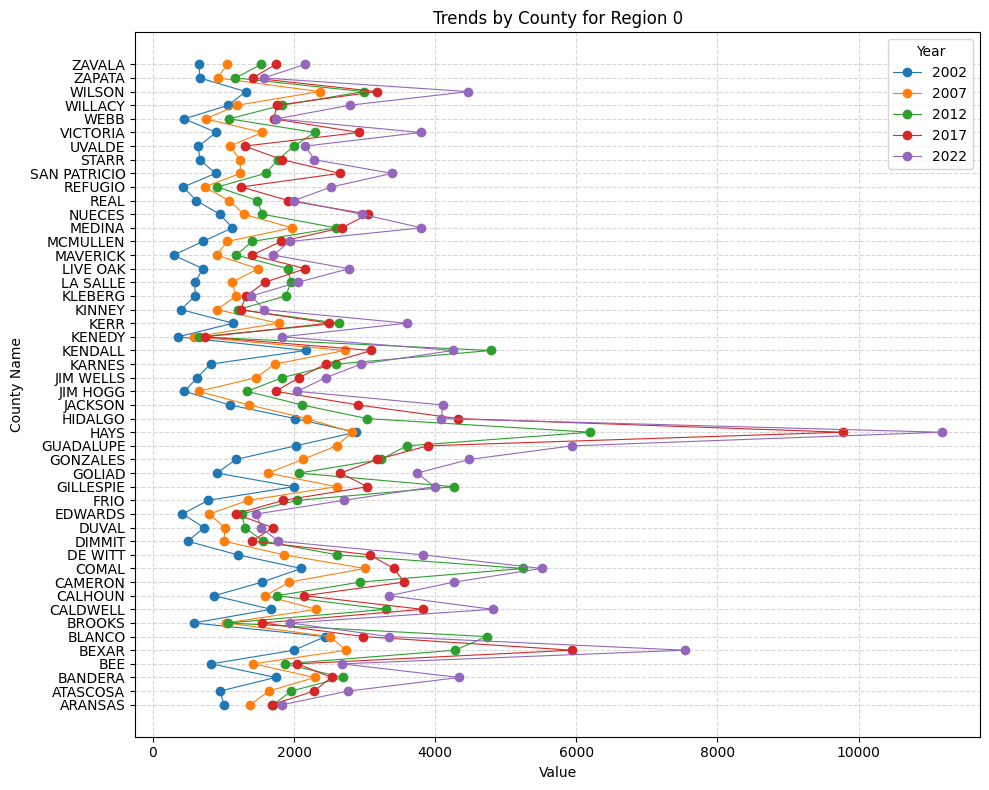

In [194]:
region_figures['Region 0']

**Hidalgo:**  
**Proximity to Urbanization/Border:** Hidalgo County includes McAllen and is part of a rapidly growing metropolitan area (McAllen-Edinburg-Mission). High land values are often driven by potential conversion to residential or commercial use, or intense demand for land on the US-Mexico border.

**Bexar:**
**Major Urban Center:** Bexar County is home to San Antonio, a massive urban hub. Its high agricultural land value is almost certainly due to urban sprawl and conversion pressure, driving up the price of remaining ag-zoned land.

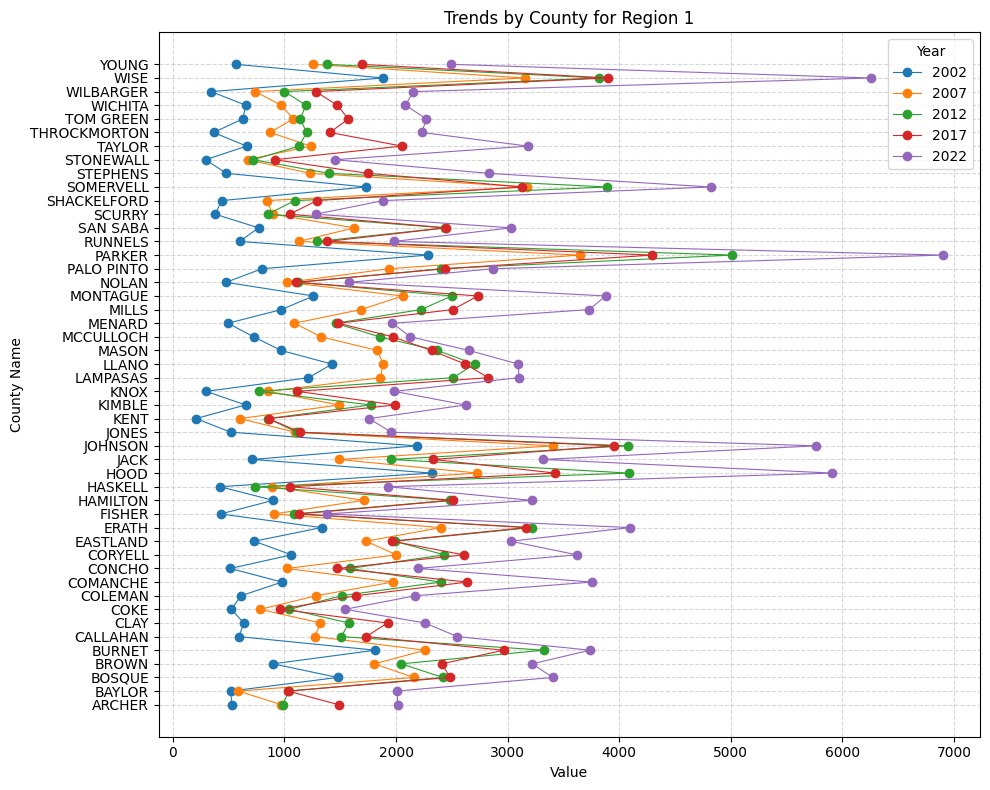

In [195]:
region_figures['Region 1']

Parker County is experiencing high demand for luxury ranchettes and suburban residential development, fueling the dramatic value increase.

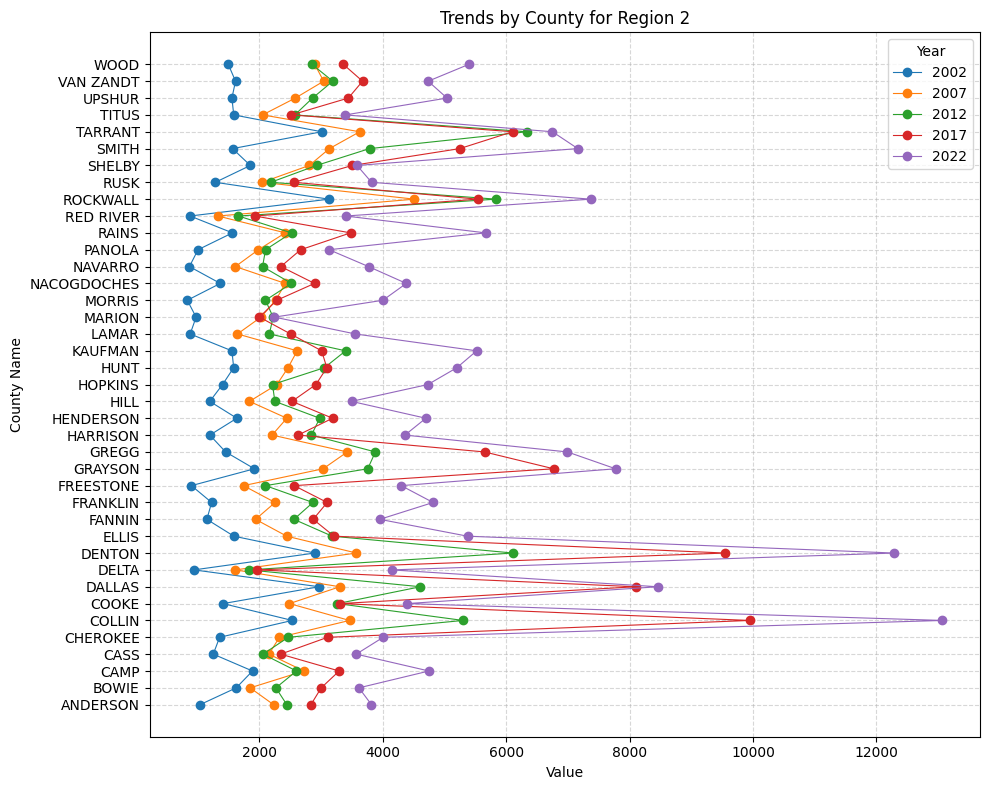

In [196]:
region_figures['Region 2']

Region 2: shows dramatic peaks in certain counties, notably reaching 13,000 $/acre in Collin County in 2022. This region's highest valuations suggest proximity to urban expansion areas and development pressure, elevating land values beyond purely agricultural considerations.

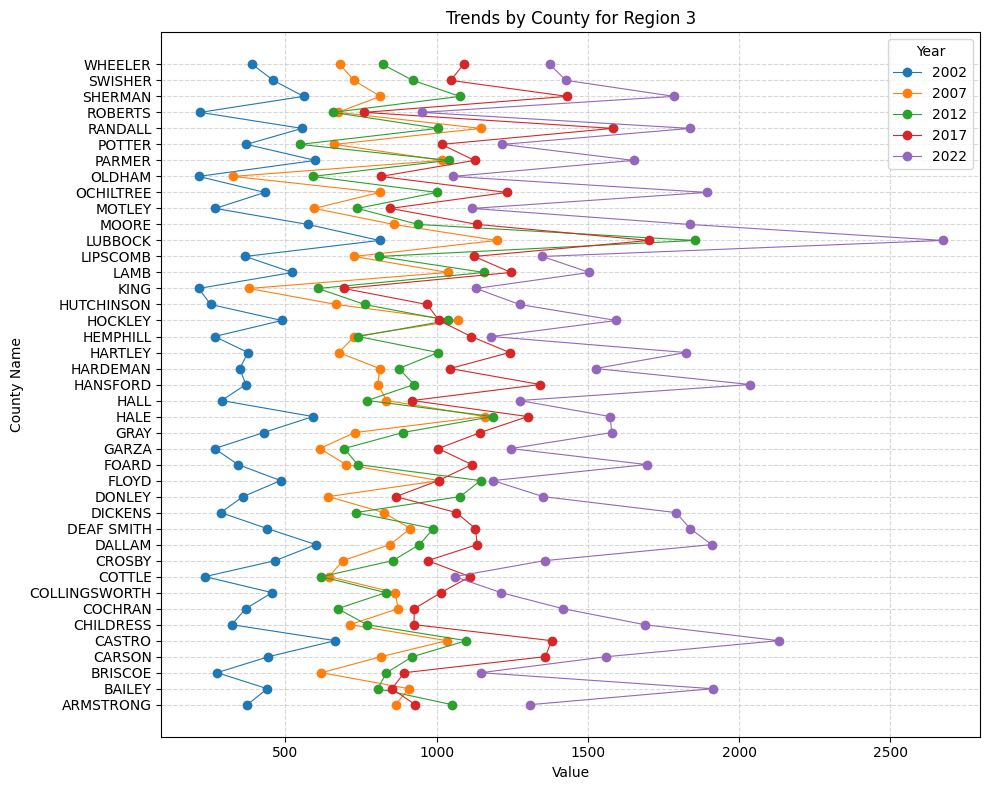

In [197]:
region_figures['Region 3']

Region 3: demonstrates moderate valuations ranging from 1,000-2,700 $/acre, with less dramatic volatility than southern regions. This reflects a more stable agricultural economy, likely based on grain production and cattle ranching.

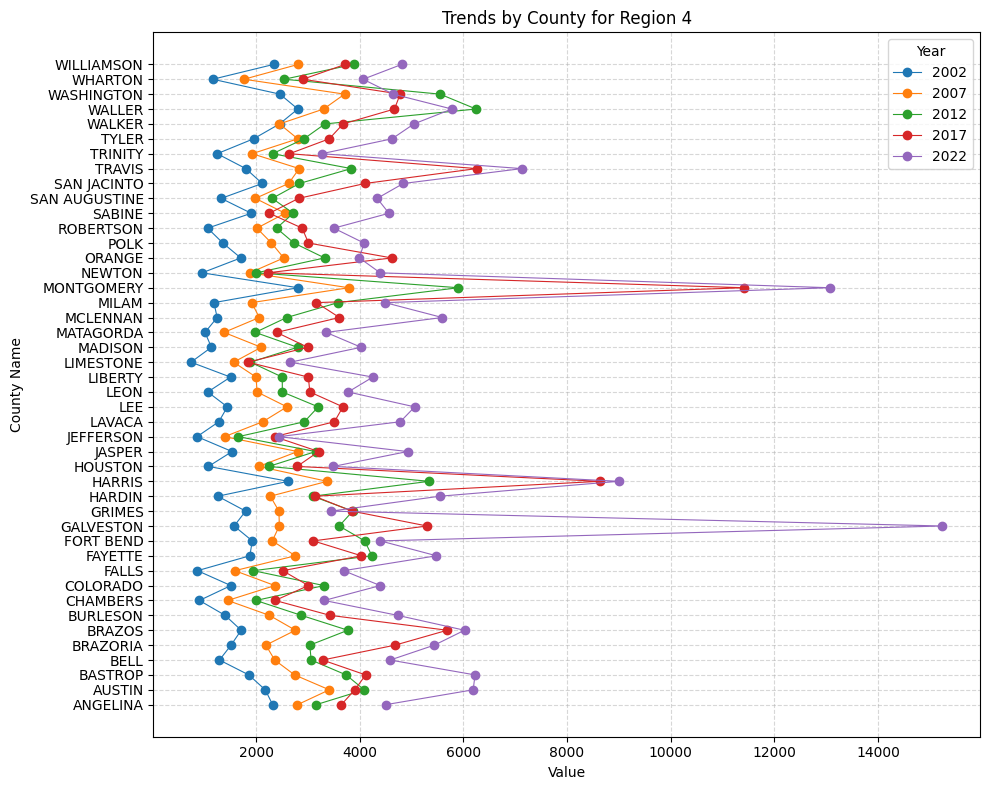

In [198]:
region_figures['Region 4']

Galveston County is a significant area for petroleum activity, primarily due to the Marathon Galveston Bay Refinery, one of the largest in the U.S., which processes crude oil into gasoline, distillates, and other products

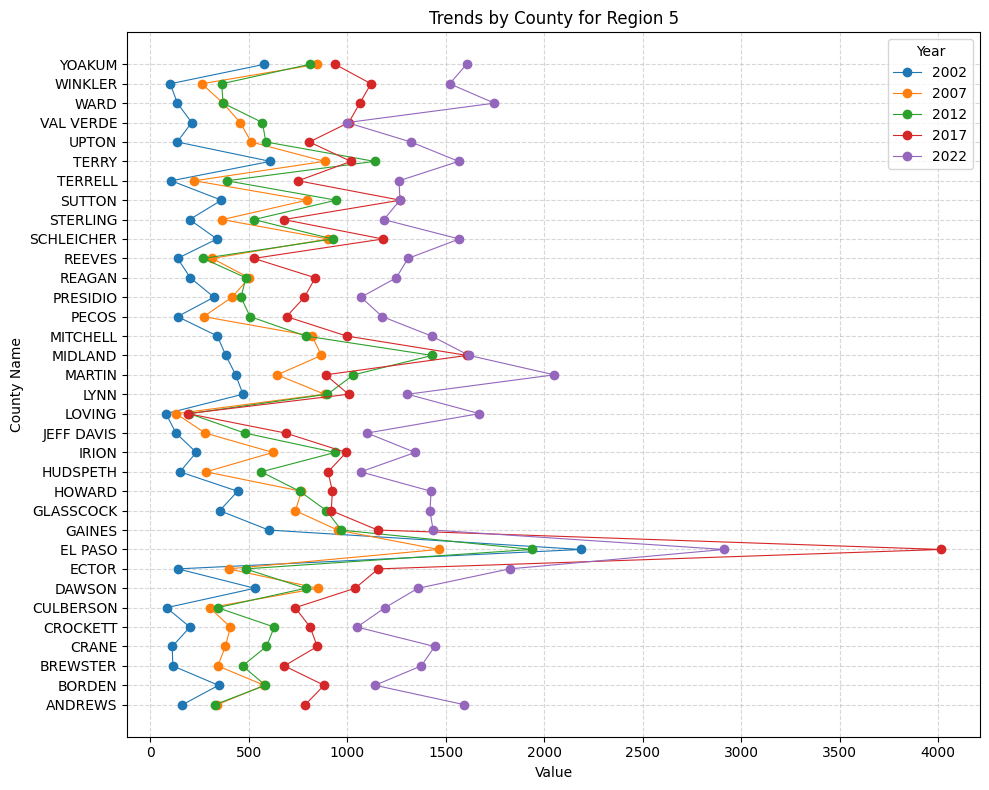

In [199]:
region_figures['Region 5']

El Paso County: The COVID-19 Effect (Unique to Border Trade): While other Texas regions saw a suburban/recreational land boom during COVID-19, El Paso's economy is heavily reliant on cross-border trade and the local government/military sector (Fort Bliss).

#Folium Map showing the well location

Texas Water development Board: https://www.twdb.texas.gov/mapping/gisdata.asp


In [200]:
! wget -q -O TWDBGroundwater.zip https://raw.githubusercontent.com/Nemipatel210/GIS/97e93b154b15799251044cb19a9c4749311c87d0/TWDBGroundwater.zip
zip_ref = zipfile.ZipFile('TWDBGroundwater.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping

In [201]:
!ls

County_Boundaries.cpg
County_Boundaries.dbf
County_Boundaries.prj
County_Boundaries.shp
County_Boundaries.shp.xml
County_Boundaries.shx
geo_export_5daba26a-1a9f-44f5-af78-b6c2b8a01b32.cpg
geo_export_5daba26a-1a9f-44f5-af78-b6c2b8a01b32.dbf
geo_export_5daba26a-1a9f-44f5-af78-b6c2b8a01b32.prj
geo_export_5daba26a-1a9f-44f5-af78-b6c2b8a01b32.shp
geo_export_5daba26a-1a9f-44f5-af78-b6c2b8a01b32.shx
major_aquifers.zip
NEW_major_aquifers_dd.dbf
NEW_major_aquifers_dd.prj
NEW_major_aquifers_dd.sbn
NEW_major_aquifers_dd.sbx
NEW_major_aquifers_dd.shp
NEW_major_aquifers_dd.shp.xml
NEW_major_aquifers_dd.shx
NEW_major_aquifers.lyr
readme.pdf
sample_data
TexasCountiesCartographic.zip
Texas_County_Boundaries_4845315375211121464.zip
TWDB_Groundwater.cpg
TWDB_Groundwater.dbf
TWDB_Groundwater.prj
TWDB_Groundwater.shp
TWDB_Groundwater.shx
TWDBGroundwater.zip
TxDOT_Urbanized_Areas.cpg
TxDOT_Urbanized_Areas.dbf
TxDOT_Urbanized_Areas.prj
TxDOT_Urbanized_Areas.shp
TxDOT_Urbanized_Areas.shp.xml
TxDOT_Urbanized_

In [202]:
txw1=gpd.read_file('TWDB_Groundwater.shp')

In [203]:
txw1.head(5)

,StateWellN,OwnerName,PrimaryWat,Elevation,WellDepth,WaterLevel,WaterQuali,AquiferCod,CoordDDLat,CoordDDLon,CountyName,WellType,geometry
0,0140301,Poole Chemical Company Danny Poole,Irrigation,4702,470.0,Historical,Y,"121OGDP - Ogallala Formation, Dakota Group and...",36.493333,-103.039167,Dallam,Withdrawal of Water,POINT (-103.03917 36.49333)
1,0140302,Gene Clark Clark Ranch,Stock,4644,180.0,Historical,N,"121OGDP - Ogallala Formation, Dakota Group and...",36.467500,-103.004444,Dallam,Withdrawal of Water,POINT (-103.00444 36.4675)
2,0140601,Clark Ranch manager: Mike Sanchez,Irrigation,4692,390.0,Historical,Y,211DKOP - Dakota Group and Purgatoire Formation,36.435000,-103.021389,Dallam,Withdrawal of Water,POINT (-103.02139 36.435)
3,0140901,Bernard Eads,Irrigation,4669,346.0,Historical,N,121OGLL - Ogallala Formation,36.383611,-103.015000,Dallam,Withdrawal of Water,POINT (-103.015 36.38361)
4,0140902,Langford Ranch,Stock,4690,160.0,Historical,N,121OGLD - Ogallala Formation and Dakota Group,36.408333,-103.036944,Dallam,Withdrawal of Water,POINT (-103.03694 36.40833)


In [204]:
import folium
from folium.plugins import FastMarkerCluster

# 1. Reproject data to EPSG:4326 (Standard Web Mercator)
wells_wgs84 = txw1.to_crs(epsg=4326)

# 2. Initialize the map centered on Texas
center_lat = wells_wgs84.geometry.y.mean()
center_lon = wells_wgs84.geometry.x.mean()

m_wells = folium.Map(location=[center_lat, center_lon], zoom_start=6, tiles='CartoDB positron')

# 3. OPTIMIZED APPROACH: Use FastMarkerCluster
# Extract coordinates as a list of lists [[lat, lon], [lat, lon], ...]
# Note: geometry.y is Latitude, geometry.x is Longitude
locations = list(zip(wells_wgs84.geometry.y, wells_wgs84.geometry.x))

# Add the cluster to the map
# This handles 100k+ points easily without crashing the browser
FastMarkerCluster(data=locations).add_to(m_wells)

# 4. Add Layer Control
folium.LayerControl().add_to(m_wells)

# Display the map
m_wells

Output hidden; open in https://colab.research.google.com to view.

In [205]:
import folium
from folium.plugins import FastMarkerCluster

# 1. Setup Data & Center
wells_wgs84 = txw1.to_crs(epsg=4326)
center_lat = wells_wgs84.geometry.y.mean()
center_lon = wells_wgs84.geometry.x.mean()

# 2. Initialize Map with a default base (e.g., CartoDB Positron for clean look)
m_wells = folium.Map(location=[center_lat, center_lon], zoom_start=6, tiles="CartoDB positron")

# 3. Add Custom Background Layers

# Option A: Esri Satellite (Great for seeing actual ground conditions)
folium.TileLayer(
    tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
    attr='Esri',
    name='Esri Satellite',
    overlay=False,
    control=True
).add_to(m_wells)

# 4. Add your Data (Using the FastCluster from before)
locations = list(zip(wells_wgs84.geometry.y, wells_wgs84.geometry.x))
FastMarkerCluster(data=locations, name="Wells Data").add_to(m_wells)

# 5. Add Layer Control (This creates the toggle button in top-right)
folium.LayerControl().add_to(m_wells)

m_wells

Output hidden; open in https://colab.research.google.com to view.

##Map To present

In [206]:
import folium
from folium.plugins import FastMarkerCluster

# 1. Setup Data & Center
wells_wgs84 = txw1.to_crs(epsg=4326)
center_lat = wells_wgs84.geometry.y.mean()
center_lon = wells_wgs84.geometry.x.mean()

# 2. Initialize Map with a default base
m_wells = folium.Map(location=[center_lat, center_lon], zoom_start=6, tiles="CartoDB positron")

# 3. Add Custom Background Layers
# Esri Satellite
folium.TileLayer(
    tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
    attr='Esri',
    name='Esri Satellite',
    overlay=False,
    control=True
).add_to(m_wells)

# 4. Add your Data with Popups
# Create a formatted string column for the popup so it looks nice
# "fill_na" is used just in case some rows have missing water data
wells_wgs84['popup_text'] = "<b>Primary Water Use:</b> " + wells_wgs84['PrimaryWat'].fillna('Unknown').astype(str)

# Zip 3 items: Latitude, Longitude, and the Text
locations = list(zip(
    wells_wgs84.geometry.y,
    wells_wgs84.geometry.x,
    wells_wgs84['popup_text']
))

# Define the JavaScript callback to create the popup
callback = """
function (row) {
    var marker = L.marker(new L.LatLng(row[0], row[1]));
    marker.bindPopup(row[2]);
    return marker;
}
"""

# Create the cluster with the callback
FastMarkerCluster(
    data=locations,
    callback=callback,
    name="Wells Data"
).add_to(m_wells)

# 5. Add Layer Control
folium.LayerControl().add_to(m_wells)

m_wells

Output hidden; open in https://colab.research.google.com to view.